# Comparison of the CESM2-FOSI Blob and CESM2-LENS Blob-analogs

## Imports

In [1]:
# ============================================================
# Imports
# ============================================================
import xarray as xr
import numpy as np
import pandas as pd
import json
import pickle
import os
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import gaussian_kde
import importlib
import analysis_functions as afuncs
import time
from eofs.xarray import Eof
import xesmf as xe
from collections import Counter
import pandas as pd
from scipy.stats import chi2_contingency
import cesm2_lens_utils

In [2]:
importlib.reload(afuncs)
importlib.reload(cesm2_lens_utils)

<module 'cesm2_lens_utils' from '/glade/u/home/cassiacai/measures/cesm2_lens_utils.py'>

In [3]:
# ============================================================
# Imports and setup
# ============================================================

base_paths = {
    'linear': '/glade/work/cmendiola/data_conv_lin_trend',
    'quadratic': '/glade/work/cmendiola/data_quad_trend',
    'ensmean': '/glade/work/cmendiola/data_ens_mean',
}

radii = [0, 1, 2, 3, 4]  # index positions corresponding to 1°-5° structuring elements
radius_labels = [1, 2, 3, 4, 5]

In [5]:
# ============================================================
# Imports and setup
# ============================================================
base_paths = {
    'noseas': '/glade/work/cmendiola/data_rm_seasonalcycle_mean',
}

radii = [0, 1, 2, 3, 4]  # index positions corresponding to 1°-5° structuring elements
radius_labels = [1, 2, 3, 4, 5]

In [6]:
# ============================================================
# For each method and radius, count final objects (after 75th-percentile area threshold)
# per ensemble member, then compute mean ± std across 100 members
# ============================================================
results_table = {method: {} for method in base_paths}

for method, base_path in base_paths.items():
    print(f"=== {method} ===")
    mhwobj_paths = [f'{base_path}/ens_{i}_mhwobj.nc' for i in range(100)]
    da_mhwobj = xr.open_mfdataset(mhwobj_paths, combine='nested', concat_dim='ensemble_member')

    for radius_idx, radius_label in zip(radii, radius_labels):
        labels_at_radius = da_mhwobj.labels.isel(radius=radius_idx).sel(time=slice('1979-01','2020-12'))

        counts_per_member = []
        for member_id in range(100):
            member_labels = labels_at_radius.isel(ensemble_member=member_id).compute()
            unique_ids = np.unique(member_labels.max(dim=('lat','lon')).data)
            unique_ids = unique_ids[~np.isnan(unique_ids)]
            unique_ids = unique_ids[unique_ids > 0]
            counts_per_member.append(len(unique_ids))

        counts_per_member = np.array(counts_per_member)
        mean_count = counts_per_member.mean()
        std_count = counts_per_member.std()

        results_table[method][radius_label] = (mean_count, std_count)
        print(f"  Radius {radius_label}°: {mean_count:.1f}±{std_count:.1f}")

=== noseas ===
  Radius 1°: 100.2±12.8
  Radius 2°: 67.5±12.0
  Radius 3°: 56.1±12.2
  Radius 4°: 52.2±11.6
  Radius 5°: 49.7±10.5


In [4]:
# ============================================================
# For each method and radius, count final objects (after 75th-percentile area threshold)
# per ensemble member, then compute mean ± std across 100 members
# ============================================================
results_table = {method: {} for method in base_paths}

for method, base_path in base_paths.items():
    print(f"=== {method} ===")
    mhwobj_paths = [f'{base_path}/ens_{i}_mhwobj.nc' for i in range(100)]
    da_mhwobj = xr.open_mfdataset(mhwobj_paths, combine='nested', concat_dim='ensemble_member')

    for radius_idx, radius_label in zip(radii, radius_labels):
        labels_at_radius = da_mhwobj.labels.isel(radius=radius_idx).sel(time=slice('1979-01','2020-12'))

        counts_per_member = []
        for member_id in range(100):
            member_labels = labels_at_radius.isel(ensemble_member=member_id).compute()
            unique_ids = np.unique(member_labels.max(dim=('lat','lon')).data)
            unique_ids = unique_ids[~np.isnan(unique_ids)]
            unique_ids = unique_ids[unique_ids > 0]
            counts_per_member.append(len(unique_ids))

        counts_per_member = np.array(counts_per_member)
        mean_count = counts_per_member.mean()
        std_count = counts_per_member.std()

        results_table[method][radius_label] = (mean_count, std_count)
        print(f"  Radius {radius_label}°: {mean_count:.1f}±{std_count:.1f}")

=== linear ===
  Radius 1°: 126.8±10.3
  Radius 2°: 89.7±8.6
  Radius 3°: 76.7±8.9
  Radius 4°: 74.1±9.7
  Radius 5°: 71.6±9.3
=== quadratic ===
  Radius 1°: 122.5±10.7
  Radius 2°: 88.1±9.4
  Radius 3°: 74.2±9.2
  Radius 4°: 72.0±9.0
  Radius 5°: 68.8±9.5
=== ensmean ===
  Radius 1°: 120.0±11.2
  Radius 2°: 86.7±9.8
  Radius 3°: 74.3±8.1
  Radius 4°: 70.1±9.3
  Radius 5°: 68.8±9.2


In [8]:
# ============================================================
# Canonical footprint (mask_3) - used throughout for Blob-analog identification and area-averaging
# ============================================================
mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj
mask_3_binary = xr.where(mask_3 > 0.1, 1, 0)

def calc_frac_overlap(one_obj, mask):
    one_obj_binary = xr.where(one_obj > 0, 1., 0)
    overlap = one_obj_binary + mask
    overlap_only = xr.where(overlap > 1, 1., 0)
    overlap_frac = overlap_only.sum(dim=('lat','lon')) / mask.sum()
    if overlap_frac.size > 0 and overlap_frac.notnull().any():
        return overlap_frac.max().item()
    return 0.0

In [9]:
# ============================================================
# Check for Blob-analogs WITHIN CESM2-FOSI itself (not LENS)
# Using the same >50% canonical-footprint-overlap criterion
# ============================================================
fosi_blobs = xr.open_dataset('fosi_blobs_r2.nc').labels  # already time-restricted? check below
fosi_blobs_check = fosi_blobs.sel(time=slice('1979-01','2020-12'))  # match your analysis period

unique_ids = np.unique(fosi_blobs_check.max(dim=('lat','lon')).compute().data)
unique_ids = unique_ids[~np.isnan(unique_ids)]
unique_ids = unique_ids[unique_ids > 0]

print(f"Total detected NEP MHW objects in FOSI (1979-2020): {len(unique_ids)}")

fosi_analog_overlaps = []
for object_id in unique_ids:
    one_obj = fosi_blobs_check.where(fosi_blobs_check == object_id, drop=False)
    overlap_val = calc_frac_overlap(one_obj, mask_3_binary)
    fosi_analog_overlaps.append((object_id, overlap_val))

fosi_analogs_50pct = [oid for oid, ov in fosi_analog_overlaps if ov > 0.5]
print(f"FOSI objects exceeding 50% canonical footprint overlap: {len(fosi_analogs_50pct)}")
print(f"Object IDs: {fosi_analogs_50pct}")

Total detected NEP MHW objects in FOSI (1979-2020): 106
FOSI objects exceeding 50% canonical footprint overlap: 2
Object IDs: [94.0, 110.0]


In [10]:
# ============================================================
# Characterize object 110 - when did it occur, how long, how intense?
# ============================================================
object_id_2 = 110.0
times_present_2 = fosi_blobs_check.time.where((fosi_blobs_check == object_id_2).any(dim=('lat','lon')), drop=True)

print(f"Object 110 duration: {len(times_present_2)} months")
print(f"Start: {str(times_present_2.values[0])[:10]}")
print(f"End: {str(times_present_2.values[-1])[:10]}")

Object 110 duration: 10 months
Start: 2019-05-15
End: 2020-02-15


In [15]:
# ============================================================
# Get its physical characteristics using the same pipeline as the Blob (object 94)
# ============================================================
mask_2 = (fosi_blobs_check == object_id_2)
mask_2_trimmed = mask_2.sel(time=times_present_2)

regridded_ssta_no_trend_NEP_da = regridded_ssta_no_trend_NEP['__xarray_dataarray_variable__']

ssta_masked_2 = regridded_ssta_no_trend_NEP_da.sel(time=times_present_2).where(mask_2_trimmed)
extent_ts_2 = (mask_2_trimmed.astype(int) * cell_area_da_fosi).sum(dim=('lat','lon'))

print(f"Intensity mean: {float(ssta_masked_2.mean()):.2f}°C")
print(f"Intensity max: {float(ssta_masked_2.max()):.2f}°C")
print(f"Extent mean: {float(extent_ts_2.mean()):,.0f} km²")
print(f"Extent max: {float(extent_ts_2.max()):,.0f} km²")

Intensity mean: 0.94°C
Intensity max: 2.64°C
Extent mean: 12,043,308 km²
Extent max: 17,833,427 km²


In [16]:
# ============================================================
# What fraction of the canonical footprint does it actually overlap?
# ============================================================
for object_id in [94.0, 110.0]:
    one_obj = fosi_blobs_check.where(fosi_blobs_check == object_id, drop=False)
    overlap_val = calc_frac_overlap(one_obj, mask_3_binary)
    print(f"Object {object_id}: overlap = {overlap_val:.2f}")

Object 94.0: overlap = 0.61
Object 110.0: overlap = 0.69


In [17]:
mask_2 = (fosi_blobs_check == 110.0)
mask_2_trimmed = mask_2.sel(time=times_present_2)

ssta_masked_2 = regridded_ssta_no_trend_NEP_da.sel(time=times_present_2).where(mask_2_trimmed)
extent_ts_2 = (mask_2_trimmed.astype(int) * cell_area_da_fosi).sum(dim=('lat','lon'))

print(f"Intensity mean: {float(ssta_masked_2.mean()):.2f}°C")
print(f"Intensity max: {float(ssta_masked_2.max()):.2f}°C")
print(f"Extent mean: {float(extent_ts_2.mean()):,.0f} km²")
print(f"Extent max: {float(extent_ts_2.max()):,.0f} km²")

overlap_val_110 = calc_frac_overlap(fosi_blobs_check.where(fosi_blobs_check == 110.0, drop=False), mask_3_binary)
print(f"Canonical footprint overlap: {overlap_val_110:.2f}")

Intensity mean: 0.94°C
Intensity max: 2.64°C
Extent mean: 12,043,308 km²
Extent max: 17,833,427 km²
Canonical footprint overlap: 0.69


In [18]:
# ============================================================
# Onset centroid - is it Gulf-of-Alaska concentrated, matching Blob 2.0's documented pattern?
# ============================================================
first_time_110 = times_present_2.values[0]
mask_at_onset = mask_2.sel(time=first_time_110)

lat2d, lon2d = xr.broadcast(mask_at_onset.lat, mask_at_onset.lon)
w = mask_at_onset.where(mask_at_onset)
centroid_lat = float((lat2d*w).sum()/w.sum())
centroid_lon = float((lon2d*w).sum()/w.sum())
print(f"Onset centroid: {centroid_lat:.1f}°N, {centroid_lon:.1f}°E")

Onset centroid: 28.6°N, 211.3°E


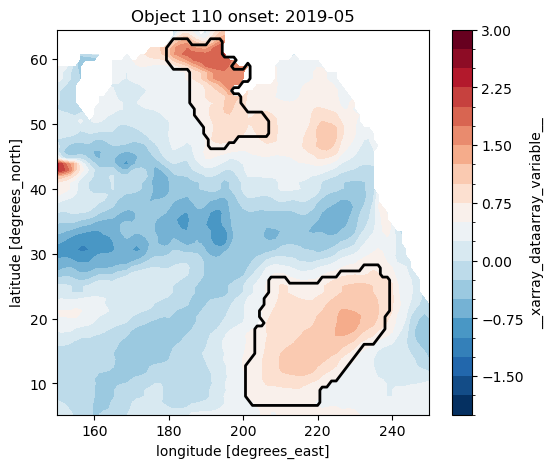

In [19]:
# Quick sanity check: plot the actual spatial pattern at onset to see where it's really concentrated
ssta_at_onset_110 = regridded_ssta_no_trend_NEP_da.sel(time=first_time_110)
mask_at_onset_110 = mask_2.sel(time=first_time_110).astype(int)

fig, ax = plt.subplots(figsize=(6,5))
ssta_at_onset_110.plot.contourf(ax=ax, levels=np.linspace(-2,3,21), cmap='RdBu_r')
ax.contour(mask_at_onset_110.lon, mask_at_onset_110.lat, mask_at_onset_110, levels=[0.5], colors='black', linewidths=2)
ax.set_title(f'Object 110 onset: {str(first_time_110)[:7]}')
plt.show()

In [20]:
# Check if the mask has two spatially disconnected clusters, or one contiguous but elongated shape
lat_vals = mask_at_onset_110.where(mask_at_onset_110==1, drop=True).lat.values
print(f"Latitude range of masked region at onset: {lat_vals.min():.1f} to {lat_vals.max():.1f}")

# Rough check: fraction of masked area north of 45N (Gulf of Alaska) vs south of 25N (tropical/subtropical)
mask_gulf = mask_at_onset_110.where(mask_at_onset_110.lat > 45, drop=False).sum()
mask_tropical = mask_at_onset_110.where(mask_at_onset_110.lat < 25, drop=False).sum()
mask_total = mask_at_onset_110.sum()
print(f"Fraction of masked area north of 45°N (Gulf of Alaska): {float(mask_gulf/mask_total)*100:.1f}%")
print(f"Fraction of masked area south of 25°N (tropical/subtropical): {float(mask_tropical/mask_total)*100:.1f}%")

Latitude range of masked region at onset: 7.1 to 62.7
Fraction of masked area north of 45°N (Gulf of Alaska): 29.5%
Fraction of masked area south of 25°N (tropical/subtropical): 66.0%


## Data

In [3]:
# ============================================================
# Filepaths for the four detrending methods (CONFIRMED CORRECT this session)
# ============================================================
base_paths = {
    'linear': '/glade/work/cmendiola/data_conv_lin_trend',
    'quadratic': '/glade/work/cmendiola/data_quad_trend',
    'ensmean': '/glade/work/cmendiola/data_ens_mean',
    'noseas': '/glade/work/cmendiola/data_rm_seasonalcycle_mean',
}

RADIUS_INDEX_FOR_2DEG = 1  # confirmed: index 1 = 2° structuring element, consistent across all four methods

# SSTa variable names per method (confirmed this session)
ssta_varnames = {
    'linear': '__xarray_dataarray_variable__',
    'quadratic': '__xarray_dataarray_variable__',
    'ensmean': 'SST',
    'noseas': '__xarray_dataarray_variable__',
}

In [4]:
# ============================================================
# Load all four methods: labels + SSTa (radius-corrected, time-restricted to 1979-2020)
# ============================================================
da_mhwobj_labels_by_method = {}
ssta_notrend_by_method = {}

for method, base_path in base_paths.items():
    mhwobj_paths = [f'{base_path}/ens_{i}_mhwobj.nc' for i in range(100)]
    ssta_paths = [f'{base_path}/ens_{i}_ssta.nc' for i in range(100)]

    da_mhwobj = xr.open_mfdataset(mhwobj_paths, combine='nested', concat_dim='ensemble_member')
    da_mhwobj_labels_by_method[method] = da_mhwobj.labels.sel(radius=RADIUS_INDEX_FOR_2DEG).sel(time=slice('1979-01','2020-12')).compute()

    ssta_notrend_by_method[method] = xr.open_mfdataset(ssta_paths, combine='nested', concat_dim='ensemble_member').compute()

print("All four methods loaded.")
print({m: da_mhwobj_labels_by_method[m].sizes for m in base_paths})

All four methods loaded.
{'linear': Frozen({'ensemble_member': 100, 'time': 504, 'lat': 64, 'lon': 81}), 'quadratic': Frozen({'ensemble_member': 100, 'time': 504, 'lat': 64, 'lon': 81}), 'ensmean': Frozen({'ensemble_member': 100, 'time': 504, 'lat': 64, 'lon': 81}), 'noseas': Frozen({'ensemble_member': 100, 'time': 504, 'lat': 64, 'lon': 81})}


In [5]:
# ============================================================
# Canonical footprint (mask_3) - used throughout for Blob-analog identification and area-averaging
# ============================================================
mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj
mask_3_binary = xr.where(mask_3 > 0.1, 1, 0)

def calc_frac_overlap(one_obj, mask):
    one_obj_binary = xr.where(one_obj > 0, 1., 0)
    overlap = one_obj_binary + mask
    overlap_only = xr.where(overlap > 1, 1., 0)
    overlap_frac = overlap_only.sum(dim=('lat','lon')) / mask.sum()
    if overlap_frac.size > 0 and overlap_frac.notnull().any():
        return overlap_frac.max().item()
    return 0.0

In [6]:
# ============================================================
# Cell area weighting (CESM2-LENS grid)
# ============================================================
R = 6371.0
grid_ref = da_mhwobj_labels_by_method['linear']
dlat = np.deg2rad(np.mean(np.diff(grid_ref.lat.values)))
dlon = np.deg2rad(np.mean(np.diff(grid_ref.lon.values)))
cell_area = (R**2) * dlat * dlon * np.cos(np.deg2rad(grid_ref.lat))
cell_area_da = xr.DataArray(cell_area.values, coords={'lat': grid_ref.lat}, dims='lat')

print(f"Equatorial gridcell area check: {float(cell_area_da.sel(lat=grid_ref.lat.values[len(grid_ref.lat)//2])):.1f} km²")

Equatorial gridcell area check: 11881.4 km²


In [7]:
# ============================================================
# Blob-analog IDs (50% overlap threshold, index 4 of thresholds array) - CORRECTED for all four methods
# ============================================================
thresholds = np.arange(0.1, 0.81, 0.1)

with open('object_id_ls_greenmask_linear_corrected.json', 'r') as f:
    linear_all_thresholds = json.load(f)
with open('object_id_ls_greenmask_ensmean_corrected.json', 'r') as f:
    ensmean_all_thresholds = json.load(f)
with open('object_id_ls_greenmask_quadratic_corrected.json', 'r') as f:
    quadratic_all_thresholds = json.load(f)
with open('object_id_ls_greenmask_noseas_corrected.json', 'r') as f:
    noseas_all_thresholds = json.load(f)
# adjust filenames/paths for quadratic and noseas to match wherever you saved those corrected versions

blob_analog_ids = {
    'linear': linear_all_thresholds[4],
    'ensmean': ensmean_all_thresholds[4],
    'quadratic': ensmean_all_thresholds[4],
    'noseas': ensmean_all_thresholds[4],
}

In [12]:
# ============================================================
# FOSI Blob (Label 94, confirmed 20-month window: May 2014 - Dec 2015)
# ============================================================
fosi_blobs = xr.open_dataset('fosi_blobs_r2.nc').labels
object_id = 94.0
blob_times = fosi_blobs.time.where((fosi_blobs == object_id).any(dim=('lat','lon')), drop=True)

regridded_ssta_no_trend_NEP = xr.open_dataset('/glade/derecho/scratch/cassiacai/regridded_ssta_no_trend_NEP.nc')

# Sanity check - should match your confirmed event max of 2.34°C
print(regridded_ssta_no_trend_NEP.sel(time='2015-07').max().values)
print(f"n_months in blob_times: {len(blob_times)}")  # should be 20

<bound method Mapping.values of <xarray.Dataset> Size: 12B
Dimensions:                        ()
Coordinates:
    z_t                            float32 4B ...
Data variables:
    __xarray_dataarray_variable__  float64 8B 2.345>
n_months in blob_times: 20


## Extract characteristics for EVERY Blob-analog (primary method: linear)

In [11]:
# Load or initialize results dict (so you can resume if interrupted partway through)
results_path = 'analog_mld_results.pkl'
if os.path.exists(results_path):
    with open(results_path, 'rb') as f:
        all_analog_mld = pickle.load(f)
    print(f"Resuming - {len(all_analog_mld)} analogs already processed")
else:
    all_analog_mld = {}

In [33]:
lat_slice = slice(204, 367)
lon_slice = slice(190, 280)

mean_image_pop_files = [f'/glade/derecho/scratch/cassiacai/mean_image_{i}_POP.nc' for i in range(1, 8)]
mean_images_pop = [xr.open_dataset(file) for file in mean_image_pop_files]
masks_pop = [xr.where(image.__xarray_dataarray_variable__ > 0.1, 1, 0) for image in mean_images_pop]
NEPac_MHW_renamed_latlon = masks_pop[2].isel(nlat=lat_slice, nlon=lon_slice).rename({'nlat': 'nlat_t', 'nlon': 'nlon_t'})
# adjust if the mask variable name differs - confirm against your actual masks_pop[2] structure

def process_one_member_mld(member_id, labels_full, analog_ids_for_member, all_analog_mld, NEPac_mask):
    if not analog_ids_for_member:
        print(f"Member {member_id}: no analogs, skipping")
        return all_analog_mld

    member_labels = labels_full.isel(ensemble_member=member_id)

    ds_hist, ds_fut = afuncs.get_ds_var('/glade/campaign/cgd/cesm/CESM2-LE/ocn/proc/tseries/month_1/HMXL/', 'HMXL', 'ocn', member_id)

    hmxl_hist_cropped = ds_hist.HMXL.isel(nlat=lat_slice, nlon=lon_slice)
    hmxl_fut_cropped = ds_fut.HMXL.isel(nlat=lat_slice, nlon=lon_slice)
    hmxl_combined = xr.concat([hmxl_hist_cropped, hmxl_fut_cropped], dim='time').sel(time=slice('1979-01-01','2020-12-01'))
    hmxl_combined = hmxl_combined.rename({'nlat': 'nlat_t', 'nlon': 'nlon_t'}).assign_coords(
        nlat_t=NEPac_mask.nlat_t, nlon_t=NEPac_mask.nlon_t
    ) / 100.0

    for analog_id in analog_ids_for_member:
        key = (member_id, analog_id)
        if key in all_analog_mld:
            continue

        times_present = member_labels.time.where((member_labels == analog_id).any(dim=('lat','lon')), drop=True)
        if len(times_present) == 0:
            continue

        hmxl_masked = (hmxl_combined.sel(time=times_present) * NEPac_mask).compute()
        hmxl_masked = hmxl_masked.where(hmxl_masked != 0)

        all_analog_mld[key] = {
            'mld_mean': float(hmxl_masked.mean()),
            'mld_max': float(hmxl_masked.max()),
            'mld_p90': float(hmxl_masked.quantile(0.9)),  # NEW
        }

    print(f"Member {member_id}: done ({len(analog_ids_for_member)} analogs)")
    return all_analog_mld

In [30]:
labels_full = da_mhwobj_labels_by_method['linear']

In [31]:
if os.path.exists(results_path):
    os.remove(results_path)
all_analog_mld = {}

In [28]:
member0_keys = [k for k in all_analog_mld.keys() if k[0] == 0]
print(f"Member 0 has {len(member0_keys)} analogs with MLD computed")

for k in member0_keys:
    print(k, all_analog_mld[k])

Member 0 has 4 analogs with MLD computed
(0, 28.0) {'mld_mean': 35.1125372057195, 'mld_max': 123.23858642578125}
(0, 43.0) {'mld_mean': 40.123765836332545, 'mld_max': 158.23272705078125}
(0, 58.0) {'mld_mean': 56.40374647746785, 'mld_max': 206.50076293945312}
(0, 85.0) {'mld_mean': 40.022922241983515, 'mld_max': 93.28509521484375}


In [34]:
for member_id in range(100):
    print(member_id)
    all_analog_mld = process_one_member_mld(member_id, labels_full, blob_analog_ids['linear'][member_id], all_analog_mld, NEPac_MHW_renamed_latlon)
    with open(results_path, 'wb') as f:
        pickle.dump(all_analog_mld, f)

print(f"Done. Total analogs with MLD: {len(all_analog_mld)}")

0
Member 0: done (4 analogs)
1
Member 1: done (2 analogs)
2
Member 2: done (4 analogs)
3
Member 3: done (3 analogs)
4
Member 4: done (5 analogs)
5
Member 5: done (5 analogs)
6
Member 6: done (2 analogs)
7
Member 7: done (3 analogs)
8
Member 8: done (3 analogs)
9
Member 9: done (3 analogs)
10
Member 10: done (4 analogs)
11
Member 11: done (2 analogs)
12
Member 12: done (4 analogs)
13
Member 13: done (2 analogs)
14
Member 14: done (3 analogs)
15
Member 15: done (4 analogs)
16
Member 16: done (3 analogs)
17
Member 17: done (3 analogs)
18
Member 18: done (3 analogs)
19
Member 19: done (2 analogs)
20
Member 20: done (4 analogs)
21
Member 21: done (4 analogs)
22
Member 22: done (3 analogs)
23
Member 23: done (4 analogs)
24
Member 24: done (3 analogs)
25
Member 25: done (3 analogs)
26
Member 26: done (4 analogs)
27
Member 27: done (4 analogs)
28
Member 28: done (6 analogs)
29
Member 29: done (4 analogs)
30
Member 30: done (3 analogs)
31
Member 31: done (2 analogs)
32
Member 32: done (3 analog

In [ ]:
# FOSI Blob MLD (raw): mean=57.8m, max=225.7m, p90=103.8m
# from g_32_FOSI_vertical_temp_structure

In [38]:
# ============================================================
# Extract characteristics for EVERY Blob-analog (primary method: linear)
# ============================================================
def compute_analog_characteristics(labels_da, analog_id, ssta_da, mld_da, cell_area_da):
    mask = (labels_da == analog_id)
    times_present = labels_da.time.where(mask.any(dim=('lat','lon')), drop=True)
    if len(times_present) == 0:
        return None

    mask_trimmed = mask.sel(time=times_present)
    ssta_masked = ssta_da.sel(time=times_present).where(mask_trimmed)
    mld_masked = mld_da.sel(time=times_present).where(mask_trimmed) if mld_da is not None else None
    extent_ts = (mask_trimmed.astype(int) * cell_area_da).sum(dim=('lat','lon'))

    result = {
        'duration': len(times_present),
        'intensity_mean': float(ssta_masked.mean()),
        'intensity_max': float(ssta_masked.max()),
        'extent_mean': float(extent_ts.mean()),
        'extent_max': float(extent_ts.max()),
        'extent_cumulative': float(extent_ts.sum()),
    }
    if mld_masked is not None:
        result['mld_mean'] = float(mld_masked.mean())
        result['mld_max'] = float(mld_masked.max())
    return result

all_analog_characteristics = {}
labels_full = da_mhwobj_labels_by_method['linear']
ssta_full = ssta_notrend_by_method['linear']['__xarray_dataarray_variable__']

for member_id in range(100):
    print(member_id)
    member_labels = labels_full.isel(ensemble_member=member_id)
    member_ssta = ssta_full.isel(ensemble_member=member_id)
    for analog_id in blob_analog_ids['linear'][member_id]:
        result = compute_analog_characteristics(member_labels, analog_id, member_ssta, None, cell_area_da)
        if result:
            all_analog_characteristics[(member_id, analog_id)] = result

print(f"Total analogs characterized: {len(all_analog_characteristics)}")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Total analogs characterized: 331


In [113]:
# Save everything we've built this session
save_bundle = {
    'all_analog_characteristics': all_analog_characteristics,   # duration, intensity, extent, MLD per analog
    'blob_fosi_characteristics': blob_fosi_characteristics,      # FOSI Blob's own values
    # 'analog_climate_stats': analog_climate_stats,                # Niño3.4/PDO per analog
    # 'blob_climate': blob_climate,                                # FOSI Blob's own Niño3.4/PDO values
}

with open('/glade/derecho/scratch/cassiacai/section_3_2_analog_data.pkl', 'wb') as f:
    pickle.dump(save_bundle, f)

print("Saved section_3_2_analog_data.pkl")
print(f"  - {len(all_analog_characteristics)} analogs with physical characteristics")
# print(f"  - {len(analog_climate_stats)} analogs with climate context")

Saved section_3_2_analog_data.pkl
  - 331 analogs with physical characteristics


In [39]:
for key, mld_stats in all_analog_mld.items():
    if key in all_analog_characteristics:
        all_analog_characteristics[key].update(mld_stats)

print(f"Analogs with full characteristics (incl. MLD): "
      f"{sum(1 for v in all_analog_characteristics.values() if 'mld_mean' in v)} / {len(all_analog_characteristics)}")

Analogs with full characteristics (incl. MLD): 331 / 331


In [40]:
sample_keys = list(all_analog_characteristics.keys())[:5]
for k in sample_keys:
    print(k, all_analog_characteristics[k])

(0, 28.0) {'duration': 4, 'intensity_mean': 1.1449258083532783, 'intensity_max': 2.054659360954304, 'extent_mean': 9719089.75639243, 'extent_max': 16034480.422872044, 'extent_cumulative': 38876359.02556972, 'mld_mean': 35.1125372057195, 'mld_max': 123.23858642578125, 'mld_p90': 54.471997451782215}
(0, 43.0) {'duration': 6, 'intensity_mean': 1.2303421298958819, 'intensity_max': 3.2082361862371727, 'extent_mean': 5841072.131394535, 'extent_max': 10197047.295930523, 'extent_cumulative': 35046432.78836721, 'mld_mean': 40.123765836332545, 'mld_max': 158.23272705078125, 'mld_p90': 68.67738037109375}
(0, 58.0) {'duration': 20, 'intensity_mean': 1.1175425782794577, 'intensity_max': 3.25963174070813, 'extent_mean': 11007355.613692084, 'extent_max': 17351694.915759716, 'extent_cumulative': 220147112.27384168, 'mld_mean': 56.40374647746785, 'mld_max': 206.50076293945312, 'mld_p90': 106.9249496459961}
(0, 85.0) {'duration': 7, 'intensity_mean': 1.3049243401237254, 'intensity_max': 3.18635082809578

In [14]:
R = 6371.0
dlat_fosi = np.deg2rad(np.mean(np.diff(fosi_blobs.lat.values)))
dlon_fosi = np.deg2rad(np.mean(np.diff(fosi_blobs.lon.values)))
cell_area_fosi = (R**2) * dlat_fosi * dlon_fosi * np.cos(np.deg2rad(fosi_blobs.lat))
cell_area_da_fosi = xr.DataArray(cell_area_fosi.values, coords={'lat': fosi_blobs.lat}, dims='lat')

print(f"FOSI equatorial check: {float(cell_area_da_fosi.sel(lat=fosi_blobs.lat.values[len(fosi_blobs.lat)//2])):.1f} km²")

# --- Duration, intensity, extent for the FOSI Blob ---
def compute_analog_characteristics(labels_da, analog_id, ssta_da, mld_da, cell_area_da):
    mask = (labels_da == analog_id)
    times_present = labels_da.time.where(mask.any(dim=('lat','lon')), drop=True)
    if len(times_present) == 0:
        return None

    mask_trimmed = mask.sel(time=times_present)
    ssta_masked = ssta_da.sel(time=times_present).where(mask_trimmed)
    extent_ts = (mask_trimmed.astype(int) * cell_area_da).sum(dim=('lat','lon'))

    return {
        'duration': len(times_present),
        'intensity_mean': float(ssta_masked.mean()),
        'intensity_max': float(ssta_masked.max()),
        'extent_mean': float(extent_ts.mean()),
        'extent_max': float(extent_ts.max()),
        'extent_cumulative': float(extent_ts.sum()),
    }

regridded_ssta_no_trend_NEP_da = regridded_ssta_no_trend_NEP['__xarray_dataarray_variable__']

blob_fosi_characteristics = compute_analog_characteristics(
    fosi_blobs, object_id, regridded_ssta_no_trend_NEP_da, None, cell_area_da_fosi
)
print(blob_fosi_characteristics)

FOSI equatorial check: 11881.4 km²
{'duration': 20, 'intensity_mean': 1.0101917806077365, 'intensity_max': 2.3448744454154564, 'extent_mean': 12854675.1150951, 'extent_max': 24261030.79022178, 'extent_cumulative': 257093502.301902}


In [45]:
# --- Add MLD (already computed) ---
blob_fosi_characteristics['mld_mean'] = 57.8
blob_fosi_characteristics['mld_max'] = 225.7
blob_fosi_characteristics['mld_p90'] = 103.8

print(blob_fosi_characteristics)

{'duration': 20, 'intensity_mean': 1.0101917806077365, 'intensity_max': 2.3448744454154564, 'extent_mean': 12854675.1150951, 'extent_max': 24261030.79022178, 'extent_cumulative': 257093502.301902, 'mld_mean': 57.8, 'mld_max': 225.7, 'mld_p90': 103.8}


In [47]:
values = np.array([c[char] for c in all_analog_characteristics.values() if char in c])

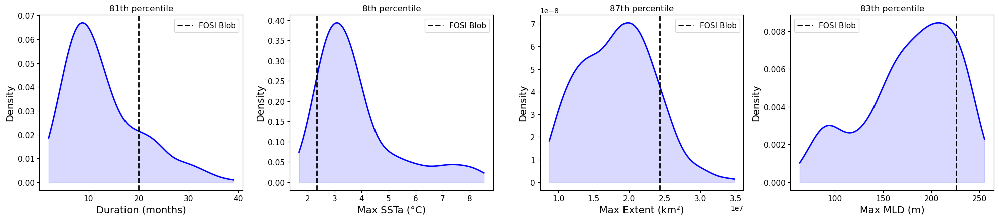

Return periods (years):
  duration: 65.6 years
  intensity_max: 13.9 years
  extent_max: 100.0 years
  mld_max: 73.7 years


In [48]:
N_years = 100 * 42

characteristics_to_plot = ['duration', 'intensity_max', 'extent_max', 'mld_max']
display_labels = {
    'duration': 'Duration (months)',
    'intensity_max': 'Max SSTa (°C)',
    'extent_max': 'Max Extent (km²)',
    'mld_max': 'Max MLD (m)',
}

fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))

return_periods = {}
for ax, char in zip(axes, characteristics_to_plot):
    values = np.array([c[char] for c in all_analog_characteristics.values() if char in c])
    kde = stats.gaussian_kde(values)
    x = np.linspace(values.min(), values.max(), 200)
    ax.plot(x, kde(x), color='blue', linewidth=2)
    ax.fill_between(x, kde(x), alpha=0.15, color='blue')
    ax.axvline(blob_fosi_characteristics[char], color='black', linestyle='--', linewidth=2, label='FOSI Blob')

    ax.set_xlabel(display_labels[char], fontsize=14)
    ax.set_ylabel('Density', fontsize=14)
    ax.tick_params(labelsize=11)
    ax.legend(fontsize=11)

    n = len(values)
    p = np.mean(values >= blob_fosi_characteristics[char])
    return_periods[char] = N_years / (n * p) if p > 0 else np.inf

    pct = 100 * (1 - p)
    ax.set_title(f"{pct:.0f}th percentile", fontsize=12)

plt.tight_layout()
plt.savefig('Figure_2_KDE_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("Return periods (years):")
for char, rp in return_periods.items():
    print(f"  {char}: {rp:.1f} years")

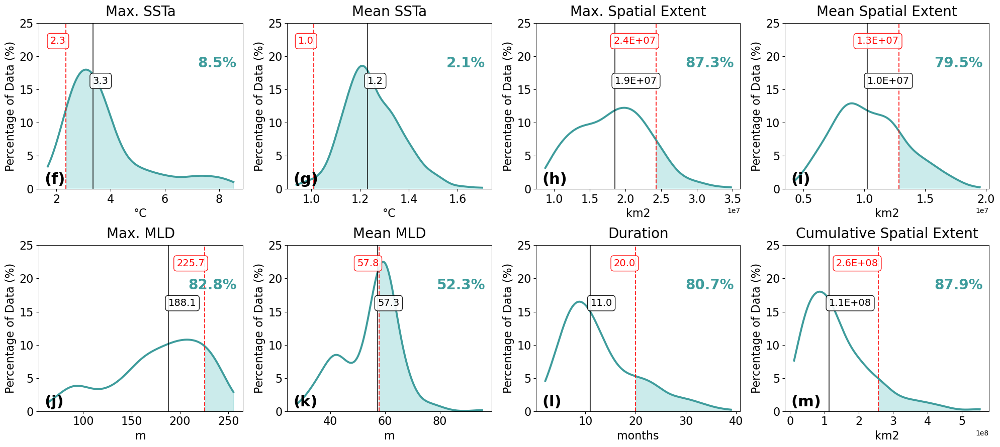

In [72]:
panel_specs = [
    ('intensity_max', 'Max. SSTa', '°C', '{:.1f}'),
    ('intensity_mean', 'Mean SSTa', '°C', '{:.1f}'),
    ('extent_max', 'Max. Spatial Extent', 'km2', '{:.1E}'),
    ('extent_mean', 'Mean Spatial Extent', 'km2', '{:.1E}'),
    ('mld_max', 'Max. MLD', 'm', '{:.1f}'),   # removed 'm' suffix from format
    ('mld_mean', 'Mean MLD', 'm', '{:.1f}'),  # removed 'm' suffix from format
    ('duration', 'Duration', 'months', '{:.1f}'),
    ('extent_cumulative', 'Cumulative Spatial Extent', 'km2', '{:.1E}'),
]

fig, axes = plt.subplots(2, 4, figsize=(20, 9))
axes = axes.flatten()
letters = ['f','g','h','i','j','k','l','m']

for ax, (char, title, xlabel, fmt), letter in zip(axes, panel_specs, letters):
    values = np.array([c[char] for c in all_analog_characteristics.values() if char in c])

    counts, bin_edges = np.histogram(values, bins=15)
    bin_width = bin_edges[1] - bin_edges[0]

    kde = gaussian_kde(values)
    x = np.linspace(values.min(), values.max(), 500)
    y_pct = kde(x) * bin_width * 100

    ax.plot(x, y_pct, color='#3E9C9C', linewidth=2.8)

    median_val = np.median(values)
    fosi_val = blob_fosi_characteristics[char]

    mask = x >= fosi_val
    ax.fill_between(x[mask], y_pct[mask], color='#7FCFCF', alpha=0.4)

    ax.axvline(fosi_val, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
    ax.axvline(median_val, color='k', linestyle='-', linewidth=1.5, alpha=0.7)

    # Staggered vertically: red label higher, black label lower
    ax.text(fosi_val, 23, fmt.format(fosi_val), ha='right', va='top', fontsize=14, color='red',
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.3', alpha=0.9))
    ax.text(median_val, 17, fmt.format(median_val), ha='left', va='top', fontsize=14, color='k',
            bbox=dict(facecolor='white', edgecolor='k', boxstyle='round,pad=0.3', alpha=0.9))

    pct = 100 * (1 - np.mean(values >= fosi_val))
    ax.text(0.97, 0.8, f"{pct:.1f}%", transform=ax.transAxes, ha='right', va='top',
        fontsize=20, color='#3E9C9C', fontweight='bold')

    ax.text(0.03, 0.03, f"({letter})", transform=ax.transAxes, fontsize=22, fontweight='bold')

    ax.set_title(title, fontsize=20, pad=10)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel('Percentage of Data (%)', fontsize=16)
    ax.set_ylim(0, 25)
    ax.tick_params(labelsize=16)
    ax.set_facecolor('white')
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_edgecolor('k')
        spine.set_linewidth(0.7)

plt.tight_layout()
plt.savefig('Figure_KDE_all_characteristics.png', dpi=300, bbox_inches='tight')
plt.show()

## Heat budget for each Blob-analog, using CONTEMPORANEOUS footprint, 155m, 3-phase

In [63]:
NO_SEC_IN_1_MON = 2629740
lat_slice = slice(204, 367)
lon_slice = slice(190, 280)

In [64]:
# ============================================================
# Load FOSI heat budget
# ============================================================
fosi_heat_budget = xr.open_dataset('/glade/derecho/scratch/cassiacai/fosi_heat_budget_155m.nc')
print(fosi_heat_budget)

<xarray.Dataset> Size: 2GB
Dimensions:    (time: 504, nlat_t: 384, nlon_t: 320)
Coordinates:
  * time       (time) object 4kB 1979-01-15 00:00:00 ... 2020-12-15 00:00:00
    TLONG      (nlat_t, nlon_t) float64 983kB ...
    TLAT       (nlat_t, nlon_t) float64 983kB ...
  * nlon_t     (nlon_t) float64 3kB 0.5 1.5 2.5 3.5 ... 316.5 317.5 318.5 319.5
  * nlat_t     (nlat_t) float64 3kB 0.5 1.5 2.5 3.5 ... 380.5 381.5 382.5 383.5
Data variables:
    Subgrid    (time, nlat_t, nlon_t) float64 495MB ...
    TEND_TEMP  (time, nlat_t, nlon_t) float32 248MB ...
    SHF_depth  (time, nlat_t, nlon_t) float64 495MB ...
    QSW_3D     (time, nlat_t, nlon_t) float64 495MB ...
    TOTADV     (time, nlat_t, nlon_t) float64 495MB ...


In [65]:
# ============================================================
# Load LENS heat budget (per member)
# ============================================================
def load_lens_heat_budget_full(member_id):
    ds_terms = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_{member_id}_03172026.nc'
    )
    ds_tend = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_onlytemptend_{member_id}_07242026.nc'
    )
    merged = xr.merge([ds_terms, ds_tend])
    return merged

heat_budget_0 = load_lens_heat_budget_full(0)
print(list(heat_budget_0.data_vars))
print(heat_budget_0.sizes)

['TOT_ADV', 'DIA_IMPVF_TEMP', 'SHF_depth', 'QSW_3D', 'TEND_TEMP']
Frozen({'time': 504, 'nlat_t': 384, 'nlon_t': 320})


In [66]:
# ============================================================
# Detrending function (already confirmed working, 4-value return)
# ============================================================
def detrend_term(da):
    term_nan = xr.where(da == 0., np.nan, da) * NO_SEC_IN_1_MON
    mean, trend, seasonal, notrend = afuncs.calculate_pop_grid_anomalies_trend_features(term_nan)
    return notrend

In [67]:
# ============================================================
# FOSI: compute SUBGRID, detrend all terms, crop, mask, extract padded Blob profile
# ============================================================
fosi_heat_budget['SUBGRID'] = fosi_heat_budget['TEND_TEMP'] - (
    fosi_heat_budget['TOTADV'] + fosi_heat_budget['SHF_depth'] + fosi_heat_budget['QSW_3D']
)

fosi_hb_detrended = {}
for term in ['TOTADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'TEND_TEMP']:
    notrend = detrend_term(fosi_heat_budget[term])
    key = 'TOT_ADV' if term == 'TOTADV' else term
    fosi_hb_detrended[key] = notrend

fosi_hb_cropped = {term: da.isel(nlat_t=lat_slice, nlon_t=lon_slice) for term, da in fosi_hb_detrended.items()}

In [68]:
# ============================================================
# Canonical mask (reload if not already in this notebook)
# ============================================================
mean_image_pop_files = [f'/glade/derecho/scratch/cassiacai/mean_image_{i}_POP.nc' for i in range(1, 8)]
mean_images_pop = [xr.open_dataset(file) for file in mean_image_pop_files]
masks_pop = [xr.where(image.__xarray_dataarray_variable__ > 0.1, 1, 0) for image in mean_images_pop]
NEPac_MHW_renamed_latlon = masks_pop[2].isel(nlat=lat_slice, nlon=lon_slice).rename({'nlat': 'nlat_t', 'nlon': 'nlon_t'})

In [69]:
fosi_hb_masked = {term: da.where(NEPac_MHW_renamed_latlon == 1) for term, da in fosi_hb_cropped.items()}

# blob_times: reload if not already in this notebook
fosi_blobs = xr.open_dataset('fosi_blobs_r2.nc').labels
object_id = 94.0
blob_times = fosi_blobs.time.where((fosi_blobs == object_id).any(dim=('lat','lon')), drop=True)

full_time_index = fosi_hb_masked['TOT_ADV'].time
first_idx = int(np.where(full_time_index.values == blob_times.values[0])[0][0])
last_idx = int(np.where(full_time_index.values == blob_times.values[-1])[0][0])
pad_start = max(0, first_idx - 2)
pad_end = min(len(full_time_index) - 1, last_idx + 2)
padded_times = full_time_index.isel(time=slice(pad_start, pad_end + 1))

fosi_hb_profile = {}
for term, da in fosi_hb_masked.items():
    fosi_hb_profile[term] = da.sel(time=padded_times).mean(dim=('nlat_t','nlon_t')).compute()

print({term: (float(ts.min()), float(ts.max())) for term, ts in fosi_hb_profile.items()})

{'TOT_ADV': (-1.9189894364378537, 2.3374321488967467), 'SHF_depth': (-4.990679540345742, 4.663633052585285), 'QSW_3D': (-0.7715706456049386, 0.7638532699842709), 'SUBGRID': (-2.6647983800899517, 4.331895032176939), 'TEND_TEMP': (-2.1350142038697943, 2.4867183875509213)}


In [70]:
# ============================================================
# LENS: same pipeline, per member, per analog
# ============================================================
def process_one_member_heat_budget(member_id, labels_full, analog_ids_for_member, NEPac_mask):
    if not analog_ids_for_member:
        return {}

    hb_raw = load_lens_heat_budget_full(member_id)
    hb_raw['SUBGRID'] = hb_raw['TEND_TEMP'] - (hb_raw['TOT_ADV'] + hb_raw['SHF_depth'] + hb_raw['QSW_3D'])

    hb_detrended = {}
    for term in ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'TEND_TEMP']:
        hb_detrended[term] = detrend_term(hb_raw[term])

    hb_cropped = {term: da.isel(nlat_t=lat_slice, nlon_t=lon_slice) for term, da in hb_detrended.items()}
    hb_masked = {term: da.where(NEPac_mask == 1) for term, da in hb_cropped.items()}

    member_labels = labels_full.isel(ensemble_member=member_id)
    member_profiles = {}

    for analog_id in analog_ids_for_member:
        key = (member_id, analog_id)
        mask = (member_labels == analog_id)
        times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)
        if len(times_present) == 0:
            continue

        full_time_index = member_labels.time
        first_idx = int(np.where(full_time_index.values == times_present.values[0])[0][0])
        last_idx = int(np.where(full_time_index.values == times_present.values[-1])[0][0])
        pad_start = max(0, first_idx - 2)
        pad_end = min(len(full_time_index) - 1, last_idx + 2)
        padded_times = full_time_index.isel(time=slice(pad_start, pad_end + 1))

        term_profiles = {term: da.sel(time=padded_times).mean(dim=('nlat_t','nlon_t')).compute()
                          for term, da in hb_masked.items()}

        member_profiles[key] = {
            'terms': term_profiles,
            'season': pd.Timestamp(str(times_present.values[0])).month,
        }

    print(f"Member {member_id} done")
    return member_profiles

In [71]:
# ============================================================
# Adaptive phase-splitting (3-phase for short events, 5-phase for long)
# ============================================================
def phase_split_adaptive(term_profiles, pre_post_months=2, min_months_for_5phase=8):
    tend_temp = term_profiles['TEND_TEMP']
    n_total = len(tend_temp.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months
    core_length = core_end - core_start

    if core_length < min_months_for_5phase:
        result = {}
        for term, ts in term_profiles.items():
            result[term] = {
                'Pre-MHW': float(ts.isel(time=slice(0, core_start)).mean()),
                'detection': float(ts.isel(time=slice(core_start, core_end)).mean()),
                'Post-MHW': float(ts.isel(time=slice(-pre_post_months, None)).mean()),
            }
        return result, 3, None
    else:
        core_tend = tend_temp.isel(time=slice(core_start, core_end))
        peak_idx_within_core = int(np.abs(core_tend.values).argmax())
        peak_idx_global = core_start + peak_idx_within_core
        has_prepeak = peak_idx_global > core_start
        has_decline = peak_idx_global < core_end - 1

        result = {}
        for term, ts in term_profiles.items():
            result[term] = {
                'Pre-MHW': float(ts.isel(time=slice(0, core_start)).mean()),
                'pre-peak': float(ts.isel(time=slice(core_start, peak_idx_global)).mean()) if has_prepeak else np.nan,
                'peak': float(ts.isel(time=peak_idx_global)),
                'decline': float(ts.isel(time=slice(peak_idx_global + 1, core_end)).mean()) if has_decline else np.nan,
                'Post-MHW': float(ts.isel(time=slice(-pre_post_months, None)).mean()),
            }
        peak_date = tend_temp.time.values[peak_idx_global]
        return result, 5, peak_date

In [72]:
# ============================================================
# Unified plotting function (handles both 3-phase and 5-phase)
# ============================================================
def plot_heat_budget_phases(phases_dict, n_phases, title, peak_date=None):
    colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
    phase_names = ['Pre-MHW', 'detection', 'Post-MHW'] if n_phases == 3 else ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']

    fig, ax = plt.subplots(figsize=(9, 5.5))
    x = np.arange(len(phase_names))
    width = 0.18

    for i, term in enumerate(['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']):
        values = [phases_dict[term][p] for p in phase_names]
        ax.bar(x + i*width, values, width, label=term, color=colors[term])

    tend_values = [phases_dict['TEND_TEMP'][p] for p in phase_names]
    ax.plot(x + 1.5*width, tend_values, color='green', marker='o', markersize=8, linewidth=2.5,
            label='Temperature Tendency', zorder=10)

    ax.axhline(0, color='k', linewidth=0.8)
    ax.set_xticks(x + 1.5*width)
    ax.set_xticklabels(phase_names, fontsize=12)
    ax.set_ylabel('°C / month', fontsize=13)
    full_title = title + (f" (peak = {str(peak_date)[:7]})" if peak_date is not None else "")
    ax.set_title(full_title, fontsize=13)
    ax.legend(fontsize=10)
    plt.tight_layout()
    plt.show()

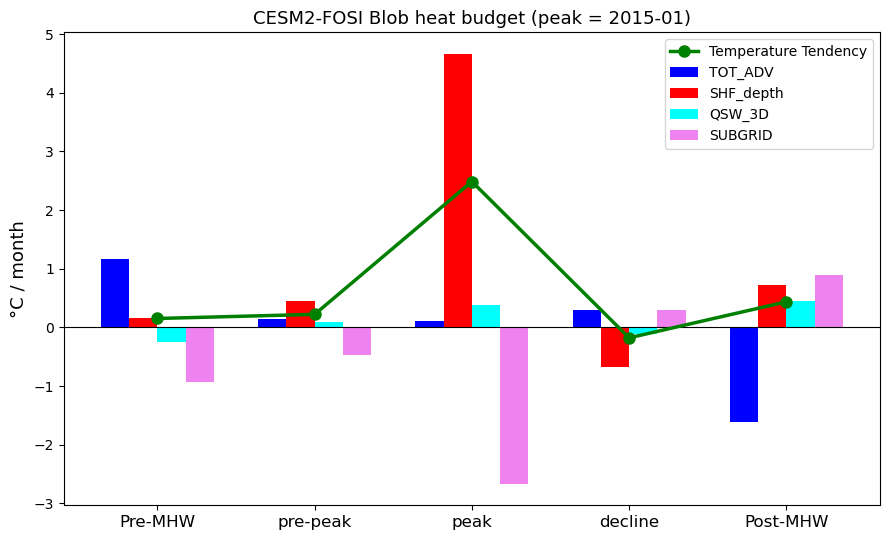

In [73]:
# ============================================================
# Run: FOSI Blob (should be 5-phase given 20-month duration)
# ============================================================
fosi_phases_adaptive, n_phases, peak_date = phase_split_adaptive(fosi_hb_profile)
plot_heat_budget_phases(fosi_phases_adaptive, n_phases, 'CESM2-FOSI Blob heat budget', peak_date)

In [99]:
# ============================================================
# Run for just the first 5 members
# ============================================================
output_dir_hb = '/glade/derecho/scratch/cassiacai/heat_budget_profiles_by_member'
os.makedirs(output_dir_hb, exist_ok=True)

labels_full = da_mhwobj_labels_by_method['linear']

t0 = time.time()
for member_id in range(40):
    save_path = f'{output_dir_hb}/member_{member_id}.pkl'
    if os.path.exists(save_path):
        print(f"Member {member_id} already done, skipping")
        continue

    member_profiles = process_one_member_heat_budget(
        member_id, labels_full, blob_analog_ids['linear'][member_id], NEPac_MHW_renamed_latlon
    )

    with open(save_path, 'wb') as f:
        pickle.dump(member_profiles, f)

    print(f"Member {member_id} done ({time.time()-t0:.1f}s elapsed)")

print(f"Total time for 5 members: {time.time()-t0:.1f}s")

Member 0 already done, skipping
Member 1 already done, skipping
Member 2 already done, skipping
Member 3 already done, skipping
Member 4 already done, skipping
Member 5 done
Member 5 done (7.4s elapsed)
Member 6 done
Member 6 done (14.0s elapsed)
Member 7 done
Member 7 done (21.9s elapsed)
Member 8 done
Member 8 done (28.9s elapsed)
Member 9 done
Member 9 done (36.3s elapsed)
Member 10 done
Member 10 done (44.4s elapsed)
Member 11 done
Member 11 done (51.9s elapsed)
Member 12 done
Member 12 done (59.4s elapsed)
Member 13 done
Member 13 done (66.6s elapsed)
Member 14 done
Member 14 done (73.9s elapsed)
Member 15 done
Member 15 done (81.5s elapsed)
Member 16 done
Member 16 done (88.6s elapsed)
Member 17 done
Member 17 done (96.8s elapsed)
Member 18 done
Member 18 done (104.1s elapsed)
Member 19 done
Member 19 done (110.7s elapsed)
Member 20 done
Member 20 done (118.2s elapsed)
Member 21 done
Member 21 done (125.6s elapsed)
Member 22 done
Member 22 done (133.0s elapsed)
Member 23 done
Mem

In [100]:
# ============================================================
# Run for just the first 5 members
# ============================================================
output_dir_hb = '/glade/derecho/scratch/cassiacai/heat_budget_profiles_by_member'
os.makedirs(output_dir_hb, exist_ok=True)

labels_full = da_mhwobj_labels_by_method['linear']

t0 = time.time()
for member_id in range(100):
    save_path = f'{output_dir_hb}/member_{member_id}.pkl'
    if os.path.exists(save_path):
        print(f"Member {member_id} already done, skipping")
        continue

    member_profiles = process_one_member_heat_budget(
        member_id, labels_full, blob_analog_ids['linear'][member_id], NEPac_MHW_renamed_latlon
    )

    with open(save_path, 'wb') as f:
        pickle.dump(member_profiles, f)

    print(f"Member {member_id} done ({time.time()-t0:.1f}s elapsed)")

print(f"Total time for 5 members: {time.time()-t0:.1f}s")

Member 0 already done, skipping
Member 1 already done, skipping
Member 2 already done, skipping
Member 3 already done, skipping
Member 4 already done, skipping
Member 5 already done, skipping
Member 6 already done, skipping
Member 7 already done, skipping
Member 8 already done, skipping
Member 9 already done, skipping
Member 10 already done, skipping
Member 11 already done, skipping
Member 12 already done, skipping
Member 13 already done, skipping
Member 14 already done, skipping
Member 15 already done, skipping
Member 16 already done, skipping
Member 17 already done, skipping
Member 18 already done, skipping
Member 19 already done, skipping
Member 20 already done, skipping
Member 21 already done, skipping
Member 22 already done, skipping
Member 23 already done, skipping
Member 24 already done, skipping
Member 25 already done, skipping
Member 26 already done, skipping
Member 27 already done, skipping
Member 28 already done, skipping
Member 29 already done, skipping
Member 30 already do

In [101]:
# ============================================================
# Reload and check
# ============================================================
heat_budget_profiles_test5 = {}
for member_id in range(100):
    save_path = f'{output_dir_hb}/member_{member_id}.pkl'
    if os.path.exists(save_path):
        with open(save_path, 'rb') as f:
            heat_budget_profiles_test5.update(pickle.load(f))

print(f"Total analogs (first 5 members): {len(heat_budget_profiles_test5)}")

Total analogs (first 5 members): 331


In [102]:
# ============================================================
# Apply adaptive phase-splitting, check the 3-vs-5 phase split
# ============================================================
hb_phases_test5 = {}
phase_count_used = {3: 0, 5: 0}
for key, data in heat_budget_profiles_test5.items():
    phases, n_phases, peak_date = phase_split_adaptive(data['terms'])
    hb_phases_test5[key] = {'phases': phases, 'n_phases': n_phases, 'peak_date': peak_date}
    phase_count_used[n_phases] += 1
    print(f"{key}: {n_phases}-phase" + (f", peak={str(peak_date)[:7]}" if peak_date is not None else ""))

print(f"\n3-phase: {phase_count_used[3]}, 5-phase: {phase_count_used[5]}")

(0, 28.0): 3-phase
(0, 43.0): 3-phase
(0, 58.0): 5-phase, peak=2004-03
(0, 85.0): 3-phase
(1, 49.0): 3-phase
(1, 75.0): 5-phase, peak=2005-12
(2, 56.0): 5-phase, peak=2002-02
(2, 59.0): 5-phase, peak=2003-12
(2, 66.0): 5-phase, peak=2005-11
(2, 80.0): 3-phase
(3, 5.0): 5-phase, peak=1981-05
(3, 47.0): 5-phase, peak=2002-06
(3, 67.0): 5-phase, peak=2011-01
(4, 4.0): 5-phase, peak=1980-07
(4, 34.0): 5-phase, peak=1996-02
(4, 50.0): 5-phase, peak=2003-03
(4, 88.0): 5-phase, peak=2016-12
(4, 98.0): 5-phase, peak=2019-12
(5, 3.0): 3-phase
(5, 36.0): 5-phase, peak=1994-05
(5, 57.0): 5-phase, peak=2005-03
(5, 69.0): 5-phase, peak=2009-06
(5, 74.0): 5-phase, peak=2012-01
(6, 47.0): 5-phase, peak=2001-02
(6, 72.0): 5-phase, peak=2014-10
(7, 13.0): 3-phase
(7, 42.0): 5-phase, peak=1998-12
(7, 55.0): 5-phase, peak=2004-12
(8, 44.0): 5-phase, peak=1997-06
(8, 73.0): 3-phase
(8, 87.0): 5-phase, peak=2019-03
(9, 38.0): 5-phase, peak=2001-12
(9, 66.0): 5-phase, peak=2012-03
(9, 74.0): 5-phase, peak=2

In [103]:
def plot_heat_budget_phases(ax, phases_dict, n_phases, title, peak_date=None):
    colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
    phase_names = ['Pre-MHW', 'detection', 'Post-MHW'] if n_phases == 3 else ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']

    x = np.arange(len(phase_names))
    width = 0.18

    for i, term in enumerate(['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']):
        values = [phases_dict[term][p] for p in phase_names]
        ax.bar(x + i*width, values, width, label=term, color=colors[term])

    tend_values = [phases_dict['TEND_TEMP'][p] for p in phase_names]
    ax.plot(x + 1.5*width, tend_values, color='green', marker='o', markersize=6, linewidth=2,
            label='Tendency', zorder=10)

    ax.axhline(0, color='k', linewidth=0.8)
    ax.set_xticks(x + 1.5*width)
    ax.set_xticklabels(phase_names, fontsize=9, rotation=20)
    ax.set_ylabel('°C / month', fontsize=11)
    full_title = title + (f"\n(peak={str(peak_date)[:7]})" if peak_date is not None else "")
    ax.set_title(full_title, fontsize=11)

In [104]:
n_analogs = len(hb_phases_test5)
ncols = 3
nrows = int(np.ceil(n_analogs / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 4.5*nrows))
axes = np.atleast_1d(axes).flatten()

for ax, (key, data) in zip(axes, hb_phases_test5.items()):
    plot_heat_budget_phases(ax, data['phases'], data['n_phases'], f'Analog {key}', data['peak_date'])

# Single shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=5, fontsize=11, bbox_to_anchor=(0.5, 1.02))

for ax in axes[n_analogs:]:
    ax.set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('Figure_heat_budget_first5members.png', dpi=300, bbox_inches='tight')
plt.show()

In [105]:
def phase_split_adaptive_with_std(term_profiles, pre_post_months=2, min_months_for_5phase=8):
    tend_temp = term_profiles['TEND_TEMP']
    n_total = len(tend_temp.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months
    core_length = core_end - core_start

    def mean_std(ts, sl):
        vals = ts.isel(time=sl).values
        return (float(np.mean(vals)), float(np.std(vals)) if len(vals) > 1 else 0.0)

    if core_length < min_months_for_5phase:
        result = {}
        for term, ts in term_profiles.items():
            result[term] = {
                'Pre-MHW': mean_std(ts, slice(0, core_start)),
                'detection': mean_std(ts, slice(core_start, core_end)),
                'Post-MHW': mean_std(ts, slice(-pre_post_months, None)),
            }
        return result, 3, None
    else:
        core_tend = tend_temp.isel(time=slice(core_start, core_end))
        peak_idx_within_core = int(np.abs(core_tend.values).argmax())
        peak_idx_global = core_start + peak_idx_within_core
        has_prepeak = peak_idx_global > core_start
        has_decline = peak_idx_global < core_end - 1

        result = {}
        for term, ts in term_profiles.items():
            result[term] = {
                'Pre-MHW': mean_std(ts, slice(0, core_start)),
                'pre-peak': mean_std(ts, slice(core_start, peak_idx_global)) if has_prepeak else (np.nan, np.nan),
                'peak': (float(ts.isel(time=peak_idx_global)), 0.0),  # single month, no spread
                'decline': mean_std(ts, slice(peak_idx_global + 1, core_end)) if has_decline else (np.nan, np.nan),
                'Post-MHW': mean_std(ts, slice(-pre_post_months, None)),
            }
        peak_date = tend_temp.time.values[peak_idx_global]
        return result, 5, peak_date

In [106]:
def composite_phase_group_with_std(keys, hb_phases_all, phase_names):
    composite = {term: {p: [] for p in phase_names} for term in ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'TEND_TEMP']}
    for key in keys:
        phases = hb_phases_all[key]['phases']
        for term in composite:
            for p in phase_names:
                val = phases[term].get(p, (np.nan, np.nan))[0]  # just the mean, not the within-event std
                if not np.isnan(val):
                    composite[term][p].append(val)

    result = {}
    for term, phase_dict in composite.items():
        result[term] = {}
        for p, vals in phase_dict.items():
            arr = np.array(vals)
            result[term][p] = (np.nanmean(arr), np.nanstd(arr), len(arr))  # mean, std, n
    return result

In [107]:
def plot_heat_budget_phases_with_errorbars(ax, phases_dict, n_phases, title, peak_date=None):
    colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
    phase_names = ['Pre-MHW', 'detection', 'Post-MHW'] if n_phases == 3 else ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']

    x = np.arange(len(phase_names))
    width = 0.18

    for i, term in enumerate(['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']):
        means = [phases_dict[term][p][0] for p in phase_names]
        stds = [phases_dict[term][p][1] for p in phase_names]
        ax.bar(x + i*width, means, width, yerr=stds, capsize=3, label=term, color=colors[term])

    tend_means = [phases_dict['TEND_TEMP'][p][0] for p in phase_names]
    tend_stds = [phases_dict['TEND_TEMP'][p][1] for p in phase_names]
    ax.errorbar(x + 1.5*width, tend_means, yerr=tend_stds, color='green', marker='o',
                markersize=8, linewidth=2.5, label='Tendency', zorder=10, capsize=3)

    ax.axhline(0, color='k', linewidth=0.8)
    ax.set_xticks(x + 1.5*width)
    ax.set_xticklabels(phase_names, fontsize=12)
    ax.set_ylabel('°C / month', fontsize=13)
    full_title = title + (f" (peak = {str(peak_date)[:7]})" if peak_date is not None else "")
    ax.set_title(full_title, fontsize=13)
    ax.legend(fontsize=10)

In [108]:
# ============================================================
# Split into 3-phase and 5-phase groups
# ============================================================
keys_3phase = [k for k, v in hb_phases_test5.items() if v['n_phases'] == 3]
keys_5phase = [k for k, v in hb_phases_test5.items() if v['n_phases'] == 5]

print(f"3-phase: {len(keys_3phase)}, 5-phase: {len(keys_5phase)}")

3-phase: 89, 5-phase: 242


In [109]:
# ============================================================
# Composite with mean + std across analogs, per phase, per term
# ============================================================
def composite_phase_group(keys, hb_phases_all, phase_names):
    composite = {term: {p: [] for p in phase_names} for term in ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'TEND_TEMP']}
    for key in keys:
        phases = hb_phases_all[key]['phases']
        for term in composite:
            for p in phase_names:
                val = phases[term][p]
                if not np.isnan(val):
                    composite[term][p].append(val)

    result = {}
    for term, phase_dict in composite.items():
        result[term] = {}
        for p, vals in phase_dict.items():
            arr = np.array(vals)
            mean = np.nanmean(arr) if len(arr) > 0 else np.nan
            std = np.nanstd(arr) if len(arr) > 0 else np.nan
            result[term][p] = (mean, std, len(arr))
    return result

composite_3phase = composite_phase_group(keys_3phase, hb_phases_test5, ['Pre-MHW', 'detection', 'Post-MHW'])
composite_5phase = composite_phase_group(keys_5phase, hb_phases_test5, ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW'])

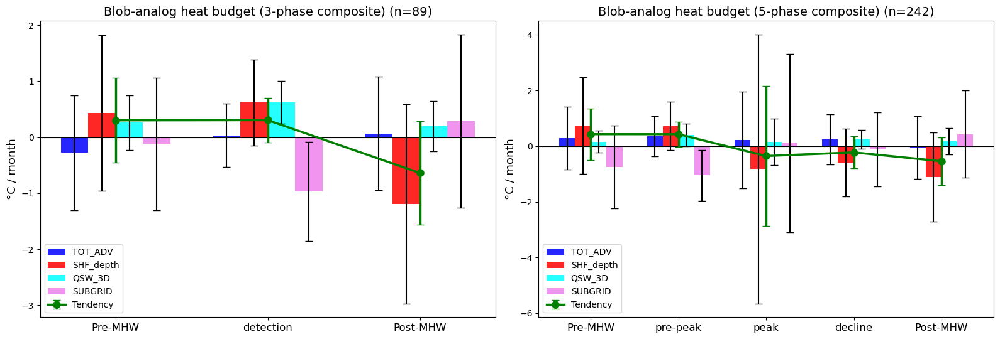

In [110]:
# ============================================================
# Plot with error bars
# ============================================================
def plot_composite_with_errorbars(ax, composite, phase_names, title, n_total):
    colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
    x = np.arange(len(phase_names))
    width = 0.18

    for i, term in enumerate(['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']):
        means = [composite[term][p][0] for p in phase_names]
        stds = [composite[term][p][1] for p in phase_names]
        ax.bar(x + i*width, means, width, yerr=stds, capsize=4, label=term, color=colors[term], alpha=0.85)

    tend_means = [composite['TEND_TEMP'][p][0] for p in phase_names]
    tend_stds = [composite['TEND_TEMP'][p][1] for p in phase_names]
    ax.errorbar(x + 1.5*width, tend_means, yerr=tend_stds, color='green', marker='o',
                markersize=8, linewidth=2.5, label='Tendency', capsize=4, zorder=10)

    ax.axhline(0, color='k', linewidth=0.8)
    ax.set_xticks(x + 1.5*width)
    ax.set_xticklabels(phase_names, fontsize=12)
    ax.set_ylabel('°C / month', fontsize=13)
    ax.set_title(f'{title} (n={n_total})', fontsize=14)
    ax.legend(fontsize=10)


fig, axes = plt.subplots(1, 2, figsize=(16, 5.5))

plot_composite_with_errorbars(axes[0], composite_3phase, ['Pre-MHW', 'detection', 'Post-MHW'],
                                'Blob-analog heat budget (3-phase composite)', len(keys_3phase))
plot_composite_with_errorbars(axes[1], composite_5phase, ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW'],
                                'Blob-analog heat budget (5-phase composite)', len(keys_5phase))

plt.tight_layout()
plt.savefig('Figure_heat_budget_composite_errorbars.png', dpi=300, bbox_inches='tight')
plt.show()

In [111]:
import matplotlib.pyplot as plt
import numpy as np

def plot_term_panel(ax, term, phase_names, composite, individual_values_by_phase, title, color):
    """
    composite: dict with composite[term][phase] = (mean, std, n)
    individual_values_by_phase: dict {phase: [list of individual analog values]}
    """
    x = np.arange(len(phase_names))

    for i, phase in enumerate(phase_names):
        mean, std, n = composite[term][phase]
        # Box: mean ± std
        ax.bar(i, 2*std, bottom=mean-std, width=0.5, color=color, alpha=0.4, edgecolor='k', linewidth=0.8)
        # Red median line
        ax.hlines(mean, i-0.25, i+0.25, color='red', linewidth=2, zorder=5)

        # Individual event markers
        vals = individual_values_by_phase.get(phase, [])
        if len(vals) > 0:
            # Jitter slightly for visibility if multiple points overlap
            jitter = np.random.uniform(-0.08, 0.08, size=len(vals))
            ax.scatter(np.full(len(vals), i) + jitter, vals, color='black', edgecolor='white',
                       s=40, zorder=10, linewidth=0.8)

    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(phase_names, fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')

In [112]:
# ============================================================
# Build individual-value lists per phase (needed for the dot overlay)
# ============================================================
def get_individual_values_by_phase(keys, hb_phases_all, term, phase_names):
    result = {p: [] for p in phase_names}
    for key in keys:
        phases = hb_phases_all[key]['phases']
        for p in phase_names:
            val = phases[term][p]
            if not np.isnan(val):
                result[p].append(val)
    return result

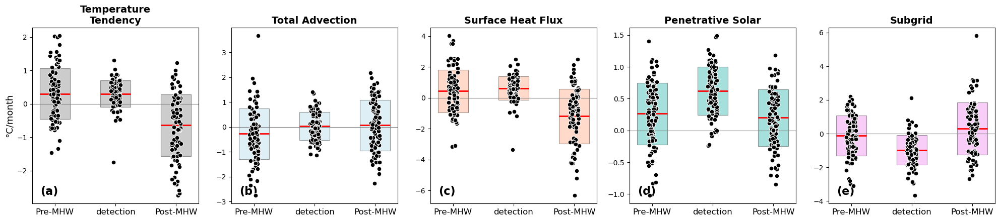

In [113]:
# ============================================================
# 5-panel plot: Tendency, Advection, Surface Flux, Solar, Subgrid
# ============================================================
phase_names_3 = ['Pre-MHW', 'detection', 'Post-MHW']
term_titles = {
    'TEND_TEMP': 'Temperature\nTendency',
    'TOT_ADV': 'Total Advection',
    'SHF_depth': 'Surface Heat Flux',
    'QSW_3D': 'Penetrative Solar',
    'SUBGRID': 'Subgrid',
}
term_colors = {
    'TEND_TEMP': 'gray',
    'TOT_ADV': 'lightblue',
    'SHF_depth': 'lightsalmon',
    'QSW_3D': 'lightseagreen',
    'SUBGRID': 'violet',
}
panel_letters = ['(a)', '(b)', '(c)', '(d)', '(e)']

fig, axes = plt.subplots(1, 5, figsize=(20, 4.5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    individual_vals = get_individual_values_by_phase(keys_3phase, hb_phases_test5, term, phase_names_3)
    plot_term_panel(ax, term, phase_names_3, composite_3phase, individual_vals, term_titles[term], term_colors[term])
    ax.text(0.05, 0.05, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=13)

plt.tight_layout()
plt.savefig('Figure_heat_budget_5panel_boxplot_style.png', dpi=300, bbox_inches='tight')
plt.show()

In [114]:
def plot_term_panel_with_blob(ax, term, phase_names, composite, individual_values_by_phase, blob_values, title, color):
    x = np.arange(len(phase_names))

    for i, phase in enumerate(phase_names):
        mean, std, n = composite[term][phase]
        ax.bar(i, 2*std, bottom=mean-std, width=0.5, color=color, alpha=0.4, edgecolor='k', linewidth=0.8)
        ax.hlines(mean, i-0.25, i+0.25, color='red', linewidth=2, zorder=5)

        vals = individual_values_by_phase.get(phase, [])
        if len(vals) > 0:
            jitter = np.random.uniform(-0.08, 0.08, size=len(vals))
            ax.scatter(np.full(len(vals), i) + jitter, vals, color='black', edgecolor='white',
                       s=40, zorder=10, linewidth=0.8)

        # FOSI Blob's own value, marked distinctly
        if phase in blob_values and not np.isnan(blob_values[phase]):
            ax.scatter(i, blob_values[phase], color='gold', edgecolor='black', s=140,
                       marker='*', zorder=15, linewidth=1.2, label='CESM2-FOSI Blob' if i == 0 else None)

    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(phase_names, fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')

In [115]:
# ============================================================
# Get the FOSI Blob's own phase values (3-phase version)
# ============================================================
fosi_phases_3, _, _ = phase_split_adaptive(fosi_hb_profile, min_months_for_5phase=999)  # force 3-phase for direct comparison

blob_values_by_term = {
    term: {p: fosi_phases_3[term][p] for p in phase_names_3}
    for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']
}

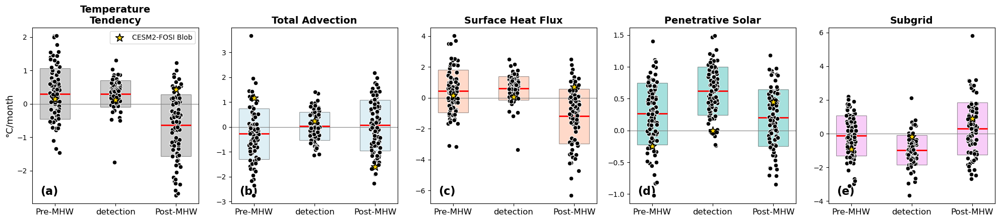

In [116]:
# ============================================================
# 5-panel plot with FOSI Blob marker (gold star)
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(20, 4.5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    individual_vals = get_individual_values_by_phase(keys_3phase, hb_phases_test5, term, phase_names_3)
    plot_term_panel_with_blob(ax, term, phase_names_3, composite_3phase, individual_vals,
                               blob_values_by_term[term], term_titles[term], term_colors[term])
    ax.text(0.05, 0.05, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=13)
        ax.legend(fontsize=10, loc='upper right')

plt.tight_layout()
plt.savefig('Figure_heat_budget_5panel_with_blob.png', dpi=300, bbox_inches='tight')
plt.show()

In [117]:
phase_names_5 = ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']

# ============================================================
# FOSI Blob's own 5-phase values (already computed earlier as fosi_phases_adaptive)
# ============================================================
blob_values_by_term_5 = {
    term: {p: fosi_phases_adaptive[term].get(p, np.nan) for p in phase_names_5}
    for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']
}

In [118]:
# ============================================================
# Compute a shared y-axis range across all 5 panels
# ============================================================
all_values_for_range = []
for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    for phase in phase_names_5:
        mean, std, n = composite_5phase[term][phase]
        if not np.isnan(mean):
            all_values_for_range.extend([mean - std, mean + std])
    individual_vals = get_individual_values_by_phase(keys_5phase, hb_phases_test5, term, phase_names_5)
    for phase, vals in individual_vals.items():
        all_values_for_range.extend(vals)
    blob_vals = [v for v in blob_values_by_term_5[term].values() if not np.isnan(v)]
    all_values_for_range.extend(blob_vals)

y_min = min(all_values_for_range) * 1.1
y_max = max(all_values_for_range) * 1.1
print(f"Shared y-axis range: {y_min:.2f} to {y_max:.2f}")

Shared y-axis range: -10.75 to 9.26


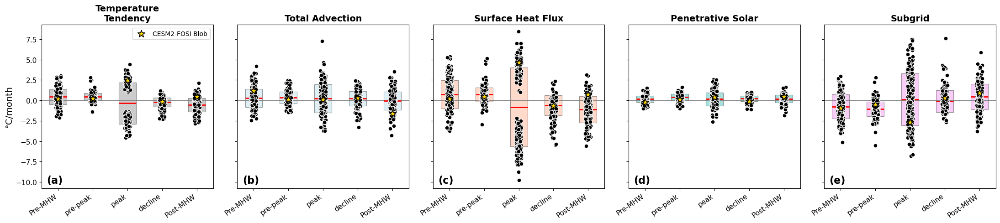

In [119]:
# ============================================================
# 5-panel plot, 5-phase composite, with FOSI Blob marker
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    individual_vals = get_individual_values_by_phase(keys_5phase, hb_phases_test5, term, phase_names_5)
    plot_term_panel_with_blob(ax, term, phase_names_5, composite_5phase, individual_vals,
                               blob_values_by_term_5[term], term_titles[term], term_colors[term])

    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    ax.set_xticklabels(phase_names_5, fontsize=11, rotation=35, ha='right')
    ax.tick_params(axis='y', labelsize=11)
    ax.set_ylim(y_min, y_max)  # SAME for every panel

    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=14)
        ax.legend(fontsize=10, loc='upper right', frameon=True)
    else:
        ax.set_yticklabels([])  # optional: only show y-tick labels on the leftmost panel, since they're now shared

plt.tight_layout()
plt.savefig('Figure_heat_budget_5panel_5phase_shared_yaxis.png', dpi=300, bbox_inches='tight')
plt.show()

In [120]:
def plot_term_panel_with_blob_no_dots(ax, term, phase_names, composite, blob_values, title, color):
    x = np.arange(len(phase_names))

    for i, phase in enumerate(phase_names):
        mean, std, n = composite[term][phase]
        ax.bar(i, 2*std, bottom=mean-std, width=0.5, color=color, alpha=0.4, edgecolor='k', linewidth=0.8)
        ax.hlines(mean, i-0.25, i+0.25, color='red', linewidth=2, zorder=5)

        if phase in blob_values and not np.isnan(blob_values[phase]):
            ax.scatter(i, blob_values[phase], color='gold', edgecolor='black', s=250,
                       marker='*', zorder=20, linewidth=1.5, label='CESM2-FOSI Blob' if i == 0 else None)

    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(phase_names, fontsize=11, rotation=35, ha='right')
    ax.set_title(title, fontsize=14, fontweight='bold')

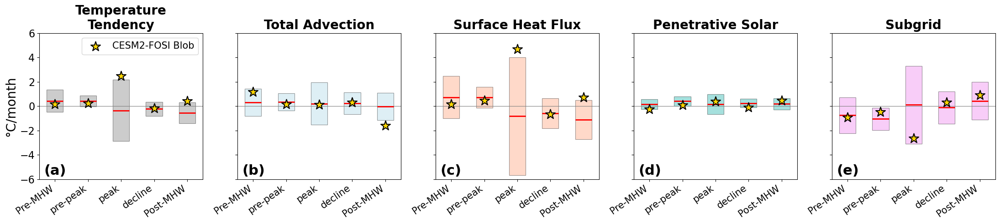

In [167]:
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_with_blob_no_dots(ax, term, phase_names_5, composite_5phase,
                                        blob_values_by_term_5[term], term_titles[term], term_colors[term])

    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=22, fontweight='bold')
    ax.tick_params(axis='y', labelsize=16)
    ax.tick_params(axis='x', labelsize=15)
    ax.set_ylim(-6, 6)
    ax.set_title(ax.get_title(), fontsize=20, fontweight='bold')  # ensure title override applies
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=20)
        ax.legend(fontsize=15, loc='upper right', frameon=True)
    else:
        ax.set_yticklabels([])

plt.tight_layout()
plt.savefig('Figure_heat_budget_5panel_nodots.png', dpi=300, bbox_inches='tight')
plt.show()

In [158]:
def get_individual_values_by_phase(keys, hb_phases_all, term, phase_names):
    result = {p: [] for p in phase_names}
    for key in keys:
        phases = hb_phases_all[key]['phases']
        for p in phase_names:
            val = phases[term][p]
            if not np.isnan(val):
                result[p].append(val)
    return result

def plot_term_panel_violin(ax, term, phase_names, keys, hb_phases_all, blob_values, title, color):
    individual_vals = get_individual_values_by_phase(keys, hb_phases_all, term, phase_names)

    data_for_violin = [individual_vals[p] for p in phase_names]
    positions = np.arange(len(phase_names))

    parts = ax.violinplot(data_for_violin, positions=positions, showmeans=True, showmedians=False, widths=0.7)

    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_alpha(0.6)
        pc.set_edgecolor('k')
        pc.set_linewidth(0.8)
    parts['cmeans'].set_color('red')
    parts['cmeans'].set_linewidth(2)
    parts['cbars'].set_color('k')
    parts['cmins'].set_color('k')
    parts['cmaxes'].set_color('k')

    for i, phase in enumerate(phase_names):
        if phase in blob_values and not np.isnan(blob_values[phase]):
            ax.scatter(i, blob_values[phase], color='gold', edgecolor='black', s=250,
                       marker='*', zorder=20, linewidth=1.5, label='CESM2-FOSI Blob' if i == 0 else None)

    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xticks(positions)
    ax.set_xticklabels(phase_names, fontsize=11, rotation=35, ha='right')
    ax.set_title(title, fontsize=14, fontweight='bold')

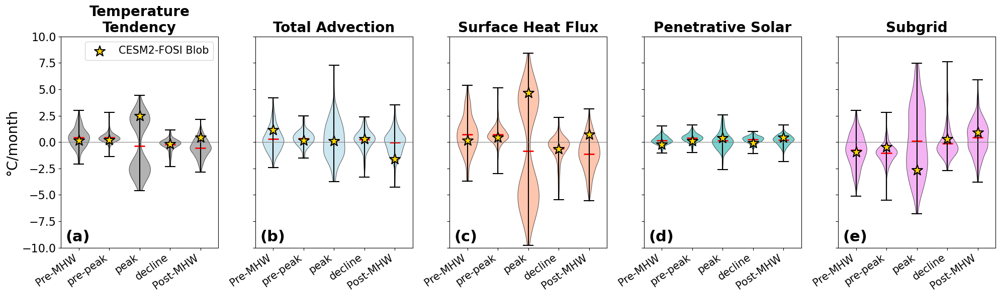

In [172]:
fig, axes = plt.subplots(1, 5, figsize=(20, 6))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_violin(ax, term, phase_names_5, keys_5phase_40, hb_phases_40,
                            blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=22, fontweight='bold')
    ax.tick_params(axis='y', labelsize=16)
    ax.tick_params(axis='x', labelsize=15)
    ax.set_ylim(-10, 10)
    ax.set_title(ax.get_title(), fontsize=20, fontweight='bold')  # ensure title override applies
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=20)
        ax.legend(fontsize=15, loc='upper right', frameon=True)
    else:
        ax.set_yticklabels([])

plt.tight_layout()
plt.savefig('Figure_heat_budget_5panel_violin.png', dpi=300, bbox_inches='tight')
plt.show()

In [127]:
keys_5phase_40 = [k for k, v in hb_phases_test5.items() if v['n_phases'] == 5]
print(f"5-phase analogs: {len(keys_5phase_40)}")

5-phase analogs: 242


In [130]:
hb_phases_40 = hb_phases_test5

n = 242
Positive peak SHF: 113 (46.7%)
Negative peak SHF: 129 (53.3%)


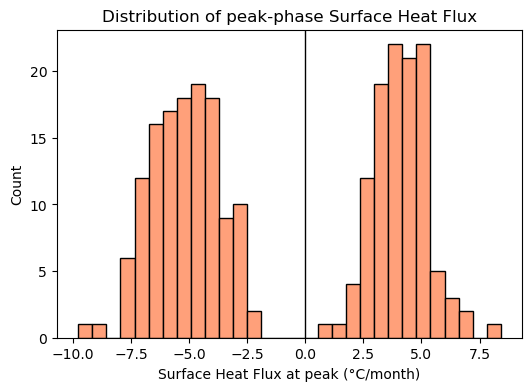

In [131]:
# ============================================================
# Check for bimodality in SHF_depth at peak phase
# ============================================================
shf_peak_values = []
for key in keys_5phase_40:
    val = hb_phases_40[key]['phases']['SHF_depth']['peak']
    if not np.isnan(val):
        shf_peak_values.append(val)

shf_peak_values = np.array(shf_peak_values)
print(f"n = {len(shf_peak_values)}")
print(f"Positive peak SHF: {np.sum(shf_peak_values > 0)} ({100*np.mean(shf_peak_values>0):.1f}%)")
print(f"Negative peak SHF: {np.sum(shf_peak_values < 0)} ({100*np.mean(shf_peak_values<0):.1f}%)")

plt.figure(figsize=(6,4))
plt.hist(shf_peak_values, bins=30, color='lightsalmon', edgecolor='k')
plt.axvline(0, color='k', linewidth=1)
plt.xlabel('Surface Heat Flux at peak (°C/month)')
plt.ylabel('Count')
plt.title('Distribution of peak-phase Surface Heat Flux')
plt.show()

In [132]:
def separate_peak_by_sign(keys, hb_phases_all):
    warming_keys = []
    cooling_keys = []
    for key in keys:
        tend_peak = hb_phases_all[key]['phases']['TEND_TEMP']['peak']
        if np.isnan(tend_peak):
            continue
        if tend_peak > 0:
            warming_keys.append(key)
        else:
            cooling_keys.append(key)
    return warming_keys, cooling_keys

warming_keys, cooling_keys = separate_peak_by_sign(keys_5phase_40, hb_phases_40)
print(f"Warming-peak analogs: {len(warming_keys)}, Cooling-peak analogs: {len(cooling_keys)}")

Warming-peak analogs: 113, Cooling-peak analogs: 129


In [133]:
def separate_peak_by_sign(keys, hb_phases_all):
    warming_keys, cooling_keys = [], []
    for key in keys:
        tend_peak = hb_phases_all[key]['phases']['TEND_TEMP']['peak']
        if np.isnan(tend_peak):
            continue
        (warming_keys if tend_peak > 0 else cooling_keys).append(key)
    return warming_keys, cooling_keys

warming_keys, cooling_keys = separate_peak_by_sign(keys_5phase_40, hb_phases_40)
print(f"Warming-peak analogs: {len(warming_keys)}, Cooling-peak analogs: {len(cooling_keys)}")

Warming-peak analogs: 113, Cooling-peak analogs: 129


In [134]:
# ============================================================
# Composite each group separately
# ============================================================
composite_warming = composite_phase_group(warming_keys, hb_phases_40, phase_names_5)
composite_cooling = composite_phase_group(cooling_keys, hb_phases_40, phase_names_5)

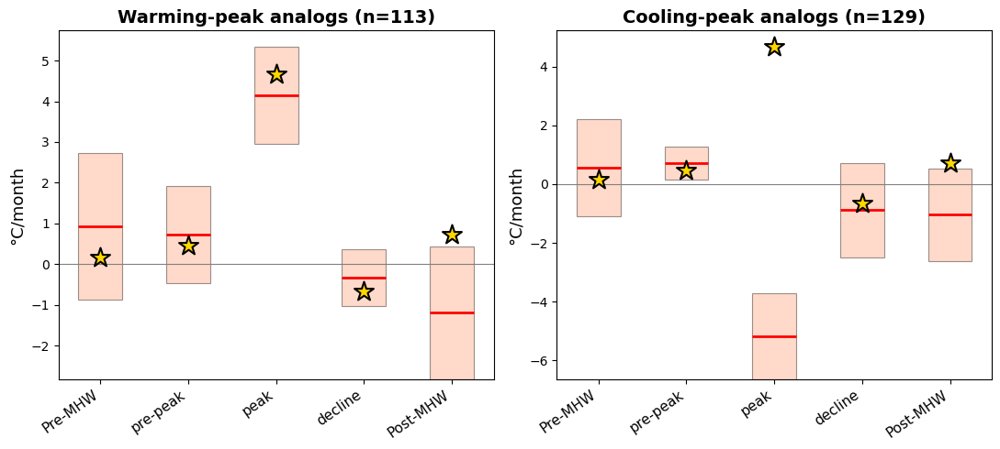

In [135]:
# ============================================================
# Plot side by side: warming-peak vs cooling-peak, Surface Heat Flux panel
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(11, 5))

for ax, composite, keys_group, title in zip(
    axes, [composite_warming, composite_cooling], [warming_keys, cooling_keys],
    ['Warming-peak analogs', 'Cooling-peak analogs']
):
    plot_term_panel_with_blob_no_dots(ax, 'SHF_depth', phase_names_5, composite,
                                        blob_values_by_term_5['SHF_depth'], f'{title} (n={len(keys_group)})', 'lightsalmon')
    ax.set_ylabel('°C/month', fontsize=13)

plt.tight_layout()
plt.savefig('Figure_SHF_warming_vs_cooling_peak.png', dpi=300, bbox_inches='tight')
plt.show()

In [136]:
# ============================================================
# Composite each group, all terms
# ============================================================
composite_warming = composite_phase_group(warming_keys, hb_phases_40, phase_names_5)
composite_cooling = composite_phase_group(cooling_keys, hb_phases_40, phase_names_5)

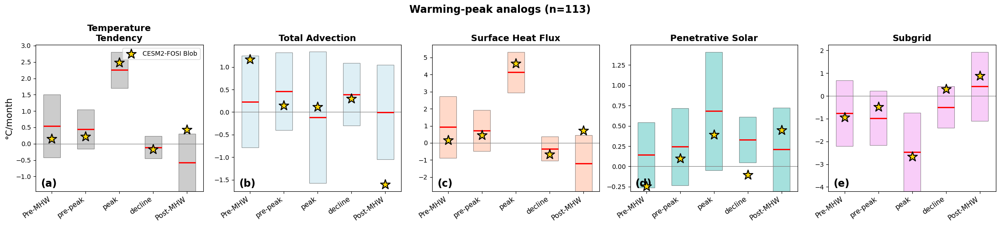

In [137]:
# ============================================================
# 5-panel plot: Warming-peak analogs, all terms
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_with_blob_no_dots(ax, term, phase_names_5, composite_warming,
                                        blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=14)
        ax.legend(fontsize=10, loc='upper right')

fig.suptitle(f'Warming-peak analogs (n={len(warming_keys)})', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('Figure_heat_budget_warming_peak_5panel.png', dpi=300, bbox_inches='tight')
plt.show()

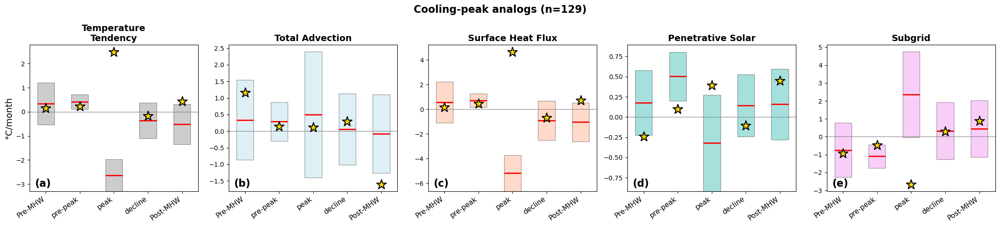

In [138]:
# ============================================================
# 5-panel plot: Cooling-peak analogs, all terms
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_with_blob_no_dots(ax, term, phase_names_5, composite_cooling,
                                        blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=14)

fig.suptitle(f'Cooling-peak analogs (n={len(cooling_keys)})', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('Figure_heat_budget_cooling_peak_5panel.png', dpi=300, bbox_inches='tight')
plt.show()

In [178]:
def plot_term_panel_violin_group(ax, term, phase_names, keys, hb_phases_all, blob_values, title, color):
    individual_vals = get_individual_values_by_phase(keys, hb_phases_all, term, phase_names)
    data_for_violin = [individual_vals[p] for p in phase_names]
    positions = np.arange(len(phase_names))

    parts = ax.violinplot(data_for_violin, positions=positions, showmeans=True, showmedians=False, widths=0.7)

    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_alpha(0.6)
        pc.set_edgecolor('k')
        pc.set_linewidth(0.8)
    parts['cmeans'].set_color('red')
    parts['cmeans'].set_linewidth(2)
    parts['cbars'].set_color('k')
    parts['cmins'].set_color('k')
    parts['cmaxes'].set_color('k')

    for i, phase in enumerate(phase_names):
        if phase in blob_values and not np.isnan(blob_values[phase]):
            ax.scatter(i, blob_values[phase], color='gold', edgecolor='black', s=200,
                       marker='*', zorder=20, linewidth=1.3, label='CESM2-FOSI Blob' if i == 0 else None)

    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xticks(positions)
    ax.set_xticklabels(phase_names, fontsize=13, rotation=35, ha='right')
    ax.set_title(title, fontsize=18, fontweight='bold')

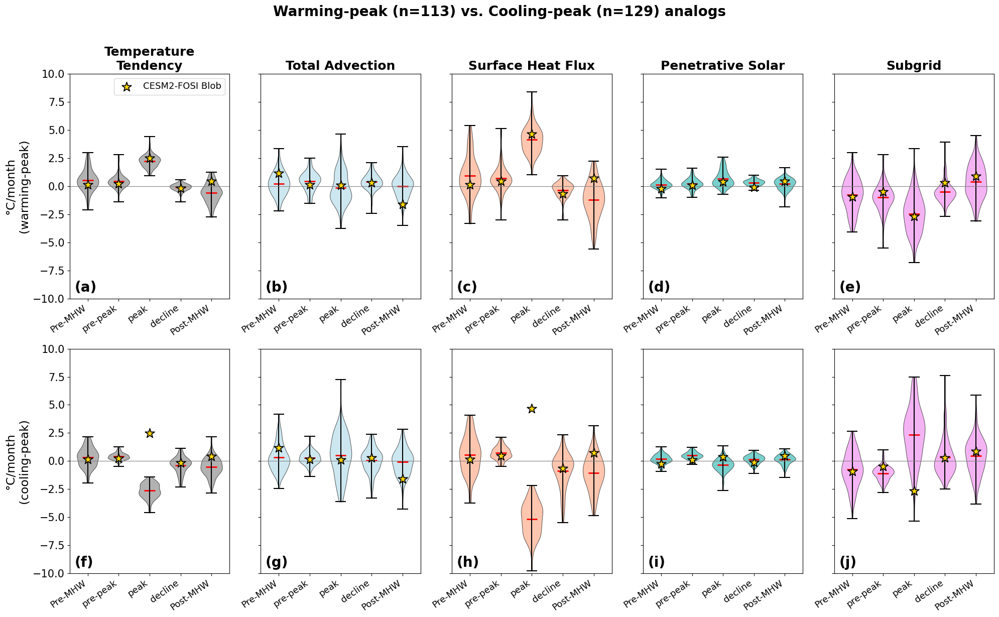

In [183]:
fig, axes = plt.subplots(2, 5, figsize=(20, 12))

terms = ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']

# --- Row 1: Warming-peak ---
for ax, term, letter in zip(axes[0], terms, panel_letters):
    plot_term_panel_violin_group(ax, term, phase_names_5, warming_keys, hb_phases_40,
                                   blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=20, fontweight='bold')
    ax.tick_params(axis='y', labelsize=15)
    ax.set_ylim(-10, 10)
    if ax == axes[0, 0]:
        ax.set_ylabel('°C/month\n(warming-peak)', fontsize=17)
        ax.legend(fontsize=13, loc='upper right', frameon=True)
    else:
        ax.set_yticklabels([])

# --- Row 2: Cooling-peak ---
letters_row2 = ['(f)', '(g)', '(h)', '(i)', '(j)']
for ax, term, letter in zip(axes[1], terms, letters_row2):
    plot_term_panel_violin_group(ax, term, phase_names_5, cooling_keys, hb_phases_40,
                                   blob_values_by_term_5[term], '', term_colors[term])  # no title on row 2
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=20, fontweight='bold')
    ax.tick_params(axis='y', labelsize=15)
    ax.set_ylim(-10, 10)
    if ax == axes[1, 0]:
        ax.set_ylabel('°C/month\n(cooling-peak)', fontsize=17)
    else:
        ax.set_yticklabels([])

fig.suptitle(f'Warming-peak (n={len(warming_keys)}) vs. Cooling-peak (n={len(cooling_keys)}) analogs', fontsize=20, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('Figure_heat_budget_warming_vs_cooling_violin.png', dpi=300, bbox_inches='tight')
plt.show()

In [180]:
print("=== Warming-peak composite (mean ± std, °C/month) ===")
for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    for phase in phase_names_5:
        mean, std, n = composite_warming[term][phase]
        print(f"{term} - {phase}: {mean:.2f}±{std:.2f} (n={n})")

print("\n=== Cooling-peak composite (mean ± std, °C/month) ===")
for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    for phase in phase_names_5:
        mean, std, n = composite_cooling[term][phase]
        print(f"{term} - {phase}: {mean:.2f}±{std:.2f} (n={n})")

=== Warming-peak composite (mean ± std, °C/month) ===
TEND_TEMP - Pre-MHW: 0.54±0.97 (n=113)
TEND_TEMP - pre-peak: 0.44±0.60 (n=85)
TEND_TEMP - peak: 2.25±0.55 (n=113)
TEND_TEMP - decline: -0.11±0.34 (n=112)
TEND_TEMP - Post-MHW: -0.57±0.88 (n=113)
TOT_ADV - Pre-MHW: 0.23±1.02 (n=113)
TOT_ADV - pre-peak: 0.46±0.86 (n=85)
TOT_ADV - peak: -0.11±1.46 (n=113)
TOT_ADV - decline: 0.39±0.70 (n=112)
TOT_ADV - Post-MHW: -0.00±1.05 (n=113)
SHF_depth - Pre-MHW: 0.93±1.80 (n=113)
SHF_depth - pre-peak: 0.72±1.20 (n=85)
SHF_depth - peak: 4.14±1.19 (n=113)
SHF_depth - decline: -0.34±0.70 (n=112)
SHF_depth - Post-MHW: -1.19±1.63 (n=113)
QSW_3D - Pre-MHW: 0.14±0.40 (n=113)
QSW_3D - pre-peak: 0.24±0.48 (n=85)
QSW_3D - peak: 0.68±0.73 (n=113)
QSW_3D - decline: 0.33±0.28 (n=112)
QSW_3D - Post-MHW: 0.21±0.51 (n=113)
SUBGRID - Pre-MHW: -0.76±1.44 (n=113)
SUBGRID - pre-peak: -0.97±1.19 (n=85)
SUBGRID - peak: -2.46±1.72 (n=113)
SUBGRID - decline: -0.49±0.91 (n=112)
SUBGRID - Post-MHW: 0.42±1.52 (n=113)

=== C

In [181]:
N_years = 100 * 42

for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    values = np.array(get_individual_values_by_phase(warming_keys, hb_phases_40, term, ['peak'])['peak'])
    blob_val = blob_values_by_term_5[term]['peak']
    if np.isnan(blob_val) or len(values) == 0:
        continue
    p = np.mean(values >= blob_val)
    rp = N_years / (len(values) * p) if p > 0 else np.inf
    print(f"{term} at peak: Blob={blob_val:.2f}, {100*p:.1f}% of warming-peak analogs exceed, return period={rp:.1f} yr")

TEND_TEMP at peak: Blob=2.49, 30.1% of warming-peak analogs exceed, return period=123.5 yr
TOT_ADV at peak: Blob=0.11, 39.8% of warming-peak analogs exceed, return period=93.3 yr
SHF_depth at peak: Blob=4.66, 31.9% of warming-peak analogs exceed, return period=116.7 yr
QSW_3D at peak: Blob=0.39, 59.3% of warming-peak analogs exceed, return period=62.7 yr
SUBGRID at peak: Blob=-2.66, 54.0% of warming-peak analogs exceed, return period=68.9 yr


In [182]:
for group_name, composite in [('Warming-peak', composite_warming), ('Cooling-peak', composite_cooling)]:
    print(f"\n{group_name} closure check:")
    for phase in phase_names_5:
        tend_mean = composite['TEND_TEMP'][phase][0]
        sum_terms = sum(composite[t][phase][0] for t in ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'])
        print(f"{phase}: TEND_TEMP={tend_mean:.3f}, sum of terms={sum_terms:.3f}, diff={tend_mean-sum_terms:.3f}")


Warming-peak closure check:
Pre-MHW: TEND_TEMP=0.541, sum of terms=0.540, diff=0.000
pre-peak: TEND_TEMP=0.445, sum of terms=0.442, diff=0.003
peak: TEND_TEMP=2.255, sum of terms=2.248, diff=0.006
decline: TEND_TEMP=-0.108, sum of terms=-0.110, diff=0.002
Post-MHW: TEND_TEMP=-0.570, sum of terms=-0.567, diff=-0.003

Cooling-peak closure check:
Pre-MHW: TEND_TEMP=0.331, sum of terms=0.331, diff=0.000
pre-peak: TEND_TEMP=0.416, sum of terms=0.413, diff=0.003
peak: TEND_TEMP=-2.639, sum of terms=-2.642, diff=0.003
decline: TEND_TEMP=-0.364, sum of terms=-0.362, diff=-0.002
Post-MHW: TEND_TEMP=-0.517, sum of terms=-0.514, diff=-0.003


In [184]:
N_years = 100 * 42

def get_percentile_and_rp(term, phase, keys, hb_phases_all, blob_val):
    values = np.array(get_individual_values_by_phase(keys, hb_phases_all, term, [phase])[phase])
    if len(values) == 0 or np.isnan(blob_val):
        return None, None, None
    p = np.mean(values >= blob_val)
    rp = N_years / (len(values) * p) if p > 0 else np.inf
    return 100 * (1 - p), p, rp  # percentile, exceedance fraction, return period


print("=== Warming-peak analogs: FOSI Blob percentile at each phase ===")
for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    for phase in phase_names_5:
        blob_val = blob_values_by_term_5[term].get(phase, np.nan)
        pct, p_exceed, rp = get_percentile_and_rp(term, phase, warming_keys, hb_phases_40, blob_val)
        if pct is not None:
            print(f"{term} - {phase}: Blob={blob_val:.2f}, percentile={pct:.1f}, "
                  f"{100*p_exceed:.1f}% exceed, RP={rp:.1f} yr")

=== Warming-peak analogs: FOSI Blob percentile at each phase ===
TEND_TEMP - Pre-MHW: Blob=0.15, percentile=33.6, 66.4% exceed, RP=56.0 yr
TEND_TEMP - pre-peak: Blob=0.22, percentile=31.8, 68.2% exceed, RP=72.4 yr
TEND_TEMP - peak: Blob=2.49, percentile=69.9, 30.1% exceed, RP=123.5 yr
TEND_TEMP - decline: Blob=-0.18, percentile=37.5, 62.5% exceed, RP=60.0 yr
TEND_TEMP - Post-MHW: Blob=0.44, percentile=88.5, 11.5% exceed, RP=323.1 yr
TOT_ADV - Pre-MHW: Blob=1.17, percentile=82.3, 17.7% exceed, RP=210.0 yr
TOT_ADV - pre-peak: Blob=0.14, percentile=28.2, 71.8% exceed, RP=68.9 yr
TOT_ADV - peak: Blob=0.11, percentile=60.2, 39.8% exceed, RP=93.3 yr
TOT_ADV - decline: Blob=0.30, percentile=44.6, 55.4% exceed, RP=67.7 yr
TOT_ADV - Post-MHW: Blob=-1.61, percentile=4.4, 95.6% exceed, RP=38.9 yr
SHF_depth - Pre-MHW: Blob=0.16, percentile=36.3, 63.7% exceed, RP=58.3 yr
SHF_depth - pre-peak: Blob=0.46, percentile=41.2, 58.8% exceed, RP=84.0 yr
SHF_depth - peak: Blob=4.66, percentile=68.1, 31.9% ex

n = 113
TOT_ADV Post-MHW: min=-3.48, max=3.52, mean=-0.00, std=1.05
SHF_depth Post-MHW: min=-5.56, max=2.24, mean=-1.19, std=1.63


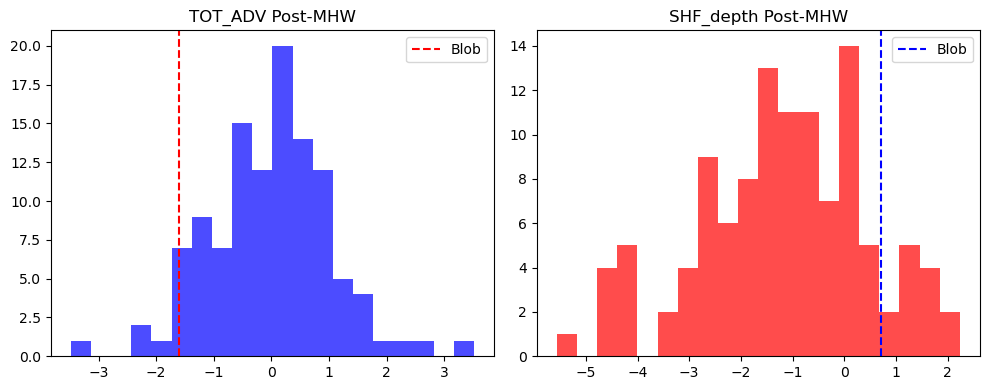

In [185]:
# ============================================================
# Check 1: How many analogs actually have valid Post-MHW data, and what does the raw distribution look like?
# ============================================================
tot_adv_postmhw = np.array(get_individual_values_by_phase(warming_keys, hb_phases_40, 'TOT_ADV', ['Post-MHW'])['Post-MHW'])
shf_postmhw = np.array(get_individual_values_by_phase(warming_keys, hb_phases_40, 'SHF_depth', ['Post-MHW'])['Post-MHW'])

print(f"n = {len(tot_adv_postmhw)}")
print(f"TOT_ADV Post-MHW: min={tot_adv_postmhw.min():.2f}, max={tot_adv_postmhw.max():.2f}, "
      f"mean={tot_adv_postmhw.mean():.2f}, std={tot_adv_postmhw.std():.2f}")
print(f"SHF_depth Post-MHW: min={shf_postmhw.min():.2f}, max={shf_postmhw.max():.2f}, "
      f"mean={shf_postmhw.mean():.2f}, std={shf_postmhw.std():.2f}")

# Histogram check for outliers/data issues
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].hist(tot_adv_postmhw, bins=20, color='blue', alpha=0.7)
axes[0].axvline(-1.61, color='red', linestyle='--', label='Blob')
axes[0].set_title('TOT_ADV Post-MHW')
axes[0].legend()
axes[1].hist(shf_postmhw, bins=20, color='red', alpha=0.7)
axes[1].axvline(0.72, color='blue', linestyle='--', label='Blob')
axes[1].set_title('SHF_depth Post-MHW')
axes[1].legend()
plt.tight_layout()
plt.show()

In [186]:
# ============================================================
# Check 2: Is the FOSI Blob's own Post-MHW value robust, or sensitive to exactly which 2 months got used as padding?
# (recall: Post-MHW is just 2 months for the Blob, since that's the fixed padding window)
# ============================================================
print("FOSI Blob's actual Post-MHW months and values:")
fosi_tend_full = fosi_hb_profile['TEND_TEMP']
fosi_totadv_full = fosi_hb_profile['TOT_ADV']
fosi_shf_full = fosi_hb_profile['SHF_depth']

# Post-MHW is the LAST 2 months of the padded time series
print("Last 2 months (Post-MHW):", [str(t)[:7] for t in fosi_tend_full.time.values[-2:]])
print("TOT_ADV values:", fosi_totadv_full.values[-2:])
print("SHF_depth values:", fosi_shf_full.values[-2:])
print("TEND_TEMP values:", fosi_tend_full.values[-2:])

FOSI Blob's actual Post-MHW months and values:
Last 2 months (Post-MHW): ['2016-01', '2016-02']
TOT_ADV values: [-1.87195947 -1.33822259]
SHF_depth values: [1.30774932 0.12546592]
TEND_TEMP values: [0.77632952 0.09682747]


In [187]:
def phase_split_adaptive_subsurface(profile, pre_post_months=2, min_months_for_5phase=8):
    """
    profile: (time, z_t) DataArray, padded subsurface anomaly profile.
    Peak is defined as the month of maximum SURFACE (shallowest z_t) anomaly, not tendency.
    """
    n_total = len(profile.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months
    core_length = core_end - core_start

    surface_series = profile.isel(z_t=0)  # shallowest level, used to find peak SSTa month

    if core_length < min_months_for_5phase:
        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        detection = profile.isel(time=slice(core_start, core_end)).mean(dim='time')
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')
        result = xr.concat([pre_mhw, detection, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'detection', 'Post-MHW'])
        return result, 3, None

    else:
        core_surface = surface_series.isel(time=slice(core_start, core_end))
        peak_idx_within_core = int(core_surface.values.argmax())  # max SSTa, not abs(tendency)
        peak_idx_global = core_start + peak_idx_within_core

        has_prepeak = peak_idx_global > core_start
        has_decline = peak_idx_global < core_end - 1

        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        prepeak = profile.isel(time=slice(core_start, peak_idx_global)).mean(dim='time') if has_prepeak else xr.full_like(pre_mhw, np.nan)
        peak = profile.isel(time=peak_idx_global)
        decline = profile.isel(time=slice(peak_idx_global + 1, core_end)).mean(dim='time') if has_decline else xr.full_like(pre_mhw, np.nan)
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')

        result = xr.concat([pre_mhw, prepeak, peak, decline, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW'])
        peak_date = profile.time.values[peak_idx_global]
        return result, 5, peak_date

In [188]:
# ============================================================
# Reload subsurface profiles (if not already in this notebook)
# ============================================================
import pickle
import os

output_dir = '/glade/derecho/scratch/cassiacai/subsurface_profiles_by_member'
subsurface_profiles = {}
for member_id in range(100):
    save_path = f'{output_dir}/member_{member_id}.pkl'
    if os.path.exists(save_path):
        with open(save_path, 'rb') as f:
            subsurface_profiles.update(pickle.load(f))

print(f"Total analogs loaded: {len(subsurface_profiles)}")

Total analogs loaded: 331


In [189]:
# ============================================================
# Adaptive phase-splitting function (peak SSTa-based)
# ============================================================
import xarray as xr
import numpy as np

def phase_split_adaptive_subsurface(profile, pre_post_months=2, min_months_for_5phase=8):
    n_total = len(profile.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months
    core_length = core_end - core_start

    surface_series = profile.isel(z_t=0)

    if core_length < min_months_for_5phase:
        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        detection = profile.isel(time=slice(core_start, core_end)).mean(dim='time')
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')
        result = xr.concat([pre_mhw, detection, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'detection', 'Post-MHW'])
        return result, 3, None
    else:
        core_surface = surface_series.isel(time=slice(core_start, core_end))
        peak_idx_within_core = int(core_surface.values.argmax())
        peak_idx_global = core_start + peak_idx_within_core

        has_prepeak = peak_idx_global > core_start
        has_decline = peak_idx_global < core_end - 1

        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        prepeak = profile.isel(time=slice(core_start, peak_idx_global)).mean(dim='time') if has_prepeak else xr.full_like(pre_mhw, np.nan)
        peak = profile.isel(time=peak_idx_global)
        decline = profile.isel(time=slice(peak_idx_global + 1, core_end)).mean(dim='time') if has_decline else xr.full_like(pre_mhw, np.nan)
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')

        result = xr.concat([pre_mhw, prepeak, peak, decline, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW'])
        peak_date = profile.time.values[peak_idx_global]
        return result, 5, peak_date

In [190]:
# ============================================================
# Apply to every analog
# ============================================================
subsurface_phases_adaptive = {}
phase_count_used = {3: 0, 5: 0}

for key, data in subsurface_profiles.items():
    phases, n_phases, peak_date = phase_split_adaptive_subsurface(data['profile'])
    subsurface_phases_adaptive[key] = {'phases': phases, 'n_phases': n_phases, 'peak_date': peak_date}
    phase_count_used[n_phases] += 1

print(f"3-phase: {phase_count_used[3]}, 5-phase: {phase_count_used[5]}")

3-phase: 89, 5-phase: 242


In [191]:
# ============================================================
# Group by season (5-phase analogs only, matching heat budget's threshold)
# ============================================================
def get_season(month):
    if month in [12, 1, 2]: return 'DJF'
    elif month in [3, 4, 5]: return 'MAM'
    elif month in [6, 7, 8]: return 'JJA'
    else: return 'SON'

keys_5phase_subsurface = [k for k, v in subsurface_phases_adaptive.items() if v['n_phases'] == 5]

season_groups_5phase = {'DJF': [], 'MAM': [], 'JJA': [], 'SON': []}
for key in keys_5phase_subsurface:
    season = get_season(subsurface_profiles[key]['season'])
    season_groups_5phase[season].append(key)

for season, keys in season_groups_5phase.items():
    print(f"{season}: {len(keys)} analogs")

DJF: 72 analogs
MAM: 105 analogs
JJA: 40 analogs
SON: 25 analogs


In [192]:
# ============================================================
# Composite: average the 5-phase profiles across analogs, per season
# ============================================================
season_composites_5phase = {}
for season, keys in season_groups_5phase.items():
    if len(keys) == 0:
        continue
    profiles_in_season = xr.concat([subsurface_phases_adaptive[k]['phases'] for k in keys], dim='analog')
    season_composites_5phase[season] = profiles_in_season.mean(dim='analog', skipna=True)

print(f"Composited seasons (5-phase): {list(season_composites_5phase.keys())}")

Composited seasons (5-phase): ['DJF', 'MAM', 'JJA', 'SON']


In [194]:
# ============================================================
# Rebuild FOSI Blob's subsurface profile from scratch
# ============================================================
# --- FOSI Blob labels + confirmed 20-month window ---
fosi_blobs = xr.open_dataset('fosi_blobs_r2.nc').labels
object_id = 94.0
blob_times = fosi_blobs.time.where((fosi_blobs == object_id).any(dim=('lat','lon')), drop=True)

print(f"n_months: {len(blob_times)}")  # should print 20

n_months: 20


In [196]:
# ============================================================
# Step 1: Load raw FOSI 3D TEMP, restricted to 155m, masked (Arctic/marginal seas excluded)
# ============================================================
grid = pop_tools.get_grid('POP_gx1v7')
mask = xr.where((grid['REGION_MASK']>0) & (grid['REGION_MASK']<9), 1, np.nan)

field = 'TEMP'
firstyear, lastyear = 1979, 2020

fpath = '/glade/campaign/cesm/development/espwg/SMYLE/initial_conditions/SMYLE-FOSI/ocn/proc/tseries/month_1/'
fname = f'g.e22.GOMIPECOIAF_JRA-1p4-2018.TL319_g17.SMYLE.005.pop.h.{field}.030601-036812.nc'

ds_smyle_fosi_temp = xr.open_dataset(fpath+fname)[field].isel(z_t=slice(0, 16))

fosi_montime_vals = [cftime.DatetimeNoLeap(1958+year, 1+month, 15) for year in range(63) for month in range(12)]
ds_smyle_fosi_temp['time'] = fosi_montime_vals

fosi_temp_raw = ds_smyle_fosi_temp[ds_smyle_fosi_temp.time['time.year'].isin(list(range(firstyear, lastyear+1)))].where(mask==1, np.nan)

print(fosi_temp_raw.dims, fosi_temp_raw.shape)

/glade/u/apps/opt/conda/envs/npl-2025b/lib/python3.12/site-packages/pop_tools/__init__.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/glade/derecho/scratch/cassiacai/tmp/ipykernel_68754/1427765005.py:16: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_

('time', 'z_t', 'nlat', 'nlon') (504, 16, 384, 320)


In [201]:
#### CESM LENS2 for GRIDDING PURPOSES
var = 'SST'
comp = 'atm'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
ens_memb_index = 0
ds_var_hist_SST, ds_var_fut_SST = afuncs.get_ds_var(directory, 'SST','atm', ens_memb_index) 

# selecting our observational time period overlap with ERA5 (1979 to 2022)
CESMLENS_SST_hist_time_slice = ds_var_hist_SST.SST.sel(time=slice('1979-01-01', '2015-01-01'))
    
CESMLENS_SST_fut_time_slice = ds_var_fut_SST.SST.sel(time=slice('2015-02-01', '2020-12-01'))

CESMLENS_SST_ds = xr.concat([CESMLENS_SST_hist_time_slice, CESMLENS_SST_fut_time_slice], dim='time')
CESMLENS_SST = CESMLENS_SST_ds.compute()

In [202]:
# ============================================================
# Step 2: Regrid to CESM2-LENS grid
# ============================================================
fosi_temp_1deg_wzeros = afuncs.regrid_SMYLE(fosi_temp_raw)
fosi_temp_1deg = fosi_temp_1deg_wzeros.where(fosi_temp_1deg_wzeros != 0, np.nan)

regridder_temp = xe.Regridder(fosi_temp_1deg.sel(time=slice('1979-01-01','2021-01-01')),
                                CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
fosi_temp_regridded = regridder_temp(fosi_temp_1deg.sel(time=slice('1979-01-01','2021-01-01')))

print(fosi_temp_regridded.dims, fosi_temp_regridded.shape)

('time', 'z_t', 'lat', 'lon') (504, 16, 192, 288)


In [204]:
# ============================================================
# 4D detrending function (yours, confirmed working)
# ============================================================
def calculate_anomalies_trend_features_4d(ds):
    if 'z_t' not in ds.dims:
        raise ValueError("Input data must have 'z_t' dimension")

    dyr = ds.time.dt.year + ds.time.dt.month/12
    model = np.array([
        np.ones(len(dyr)), dyr - np.mean(dyr),
        np.sin(2*np.pi*dyr), np.cos(2*np.pi*dyr),
        np.sin(4*np.pi*dyr), np.cos(4*np.pi*dyr)
    ])
    pmodel = np.linalg.pinv(model)

    model_da = xr.DataArray(model.T, dims=['time','coeff'], coords={'time': ds.time, 'coeff': np.arange(1,7)})
    pmodel_da = xr.DataArray(pmodel.T, dims=['coeff','time'], coords={'coeff': np.arange(1,7), 'time': ds.time})

    coeffs = xr.dot(pmodel_da, ds)
    mean = model_da[:, 0].dot(coeffs.sel(coeff=1))
    trend = model_da[:, 1].dot(coeffs.sel(coeff=2))
    seas = model_da[:, 2:].dot(coeffs.sel(coeff=slice(3, 6)))

    full_model = model_da.dot(coeffs)
    ssta_notrend = ds - full_model

    if ssta_notrend.chunks:
        ssta_notrend = ssta_notrend.chunk({'time': -1, 'z_t': -1})

    threshold = ssta_notrend.quantile(0.9, dim=('time'))
    features_notrend = ssta_notrend.where(ssta_notrend >= threshold)

    return mean, trend, seas, features_notrend, ssta_notrend

In [205]:
# ============================================================
# Step 3: Detrend/deseasonalize (4D function)
# ============================================================
mean, trend, seas, features_notrend, fosi_ssta_3d_notrend = calculate_anomalies_trend_features_4d(fosi_temp_regridded)

fosi_ssta_3d_NEP = fosi_ssta_3d_notrend.sel(lon=slice(150, 250), lat=slice(5, 65))
print(fosi_ssta_3d_NEP.dims, fosi_ssta_3d_NEP.shape)

/glade/u/apps/opt/conda/envs/npl-2025b/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


('time', 'z_t', 'lat', 'lon') (504, 16, 64, 81)


In [206]:
# ============================================================
# Step 4: Apply canonical footprint (mask_3), extract padded profile
# ============================================================
mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj
mask_3 = xr.where(mask_3 > 0.1, 1, 0)

fosi_ssta_masked = fosi_ssta_3d_NEP.where(mask_3 == 1)

fosi_blobs = xr.open_dataset('fosi_blobs_r2.nc').labels
object_id = 94.0
blob_times = fosi_blobs.time.where((fosi_blobs == object_id).any(dim=('lat','lon')), drop=True)

full_time_index = fosi_ssta_masked.time
first_idx = int(np.where(full_time_index.values == blob_times.values[0])[0][0])
last_idx = int(np.where(full_time_index.values == blob_times.values[-1])[0][0])
pad_start = max(0, first_idx - 2)
pad_end = min(len(full_time_index) - 1, last_idx + 2)
padded_times = full_time_index.isel(time=slice(pad_start, pad_end + 1))

fosi_profile = fosi_ssta_masked.sel(time=padded_times).mean(dim=('lat','lon')).compute()
print(fosi_profile.dims, fosi_profile.shape)  # should be (time, z_t), time~24

('time', 'z_t') (24, 16)


In [207]:
# ============================================================
# FOSI Blob's own adaptive phase split (should be 5-phase given 20-month duration)
# ============================================================
fosi_phases_subsurface_adaptive, n_phases_fosi, peak_date_fosi = phase_split_adaptive_subsurface(fosi_profile)
print(f"FOSI Blob: {n_phases_fosi}-phase, peak SSTa month = {str(peak_date_fosi)[:7] if peak_date_fosi else 'N/A'}")

FOSI Blob: 5-phase, peak SSTa month = 2014-09


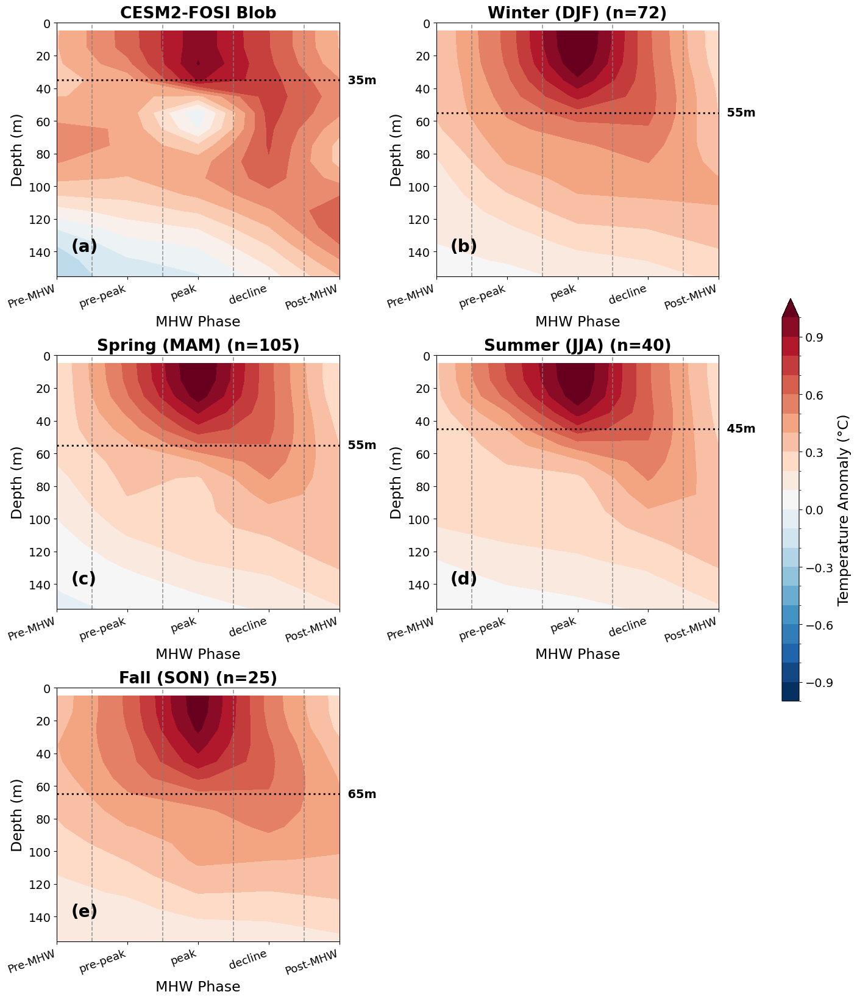

50%-decay depths (at peak SSTa month): {'FOSI': 35.0, 'DJF': 55.0, 'MAM': 55.0, 'JJA': 45.0, 'SON': 65.0}


In [209]:
# ============================================================
# Plot: same 2-column layout as before, now using 5-phase peak-SSTa composites
# ============================================================
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 2, figsize=(14, 16.5))

season_labels = {'DJF': 'Winter (DJF)', 'MAM': 'Spring (MAM)', 'JJA': 'Summer (JJA)', 'SON': 'Fall (SON)'}
decay_depths = {}
last_contour = None

def plot_panel(ax, phases, title, letter, n=None):
    global last_contour
    contour = phases.transpose().plot.contourf(
        ax=ax, yincrease=False, cmap='RdBu_r', robust=True,
        levels=21, vmin=-1, vmax=1, add_colorbar=False
    )
    last_contour = contour

    n_phases_here = len(phases.phase)
    for x in (np.arange(n_phases_here - 1) + 0.5):
        ax.axvline(x, color='grey', linestyle='--', linewidth=1.2, alpha=0.8)

    peak_label = 'peak' if 'peak' in phases.phase.values else 'detection'
    detection_profile = phases.sel(phase=peak_label)
    surface_val = float(detection_profile.isel(z_t=0))
    half_max = surface_val * 0.5
    above_half = detection_profile.where(detection_profile >= half_max, drop=True)
    decay_depth_cm = float(above_half.z_t.max()) if above_half.size > 0 else np.nan

    ax.axhline(decay_depth_cm, color='black', linestyle=':', linewidth=2.2, alpha=0.9)
    ax.text(n_phases_here - 1, decay_depth_cm, f'  {decay_depth_cm/100:.0f}m', va='center', ha='left',
            fontsize=14, fontweight='bold', color='black')

    ax.set_xticks(np.arange(n_phases_here))
    ax.set_xticklabels(phases.phase.values, fontsize=13, rotation=20, ha='right')
    ax.set_yticks([0, 2000, 4000, 6000, 8000, 10000, 12000, 14000])
    ax.set_yticklabels([0, 20, 40, 60, 80, 100, 120, 140], fontsize=14)
    ax.set_xlabel("MHW Phase", fontsize=17)
    ax.set_ylabel("Depth (m)", fontsize=17)
    ax.set_ylim(15500, 0)
    full_title = f'{title} (n={n})' if n is not None else title
    ax.set_title(full_title, fontsize=19, fontweight='bold')
    ax.text(0.05, 0.15, letter, transform=ax.transAxes, fontsize=20, fontweight='bold', va='top')

    return decay_depth_cm / 100

panels = [
    ('FOSI', fosi_phases_subsurface_adaptive, 'CESM2-FOSI Blob', '(a)', None),
    ('DJF', season_composites_5phase.get('DJF'), season_labels['DJF'], '(b)', len(season_groups_5phase['DJF'])),
    ('MAM', season_composites_5phase.get('MAM'), season_labels['MAM'], '(c)', len(season_groups_5phase['MAM'])),
    ('JJA', season_composites_5phase.get('JJA'), season_labels['JJA'], '(d)', len(season_groups_5phase['JJA'])),
    ('SON', season_composites_5phase.get('SON'), season_labels['SON'], '(e)', len(season_groups_5phase['SON'])),
]

axes_flat = axes.flatten()
for ax, (key, phases, title, letter, n) in zip(axes_flat, panels):
    if phases is None:
        ax.set_visible(False)
        continue
    decay_depths[key] = plot_panel(ax, phases, title, letter, n)

axes_flat[5].set_visible(False)
plt.tight_layout(rect=[0, 0, 0.9, 1])
cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
cbar = fig.colorbar(last_contour, cax=cbar_ax)
cbar.set_label('Temperature Anomaly (°C)', fontsize=17)
cbar.ax.tick_params(labelsize=14)

plt.savefig('Figure_subsurface_5phase_peakSSTa.png', dpi=300, bbox_inches='tight')
plt.show()

print("50%-decay depths (at peak SSTa month):", decay_depths)

In [210]:
# Confirm which month is being used as "peak" for the FOSI Blob under peak-SSTa definition
print(f"FOSI Blob peak SSTa month: {str(peak_date_fosi)[:7]}")

# Compare against the peak TENDENCY month from the heat-budget analysis (January 2015)
# If these are different months, that explains why the vertical structure looks different

FOSI Blob peak SSTa month: 2014-09


In [211]:
def phase_split_adaptive_subsurface_peak_subsurface_warmth(profile, pre_post_months=2, min_months_for_5phase=8,
                                                              depth_range_cm=None):
    """
    profile: (time, z_t) padded anomaly profile.
    'Peak' is defined as the month with maximum DEPTH-INTEGRATED (or depth-averaged) subsurface warmth,
    not surface SSTa and not tendency.

    depth_range_cm: optional (min_cm, max_cm) tuple to restrict which depths count as "subsurface"
                     (e.g., exclude the very shallow mixed layer if you want strictly subsurface warmth)
    """
    n_total = len(profile.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months
    core_length = core_end - core_start

    if depth_range_cm is not None:
        subsurface_profile = profile.sel(z_t=slice(depth_range_cm[0], depth_range_cm[1]))
    else:
        subsurface_profile = profile  # use full depth range

    # Depth-averaged subsurface warmth, per month
    subsurface_warmth_series = subsurface_profile.mean(dim='z_t')

    if core_length < min_months_for_5phase:
        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        detection = profile.isel(time=slice(core_start, core_end)).mean(dim='time')
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')
        result = xr.concat([pre_mhw, detection, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'detection', 'Post-MHW'])
        return result, 3, None
    else:
        core_warmth = subsurface_warmth_series.isel(time=slice(core_start, core_end))
        peak_idx_within_core = int(core_warmth.values.argmax())
        peak_idx_global = core_start + peak_idx_within_core

        has_prepeak = peak_idx_global > core_start
        has_decline = peak_idx_global < core_end - 1

        pre_mhw = profile.isel(time=slice(0, core_start)).mean(dim='time')
        prepeak = profile.isel(time=slice(core_start, peak_idx_global)).mean(dim='time') if has_prepeak else xr.full_like(pre_mhw, np.nan)
        peak = profile.isel(time=peak_idx_global)
        decline = profile.isel(time=slice(peak_idx_global + 1, core_end)).mean(dim='time') if has_decline else xr.full_like(pre_mhw, np.nan)
        post_mhw = profile.isel(time=slice(-pre_post_months, None)).mean(dim='time')

        result = xr.concat([pre_mhw, prepeak, peak, decline, post_mhw], dim='phase').assign_coords(
            phase=['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW'])
        peak_date = profile.time.values[peak_idx_global]
        return result, 5, peak_date

In [212]:
# ============================================================
# Apply to FOSI Blob first, to check what month this identifies
# ============================================================
fosi_phases_subwarmth, n_phases_fosi_sw, peak_date_fosi_sw = phase_split_adaptive_subsurface_peak_subsurface_warmth(fosi_profile)
print(f"FOSI Blob: peak SUBSURFACE WARMTH month = {str(peak_date_fosi_sw)[:7]}")

FOSI Blob: peak SUBSURFACE WARMTH month = 2015-03


In [213]:
# ============================================================
# Apply to every analog
# ============================================================
subsurface_phases_subwarmth = {}
phase_count_used_sw = {3: 0, 5: 0}

for key, data in subsurface_profiles.items():
    phases, n_phases, peak_date = phase_split_adaptive_subsurface_peak_subsurface_warmth(data['profile'])
    subsurface_phases_subwarmth[key] = {'phases': phases, 'n_phases': n_phases, 'peak_date': peak_date}
    phase_count_used_sw[n_phases] += 1

print(f"3-phase: {phase_count_used_sw[3]}, 5-phase: {phase_count_used_sw[5]}")

3-phase: 89, 5-phase: 242


In [214]:
# ============================================================
# Group by season, composite (5-phase only)
# ============================================================
keys_5phase_sw = [k for k, v in subsurface_phases_subwarmth.items() if v['n_phases'] == 5]

season_groups_sw = {'DJF': [], 'MAM': [], 'JJA': [], 'SON': []}
for key in keys_5phase_sw:
    season = get_season(subsurface_profiles[key]['season'])
    season_groups_sw[season].append(key)

season_composites_sw = {}
for season, keys in season_groups_sw.items():
    if len(keys) == 0:
        continue
    profiles_in_season = xr.concat([subsurface_phases_subwarmth[k]['phases'] for k in keys], dim='analog')
    season_composites_sw[season] = profiles_in_season.mean(dim='analog', skipna=True)
    print(f"{season}: n={len(keys)}")

DJF: n=72
MAM: n=105
JJA: n=40
SON: n=25


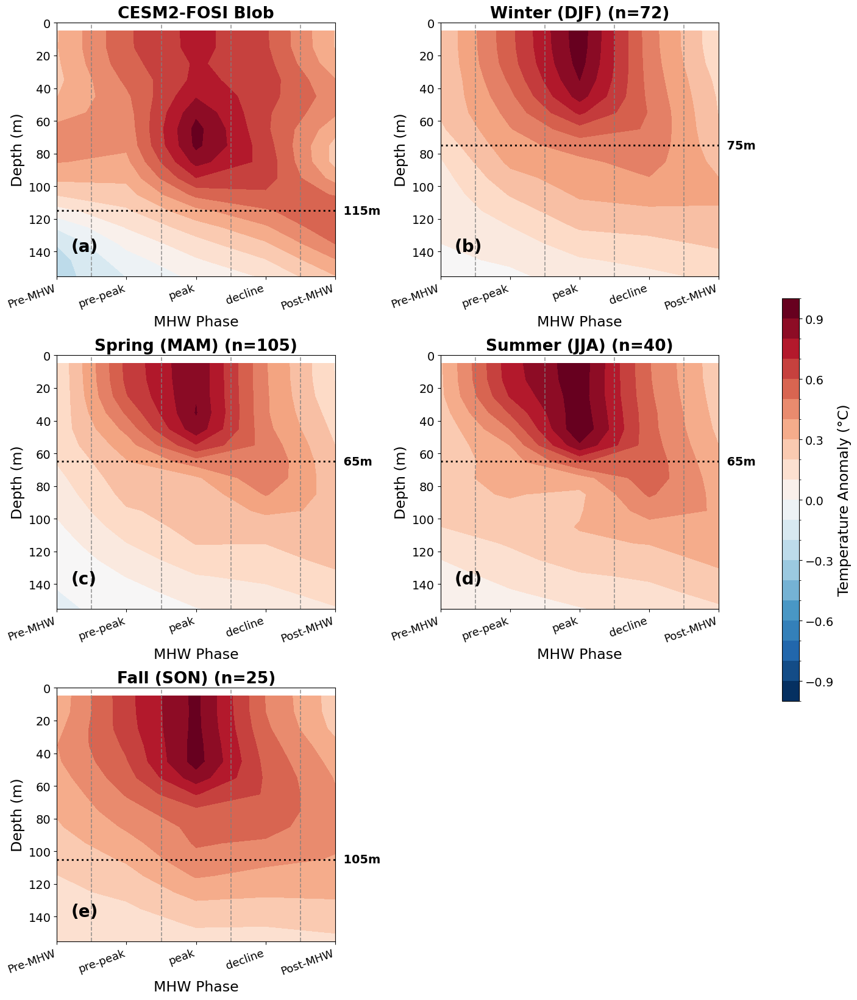

50%-decay depths (at peak subsurface warmth month): {'FOSI': 115.0, 'DJF': 75.0, 'MAM': 65.0, 'JJA': 65.0, 'SON': 105.0}


In [216]:
fig, axes = plt.subplots(3, 2, figsize=(14, 16.5))

season_labels = {'DJF': 'Winter (DJF)', 'MAM': 'Spring (MAM)', 'JJA': 'Summer (JJA)', 'SON': 'Fall (SON)'}
decay_depths_sw = {}
last_contour = None

def plot_panel(ax, phases, title, letter, n=None):
    global last_contour
    contour = phases.transpose().plot.contourf(
        ax=ax, yincrease=False, cmap='RdBu_r', robust=True,
        levels=21, vmin=-1, vmax=1, add_colorbar=False
    )
    last_contour = contour

    n_phases_here = len(phases.phase)
    for x in (np.arange(n_phases_here - 1) + 0.5):
        ax.axvline(x, color='grey', linestyle='--', linewidth=1.2, alpha=0.8)

    peak_label = 'peak' if 'peak' in phases.phase.values else 'detection'
    detection_profile = phases.sel(phase=peak_label)
    surface_val = float(detection_profile.isel(z_t=0))
    half_max = surface_val * 0.5
    above_half = detection_profile.where(detection_profile >= half_max, drop=True)
    decay_depth_cm = float(above_half.z_t.max()) if above_half.size > 0 else np.nan

    ax.axhline(decay_depth_cm, color='black', linestyle=':', linewidth=2.2, alpha=0.9)
    ax.text(n_phases_here - 1, decay_depth_cm, f'  {decay_depth_cm/100:.0f}m', va='center', ha='left',
            fontsize=14, fontweight='bold', color='black')

    ax.set_xticks(np.arange(n_phases_here))
    ax.set_xticklabels(phases.phase.values, fontsize=13, rotation=20, ha='right')
    ax.set_yticks([0, 2000, 4000, 6000, 8000, 10000, 12000, 14000])
    ax.set_yticklabels([0, 20, 40, 60, 80, 100, 120, 140], fontsize=14)
    ax.set_xlabel("MHW Phase", fontsize=17)
    ax.set_ylabel("Depth (m)", fontsize=17)
    ax.set_ylim(15500, 0)
    full_title = f'{title} (n={n})' if n is not None else title
    ax.set_title(full_title, fontsize=19, fontweight='bold')
    ax.text(0.05, 0.15, letter, transform=ax.transAxes, fontsize=20, fontweight='bold', va='top')

    return decay_depth_cm / 100

panels = [
    ('FOSI', fosi_phases_subwarmth, 'CESM2-FOSI Blob', '(a)', None),
    ('DJF', season_composites_sw.get('DJF'), season_labels['DJF'], '(b)', len(season_groups_sw['DJF'])),
    ('MAM', season_composites_sw.get('MAM'), season_labels['MAM'], '(c)', len(season_groups_sw['MAM'])),
    ('JJA', season_composites_sw.get('JJA'), season_labels['JJA'], '(d)', len(season_groups_sw['JJA'])),
    ('SON', season_composites_sw.get('SON'), season_labels['SON'], '(e)', len(season_groups_sw['SON'])),
]

axes_flat = axes.flatten()
for ax, (key, phases, title, letter, n) in zip(axes_flat, panels):
    if phases is None:
        ax.set_visible(False)
        continue
    decay_depths_sw[key] = plot_panel(ax, phases, title, letter, n)

axes_flat[5].set_visible(False)
plt.tight_layout(rect=[0, 0, 0.9, 1])
cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])
cbar = fig.colorbar(last_contour, cax=cbar_ax)
cbar.set_label('Temperature Anomaly (°C)', fontsize=17)
cbar.ax.tick_params(labelsize=14)

plt.savefig('Figure_subsurface_5phase_peakSubsurfaceWarmth.png', dpi=300, bbox_inches='tight')
plt.show()

print("50%-decay depths (at peak subsurface warmth month):", decay_depths_sw)

In [217]:
# ============================================================
# Get per-analog decay depth (at peak subsurface warmth month) for each season
# ============================================================
season_decay_depths_subwarmth = {season: [] for season in ['DJF', 'MAM', 'JJA', 'SON']}

for key in keys_5phase_sw:
    phases = subsurface_phases_subwarmth[key]['phases']
    peak_profile = phases.sel(phase='peak')
    surface_val = float(peak_profile.isel(z_t=0))
    if surface_val <= 0 or np.isnan(surface_val):
        continue
    half_max = surface_val * 0.5
    above_half = peak_profile.where(peak_profile >= half_max, drop=True)
    if above_half.size > 0:
        depth_m = float(above_half.z_t.max()) / 100
        season = get_season(subsurface_profiles[key]['season'])
        season_decay_depths_subwarmth[season].append(depth_m)

for season, depths_list in season_decay_depths_subwarmth.items():
    arr = np.array(depths_list)
    print(f"{season}: decay depth (peak subsurface warmth) = {arr.mean():.1f}±{arr.std():.1f}m (n={len(arr)})")

DJF: decay depth (peak subsurface warmth) = 79.2±26.1m (n=72)
MAM: decay depth (peak subsurface warmth) = 76.0±27.8m (n=105)
JJA: decay depth (peak subsurface warmth) = 80.2±26.5m (n=40)
SON: decay depth (peak subsurface warmth) = 94.2±25.3m (n=25)


In [218]:
# ============================================================
# Return periods: FOSI Blob (115m) vs. overall population, vs. MAM, vs. DJF
# ============================================================
N_years = 100 * 42
fosi_decay_depth_sw = 115.0

# Overall (pooled across all seasons)
all_decay_depths_sw = np.concatenate([np.array(v) for v in season_decay_depths_subwarmth.values()])
p_overall = np.mean(all_decay_depths_sw >= fosi_decay_depth_sw)
rp_overall = N_years / (len(all_decay_depths_sw) * p_overall) if p_overall > 0 else np.inf
print(f"Overall: {100*p_overall:.1f}% exceed 115m, return period = {rp_overall:.1f} years (n={len(all_decay_depths_sw)})")

# vs MAM (Blob's own season)
mam_depths_sw = np.array(season_decay_depths_subwarmth['MAM'])
p_mam = np.mean(mam_depths_sw >= fosi_decay_depth_sw)
rp_mam = N_years / (len(mam_depths_sw) * p_mam) if p_mam > 0 else np.inf
print(f"MAM only: {100*p_mam:.1f}% exceed 115m, return period = {rp_mam:.1f} years (n={len(mam_depths_sw)})")

# vs DJF (deepest-reaching season, per whole-event-average metric)
djf_depths_sw = np.array(season_decay_depths_subwarmth['DJF'])
p_djf = np.mean(djf_depths_sw >= fosi_decay_depth_sw)
rp_djf = N_years / (len(djf_depths_sw) * p_djf) if p_djf > 0 else np.inf
print(f"DJF only: {100*p_djf:.1f}% exceed 115m, return period = {rp_djf:.1f} years (n={len(djf_depths_sw)})")

Overall: 17.8% exceed 115m, return period = 97.7 years (n=242)
MAM only: 17.1% exceed 115m, return period = 233.3 years (n=105)
DJF only: 12.5% exceed 115m, return period = 466.7 years (n=72)


In [142]:
with open('/glade/derecho/scratch/cassiacai/section_3_2_analog_data.pkl', 'rb') as f:
    physical_bundle = pickle.load(f)

all_analog_characteristics = physical_bundle['all_analog_characteristics']
print(f"Loaded {len(all_analog_characteristics)} analogs")

Loaded 331 analogs


In [143]:
# ============================================================
# Statistics: duration, intensity, extent, MLD — comparing warming-peak vs cooling-peak groups
# ============================================================
def get_group_characteristics(keys, all_analog_characteristics):
    stats = {'duration': [], 'intensity_max': [], 'extent_max': [], 'mld_max': []}
    for key in keys:
        if key not in all_analog_characteristics:
            continue
        c = all_analog_characteristics[key]
        for stat in stats:
            if stat in c:
                stats[stat].append(c[stat])
    return {k: np.array(v) for k, v in stats.items()}

warming_stats = get_group_characteristics(warming_keys, all_analog_characteristics)
cooling_stats = get_group_characteristics(cooling_keys, all_analog_characteristics)

print("=== Warming-peak analogs ===")
for stat, vals in warming_stats.items():
    print(f"{stat}: {vals.mean():.2f}±{vals.std():.2f} (n={len(vals)})")

print("\n=== Cooling-peak analogs ===")
for stat, vals in cooling_stats.items():
    print(f"{stat}: {vals.mean():.2f}±{vals.std():.2f} (n={len(vals)})")

=== Warming-peak analogs ===
duration: 16.20±7.07 (n=113)
intensity_max: 3.95±1.42 (n=113)
extent_max: 19680128.33±4666996.77 (n=113)
mld_max: 200.66±30.79 (n=113)

=== Cooling-peak analogs ===
duration: 14.84±6.61 (n=129)
intensity_max: 4.00±1.61 (n=129)
extent_max: 19923211.39±4695689.38 (n=129)
mld_max: 194.32±31.83 (n=129)


In [144]:
# ============================================================
# Statistical test: are the two groups actually different in these characteristics?
# ============================================================
for stat in ['duration', 'intensity_max', 'extent_max', 'mld_max']:
    t, p = scipy_stats.ttest_ind(warming_stats[stat], cooling_stats[stat])
    print(f"{stat}: warming mean={warming_stats[stat].mean():.2f}, cooling mean={cooling_stats[stat].mean():.2f}, p={p:.4f}")

duration: warming mean=16.20, cooling mean=14.84, p=0.1255
intensity_max: warming mean=3.95, cooling mean=4.00, p=0.8078
extent_max: warming mean=19680128.33, cooling mean=19923211.39, p=0.6886
mld_max: warming mean=200.66, cooling mean=194.32, p=0.1191


In [145]:
# ============================================================
# Compute shared y-axis range across BOTH groups and all terms
# ============================================================
all_values_for_range = []
for composite in [composite_warming, composite_cooling]:
    for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
        for phase in phase_names_5:
            mean, std, n = composite[term][phase]
            if not np.isnan(mean):
                all_values_for_range.extend([mean - std, mean + std])

for term in ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']:
    blob_vals = [v for v in blob_values_by_term_5[term].values() if not np.isnan(v)]
    all_values_for_range.extend(blob_vals)

y_min = min(all_values_for_range) * 1.1
y_max = max(all_values_for_range) * 1.1
print(f"Shared y-axis range: {y_min:.2f} to {y_max:.2f}")

Shared y-axis range: -7.29 to 5.86


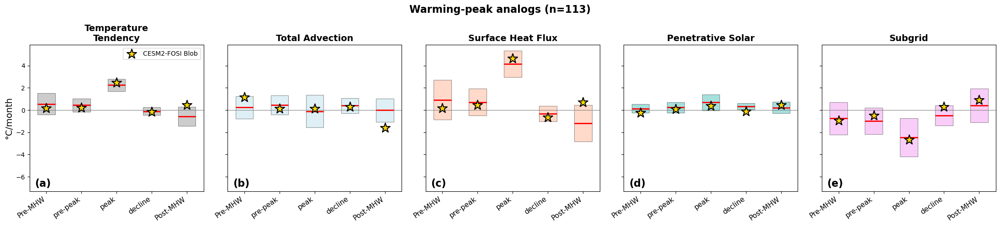

In [146]:
# ============================================================
# Warming-peak plot, with shared y-axis
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_with_blob_no_dots(ax, term, phase_names_5, composite_warming,
                                        blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    ax.set_ylim(y_min, y_max)
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=14)
        ax.legend(fontsize=10, loc='upper right')
    else:
        ax.set_yticklabels([])

fig.suptitle(f'Warming-peak analogs (n={len(warming_keys)})', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('Figure_heat_budget_warming_peak_5panel.png', dpi=300, bbox_inches='tight')
plt.show()

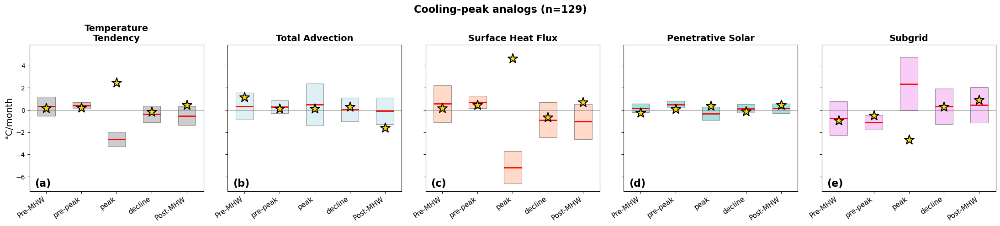

In [148]:
# ============================================================
# Cooling-peak plot, with SAME shared y-axis
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for ax, term, letter in zip(axes, ['TEND_TEMP', 'TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID'], panel_letters):
    plot_term_panel_with_blob_no_dots(ax, term, phase_names_5, composite_cooling,
                                        blob_values_by_term_5[term], term_titles[term], term_colors[term])
    ax.text(0.03, 0.03, letter, transform=ax.transAxes, fontsize=16, fontweight='bold')
    ax.set_ylim(y_min, y_max)
    if ax == axes[0]:
        ax.set_ylabel('°C/month', fontsize=14)
    else:
        ax.set_yticklabels([])

fig.suptitle(f'Cooling-peak analogs (n={len(cooling_keys)})', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('Figure_heat_budget_cooling_peak_5panel.png', dpi=300, bbox_inches='tight')
plt.show()

In [153]:
output_dir_hb = '/glade/derecho/scratch/cassiacai/heat_budget_profiles_by_member'

heat_budget_profiles_40 = {}
for member_id in range(100):
    save_path = f'{output_dir_hb}/member_{member_id}.pkl'
    if os.path.exists(save_path):
        with open(save_path, 'rb') as f:
            heat_budget_profiles_40.update(pickle.load(f))

print(f"Total analogs loaded: {len(heat_budget_profiles_40)}")

Total analogs loaded: 331


In [154]:
def get_season(month):
    if month in [12, 1, 2]: return 'DJF'
    elif month in [3, 4, 5]: return 'MAM'
    elif month in [6, 7, 8]: return 'JJA'
    else: return 'SON'

warming_seasons = [get_season(heat_budget_profiles_40[key]['season']) for key in warming_keys]
cooling_seasons = [get_season(heat_budget_profiles_40[key]['season']) for key in cooling_keys]

print("Warming-peak seasons (initial detection):", Counter(warming_seasons))
print("Cooling-peak seasons (initial detection):", Counter(cooling_seasons))

Warming-peak seasons (initial detection): Counter({'MAM': 53, 'DJF': 34, 'JJA': 16, 'SON': 10})
Cooling-peak seasons (initial detection): Counter({'MAM': 52, 'DJF': 38, 'JJA': 24, 'SON': 15})


In [155]:
warming_peak_seasons = [get_season(pd.Timestamp(str(hb_phases_40[key]['peak_date'])).month) for key in warming_keys]
cooling_peak_seasons = [get_season(pd.Timestamp(str(hb_phases_40[key]['peak_date'])).month) for key in cooling_keys]

print("\nWarming-peak: season of peak month:", Counter(warming_peak_seasons))
print("Cooling-peak: season of peak month:", Counter(cooling_peak_seasons))


Warming-peak: season of peak month: Counter({'MAM': 36, 'DJF': 34, 'JJA': 28, 'SON': 15})
Cooling-peak: season of peak month: Counter({'DJF': 88, 'MAM': 27, 'SON': 14})


In [157]:
warming_counts = Counter(warming_peak_seasons)
cooling_counts = Counter(cooling_peak_seasons)

print("Warming-peak season %:", {k: f"{100*v/len(warming_keys):.1f}%" for k, v in warming_counts.items()})
print("Cooling-peak season %:", {k: f"{100*v/len(cooling_keys):.1f}%" for k, v in cooling_counts.items()})

# Chi-square test: is the seasonal distribution genuinely different between the two groups?
seasons_order = ['DJF', 'MAM', 'JJA', 'SON']
contingency = np.array([
    [warming_counts.get(s, 0) for s in seasons_order],
    [cooling_counts.get(s, 0) for s in seasons_order]
])
chi2, p, dof, expected = chi2_contingency(contingency)
print(f"\nChi-square test: chi2={chi2:.2f}, p={p:.2e}")

Warming-peak season %: {'DJF': '30.1%', 'MAM': '31.9%', 'JJA': '24.8%', 'SON': '13.3%'}
Cooling-peak season %: {'MAM': '20.9%', 'DJF': '68.2%', 'SON': '10.9%'}

Chi-square test: chi2=52.39, p=2.47e-11


In [62]:
fosi_heat_budget = xr.open_dataset('/glade/derecho/scratch/cassiacai/fosi_heat_budget_155m.nc')
print(fosi_heat_budget)

<xarray.Dataset> Size: 2GB
Dimensions:    (time: 504, nlat_t: 384, nlon_t: 320)
Coordinates:
  * time       (time) object 4kB 1979-01-15 00:00:00 ... 2020-12-15 00:00:00
    TLONG      (nlat_t, nlon_t) float64 983kB ...
    TLAT       (nlat_t, nlon_t) float64 983kB ...
  * nlon_t     (nlon_t) float64 3kB 0.5 1.5 2.5 3.5 ... 316.5 317.5 318.5 319.5
  * nlat_t     (nlat_t) float64 3kB 0.5 1.5 2.5 3.5 ... 380.5 381.5 382.5 383.5
Data variables:
    Subgrid    (time, nlat_t, nlon_t) float64 495MB ...
    TEND_TEMP  (time, nlat_t, nlon_t) float32 248MB ...
    SHF_depth  (time, nlat_t, nlon_t) float64 495MB ...
    QSW_3D     (time, nlat_t, nlon_t) float64 495MB ...
    TOTADV     (time, nlat_t, nlon_t) float64 495MB ...


In [35]:
# Quick check: raw magnitude and seasonal cycle
for term in ['TOTADV', 'SHF_depth', 'QSW_3D', 'Subgrid']:
    da = fosi_heat_budget[term]
    print(f"{term}: min={float(da.min()):.4e}, max={float(da.max()):.4e}")

# Seasonal cycle check
monthly_clim = fosi_heat_budget['QSW_3D'].mean(dim=('nlat_t','nlon_t')).groupby('time.month').mean('time')
print(f"QSW_3D monthly climatology range: {float(monthly_clim.min()):.4e} to {float(monthly_clim.max()):.4e}")

NO_SEC_IN_1_MON = 2629740

fosi_hb_detrended = {}
for term in ['TOTADV', 'SHF_depth', 'QSW_3D', 'Subgrid']:
    term_nan = xr.where(fosi_heat_budget[term] == 0., np.nan, fosi_heat_budget[term]) * NO_SEC_IN_1_MON
    mean, trend, seasonal, notrend = afuncs.calculate_pop_grid_anomalies_trend_features(term_nan)
    fosi_hb_detrended[term.replace('TOTADV','TOT_ADV').replace('Subgrid','SUBGRID')] = notrend  # rename to match LENS convention

print(list(fosi_hb_detrended.keys()))

TOTADV: min=-1.8722e-03, max=1.6827e-03
SHF_depth: min=-5.4917e-05, max=1.5234e-05
QSW_3D: min=0.0000e+00, max=1.5915e-05
Subgrid: min=-1.6902e-03, max=1.8612e-03
QSW_3D monthly climatology range: 3.6410e-06 to 4.5366e-06
['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']


In [36]:
# ============================================================
# Crop to canonical footprint region (same lat_slice/lon_slice), mask, extract padded Blob profile
# ============================================================
fosi_hb_cropped = {
    term: da.isel(nlat_t=lat_slice, nlon_t=lon_slice)
    for term, da in fosi_hb_detrended.items()
}

fosi_hb_masked = {
    term: da.where(NEPac_MHW_renamed_latlon == 1)
    for term, da in fosi_hb_cropped.items()
}

full_time_index = fosi_hb_masked['TOT_ADV'].time
first_idx = int(np.where(full_time_index.values == blob_times.values[0])[0][0])
last_idx = int(np.where(full_time_index.values == blob_times.values[-1])[0][0])

pad_start = max(0, first_idx - 2)
pad_end = min(len(full_time_index) - 1, last_idx + 2)
padded_times = full_time_index.isel(time=slice(pad_start, pad_end + 1))

fosi_hb_profile = {}
for term, da in fosi_hb_masked.items():
    fosi_hb_profile[term] = da.sel(time=padded_times).mean(dim=('nlat_t','nlon_t')).compute()
    print(f"{term}: range=({float(fosi_hb_profile[term].min()):.3f}, {float(fosi_hb_profile[term].max()):.3f})")

TOT_ADV: range=(-1.919, 2.337)
SHF_depth: range=(-4.991, 4.664)
QSW_3D: range=(-0.772, 0.764)
SUBGRID: range=(-2.665, 4.332)


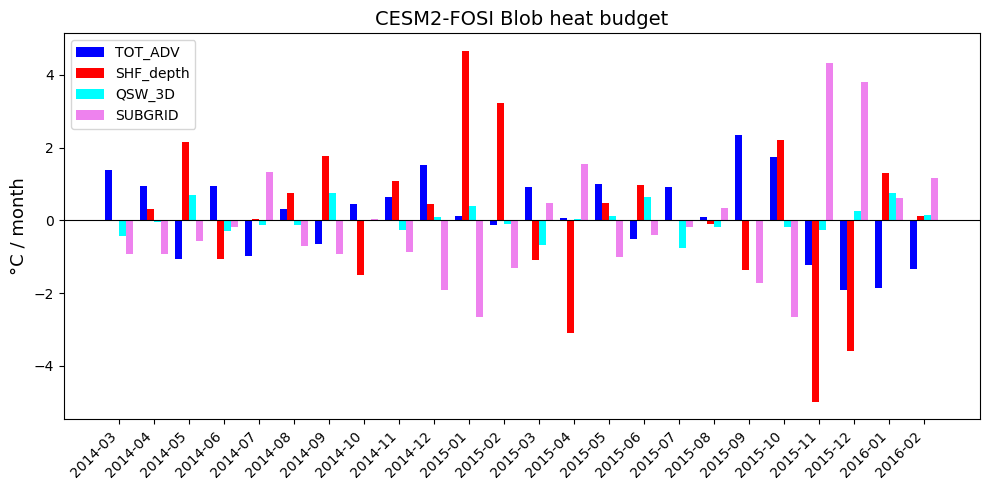

In [37]:
fig, ax = plt.subplots(figsize=(10, 5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}

x = np.arange(len(fosi_hb_profile['TOT_ADV'].time))
width = 0.2

for i, (term, ts) in enumerate(fosi_hb_profile.items()):
    ax.bar(x + i*width, ts.values, width, label=term, color=colors[term])

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels([str(t)[:7] for t in fosi_hb_profile['TOT_ADV'].time.values], rotation=45, ha='right')
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title('CESM2-FOSI Blob heat budget', fontsize=14)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [38]:
def three_phases_1d(ts, pre_post_months=2):
    """
    Splits a padded 1D time series (time,) into Pre-MHW, detection, Post-MHW phase averages.
    """
    pre_mhw = float(ts.isel(time=slice(0, pre_post_months)).mean())
    detection = float(ts.isel(time=slice(pre_post_months, -pre_post_months)).mean())
    post_mhw = float(ts.isel(time=slice(-pre_post_months, None)).mean())
    return {'Pre-MHW': pre_mhw, 'detection': detection, 'Post-MHW': post_mhw}

In [39]:
# ============================================================
# Apply to FOSI Blob's heat budget
# ============================================================
fosi_hb_phases = {term: three_phases_1d(ts) for term, ts in fosi_hb_profile.items()}

for term, phases in fosi_hb_phases.items():
    print(f"{term}: Pre-MHW={phases['Pre-MHW']:.3f}, detection={phases['detection']:.3f}, Post-MHW={phases['Post-MHW']:.3f}")

TOT_ADV: Pre-MHW=1.166, detection=0.226, Post-MHW=-1.605
SHF_depth: Pre-MHW=0.155, detection=0.047, Post-MHW=0.717
QSW_3D: Pre-MHW=-0.243, detection=0.001, Post-MHW=0.446
SUBGRID: Pre-MHW=-0.932, detection=-0.161, Post-MHW=0.889


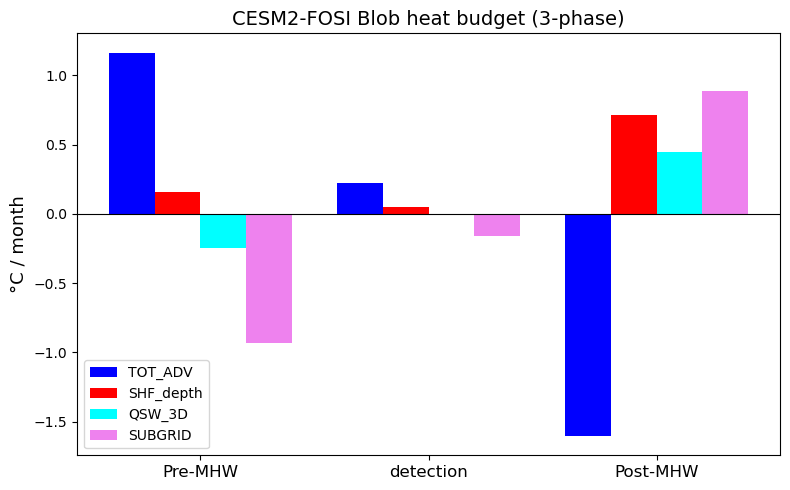

In [40]:
# ============================================================
# Plot: grouped bars, 3 phases instead of full time series
# ============================================================
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(8, 5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
phase_names = ['Pre-MHW', 'detection', 'Post-MHW']
x = np.arange(len(phase_names))
width = 0.2

for i, (term, phases) in enumerate(fosi_hb_phases.items()):
    values = [phases[p] for p in phase_names]
    ax.bar(x + i*width, values, width, label=term, color=colors[term])

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels(phase_names, fontsize=12)
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title('CESM2-FOSI Blob heat budget (3-phase)', fontsize=14)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [41]:
def five_phases_1d(ts, pre_post_months=2):
    """
    Splits a padded 1D time series into 5 phases:
    Pre-MHW, pre-peak, peak (month of largest |anomaly| magnitude, using TOT_ADV+SHF_depth+QSW_3D+SUBGRID sum
    or a specified reference series), decline, Post-MHW.
    """
    n_total = len(ts.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months

    pre_mhw = float(ts.isel(time=slice(0, core_start)).mean())
    post_mhw = float(ts.isel(time=slice(-pre_post_months, None)).mean())

    core_ts = ts.isel(time=slice(core_start, core_end))
    peak_idx_within_core = int(np.abs(core_ts.values).argmax())  # peak magnitude, either sign
    peak_idx_global = core_start + peak_idx_within_core

    has_prepeak = peak_idx_global > core_start
    has_decline = peak_idx_global < core_end - 1

    prepeak = float(ts.isel(time=slice(core_start, peak_idx_global)).mean()) if has_prepeak else np.nan
    peak = float(ts.isel(time=peak_idx_global))
    decline = float(ts.isel(time=slice(peak_idx_global + 1, core_end)).mean()) if has_decline else np.nan

    return {'Pre-MHW': pre_mhw, 'pre-peak': prepeak, 'peak': peak, 'decline': decline, 'Post-MHW': post_mhw}

In [43]:
def five_phases_shared_peak(term_profiles, pre_post_months=2):
    """
    term_profiles: dict of {term_name: (time,) DataArray}, all sharing the same time axis.
    Finds ONE peak month (based on the net tendency = sum of all terms), then applies
    that same peak index to every term.
    """
    tend_temp = sum(term_profiles.values())  # net tendency, same time axis as all terms

    n_total = len(tend_temp.time)
    core_start = pre_post_months
    core_end = n_total - pre_post_months

    core_tend = tend_temp.isel(time=slice(core_start, core_end))
    peak_idx_within_core = int(np.abs(core_tend.values).argmax())
    peak_idx_global = core_start + peak_idx_within_core

    has_prepeak = peak_idx_global > core_start
    has_decline = peak_idx_global < core_end - 1

    result = {}
    for term, ts in term_profiles.items():
        pre_mhw = float(ts.isel(time=slice(0, core_start)).mean())
        post_mhw = float(ts.isel(time=slice(-pre_post_months, None)).mean())
        prepeak = float(ts.isel(time=slice(core_start, peak_idx_global)).mean()) if has_prepeak else np.nan
        peak = float(ts.isel(time=peak_idx_global))
        decline = float(ts.isel(time=slice(peak_idx_global + 1, core_end)).mean()) if has_decline else np.nan

        result[term] = {'Pre-MHW': pre_mhw, 'pre-peak': prepeak, 'peak': peak, 'decline': decline, 'Post-MHW': post_mhw}

    peak_date = tend_temp.time.values[peak_idx_global]
    return result, peak_date

In [44]:
fosi_hb_phases_5_shared, peak_date = five_phases_shared_peak(fosi_hb_profile)

print(f"Peak month (shared, based on net tendency): {str(peak_date)[:7]}")
for term, phases in fosi_hb_phases_5_shared.items():
    print(term, phases)

Peak month (shared, based on net tendency): 2015-01
TOT_ADV {'Pre-MHW': 1.166025977413179, 'pre-peak': 0.1425405104461562, 'peak': 0.1106503673099485, 'decline': 0.297198316562757, 'Post-MHW': -1.6050910295474639}
SHF_depth {'Pre-MHW': 0.15504357695854068, 'pre-peak': 0.4556365308132216, 'peak': 4.663633052585285, 'decline': -0.6692494006633939, 'Post-MHW': 0.7166076231651508}
QSW_3D {'Pre-MHW': -0.24302772368393752, 'pre-peak': 0.09606774737869576, 'peak': 0.3903315365010494, 'decline': -0.10354534780848136, 'Post-MHW': 0.44646837281547425}
SUBGRID {'Pre-MHW': -0.9319827473992504, 'pre-peak': -0.4726719609817388, 'peak': -2.6647983800899517, 'decline': 0.29272775152012315, 'Post-MHW': 0.8890388482612064}


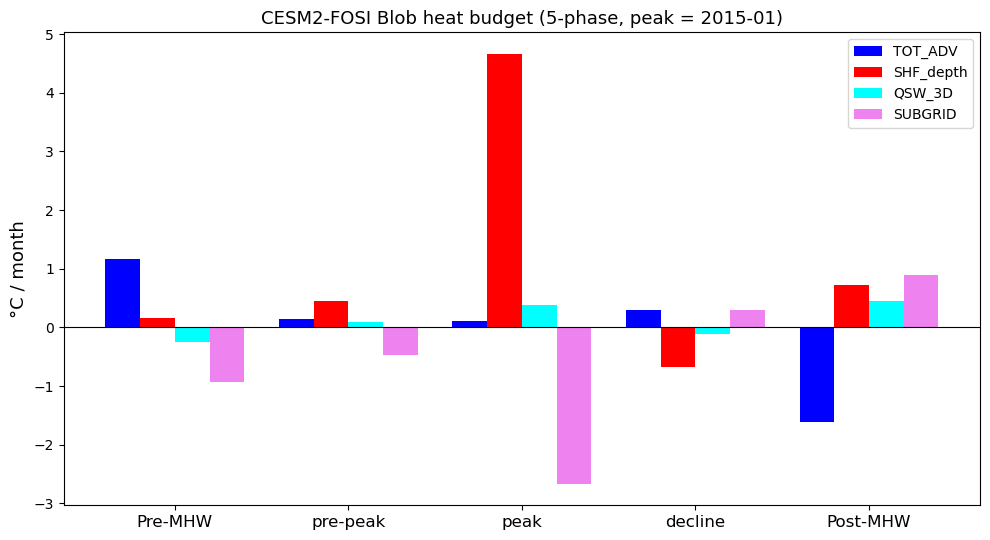

In [45]:
fig, ax = plt.subplots(figsize=(10, 5.5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
phase_names = ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']
x = np.arange(len(phase_names))
width = 0.2

for i, (term, phases) in enumerate(fosi_hb_phases_5_shared.items()):
    values = [phases[p] for p in phase_names]
    ax.bar(x + i*width, values, width, label=term, color=colors[term])

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels(phase_names, fontsize=12)
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title(f'CESM2-FOSI Blob heat budget (5-phase, peak = {str(peak_date)[:7]})', fontsize=13)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [46]:
# Compute the net tendency (sum of all 4 terms) phases the same way
tend_temp_profile = fosi_hb_profile['TOT_ADV'] + fosi_hb_profile['SHF_depth'] + fosi_hb_profile['QSW_3D'] + fosi_hb_profile['SUBGRID']

# Reuse the same peak index found earlier for consistency
n_total = len(tend_temp_profile.time)
core_start, core_end = 2, n_total - 2
core_tend = tend_temp_profile.isel(time=slice(core_start, core_end))
peak_idx_within_core = int(np.abs(core_tend.values).argmax())
peak_idx_global = core_start + peak_idx_within_core

tend_phases = {
    'Pre-MHW': float(tend_temp_profile.isel(time=slice(0, core_start)).mean()),
    'pre-peak': float(tend_temp_profile.isel(time=slice(core_start, peak_idx_global)).mean()),
    'peak': float(tend_temp_profile.isel(time=peak_idx_global)),
    'decline': float(tend_temp_profile.isel(time=slice(peak_idx_global + 1, core_end)).mean()),
    'Post-MHW': float(tend_temp_profile.isel(time=slice(-2, None)).mean()),
}
print("Temperature tendency:", tend_phases)

Temperature tendency: {'Pre-MHW': 0.1460590832885318, 'pre-peak': 0.2215728276563348, 'peak': 2.4998165763063316, 'decline': -0.18286868038899506, 'Post-MHW': 0.4470238146943676}


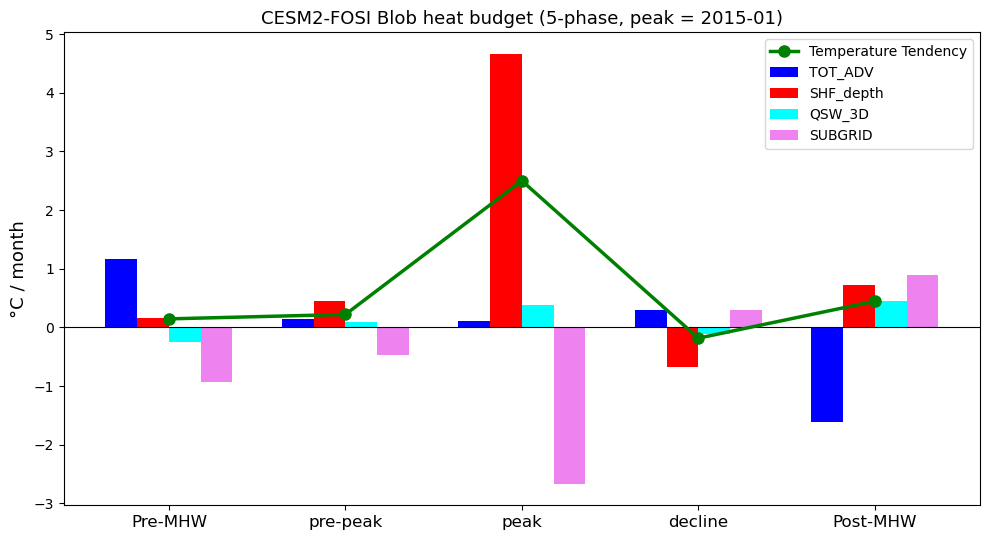

In [47]:
fig, ax = plt.subplots(figsize=(10, 5.5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
phase_names = ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']
x = np.arange(len(phase_names))
width = 0.18

for i, (term, phases) in enumerate(fosi_hb_phases_5_shared.items()):
    values = [phases[p] for p in phase_names]
    ax.bar(x + i*width, values, width, label=term, color=colors[term])

# Add temperature tendency as an overlaid line, not a bar
tend_values = [tend_phases[p] for p in phase_names]
ax.plot(x + 1.5*width, tend_values, color='green', marker='o', markersize=8, linewidth=2.5,
        label='Temperature Tendency', zorder=10)

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels(phase_names, fontsize=12)
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title(f'CESM2-FOSI Blob heat budget (5-phase, peak = {str(peak_date)[:7]})', fontsize=13)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [4]:
# ============================================================
# Load and merge both files for one member, check closure
# ============================================================
def load_lens_heat_budget_full(member_id):
    ds_terms = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_{member_id}_03172026.nc'
    )
    ds_tend = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_onlytemptend_{member_id}_07242026.nc'
    )
    # Merge into one dataset
    merged = xr.merge([ds_terms, ds_tend])
    return merged

heat_budget_0 = load_lens_heat_budget_full(0)
print(list(heat_budget_0.data_vars))
print(heat_budget_0.sizes)

['TOT_ADV', 'DIA_IMPVF_TEMP', 'SHF_depth', 'QSW_3D', 'TEND_TEMP']
Frozen({'time': 504, 'nlat_t': 384, 'nlon_t': 320})


In [5]:
# ============================================================
# Check closure: TEND_TEMP ≈ TOT_ADV + DIA_IMPVF_TEMP + SHF_depth + QSW_3D
# ============================================================
residual = heat_budget_0['TEND_TEMP'] - (
    heat_budget_0['TOT_ADV'] + heat_budget_0['DIA_IMPVF_TEMP'] +
    heat_budget_0['SHF_depth'] + heat_budget_0['QSW_3D']
)

print(f"Residual: min={float(residual.min()):.6e}, max={float(residual.max()):.6e}, mean={float(residual.mean()):.6e}")

Residual: min=-2.218088e-03, max=1.908252e-03, mean=-4.364328e-06


In [52]:
# ============================================================
# Full pipeline: load, merge, compute SUBGRID, detrend, extract per-analog composites
# ============================================================
def load_lens_heat_budget_full(member_id):
    ds_terms = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_{member_id}_03172026.nc'
    )
    ds_tend = xr.open_dataset(
        f'/glade/derecho/scratch/cmendiola/heat_budget_blob_fosi_lens2_paper/heat_budget_onlytemptend_{member_id}_07242026.nc'
    )
    merged = xr.merge([ds_terms, ds_tend])
    merged['SUBGRID'] = merged['TEND_TEMP'] - (merged['TOT_ADV'] + merged['SHF_depth'] + merged['QSW_3D'])
    return merged[['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID']]  # keep only the four terms we need


NO_SEC_IN_1_MON = 2629740

def detrend_heat_budget_member(ds):
    detrended = {}
    for term in ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'TEND_TEMP']:  # add TEND_TEMP here
        term_nan = xr.where(ds[term] == 0., np.nan, ds[term]) * NO_SEC_IN_1_MON
        mean, trend, seasonal, notrend = afuncs.calculate_pop_grid_anomalies_trend_features(term_nan)
        detrended[term] = notrend
    return detrended

In [53]:
# ============================================================
# Test on member 0 first
# ============================================================
t0 = time.time()
hb_0 = load_lens_heat_budget_full(0)
hb_0_detrended = detrend_heat_budget_member(hb_0)
print(f"Time: {time.time()-t0:.1f}s")
for term, da in hb_0_detrended.items():
    print(term, da.dims, da.shape)

KeyError: "No variable named 'TEND_TEMP'. Variables on the dataset include ['TOT_ADV', 'SHF_depth', 'QSW_3D', 'SUBGRID', 'nlon_t', 'nlat_t', 'time', 'TLONG', 'TLAT']"

In [28]:
# ============================================================
# Per-analog heat budget extraction: crop to canonical footprint, 3-phase split, one member at a time
# ============================================================
output_dir_hb = '/glade/derecho/scratch/cassiacai/heat_budget_profiles_by_member'
os.makedirs(output_dir_hb, exist_ok=True)

def process_one_member_heat_budget(member_id, labels_full, analog_ids_for_member, NEPac_mask):
    if not analog_ids_for_member:
        print(f"Member {member_id}: no analogs, skipping")
        return {}

    hb_raw = load_lens_heat_budget_full(member_id)
    hb_detrended = detrend_heat_budget_member(hb_raw)

    # CROP each term to match NEPac_mask's region BEFORE masking
    hb_cropped = {
        term: da.isel(nlat_t=lat_slice, nlon_t=lon_slice)
        for term, da in hb_detrended.items()
    }

    # Now apply canonical mask (shapes match)
    hb_masked = {term: da.where(NEPac_mask == 1) for term, da in hb_cropped.items()}

    member_labels = labels_full.isel(ensemble_member=member_id)
    member_profiles = {}

    for analog_id in analog_ids_for_member:
        key = (member_id, analog_id)

        mask = (member_labels == analog_id)
        times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)
        if len(times_present) == 0:
            continue

        full_time_index = member_labels.time
        first_idx = int(np.where(full_time_index.values == times_present.values[0])[0][0])
        last_idx = int(np.where(full_time_index.values == times_present.values[-1])[0][0])

        pad_start = max(0, first_idx - 2)
        pad_end = min(len(full_time_index) - 1, last_idx + 2)
        padded_times = full_time_index.isel(time=slice(pad_start, pad_end + 1))

        term_profiles = {}
        for term, da in hb_masked.items():
            term_profiles[term] = da.sel(time=padded_times).mean(dim=('nlat_t','nlon_t')).compute()

        member_profiles[key] = {
            'terms': term_profiles,
            'season': pd.Timestamp(str(times_present.values[0])).month,
        }

    print(f"Member {member_id} done")
    return member_profiles

In [26]:
lat_slice = slice(204, 367)
lon_slice = slice(190, 280)

mean_image_pop_files = [f'/glade/derecho/scratch/cassiacai/mean_image_{i}_POP.nc' for i in range(1, 8)]
mean_images_pop = [xr.open_dataset(file) for file in mean_image_pop_files]
masks_pop = [xr.where(image.__xarray_dataarray_variable__ > 0.1, 1, 0) for image in mean_images_pop]
NEPac_MHW_renamed_latlon = masks_pop[2].isel(nlat=lat_slice, nlon=lon_slice).rename({'nlat': 'nlat_t', 'nlon': 'nlon_t'})

In [29]:
# ============================================================
# Test on member 0 first
# ============================================================
t0 = time.time()
hb_profiles_test = process_one_member_heat_budget(
    0, da_mhwobj_labels_by_method['linear'], blob_analog_ids['linear'][0], NEPac_MHW_renamed_latlon
)
print(f"Time: {time.time()-t0:.1f}s")
print(f"Analogs: {len(hb_profiles_test)}")

sample_key = list(hb_profiles_test.keys())[0]
print(sample_key)
for term, ts in hb_profiles_test[sample_key]['terms'].items():
    print(f"  {term}: {ts.dims}, {ts.shape}, range=({float(ts.min()):.3f}, {float(ts.max()):.3f})")

Member 0 done
Time: 4.5s
Analogs: 4
(0, 28.0)
  TOT_ADV: ('time',), (8,), range=(-1.620, 0.649)
  SHF_depth: ('time',), (8,), range=(-1.574, 4.168)
  QSW_3D: ('time',), (8,), range=(0.068, 1.808)
  SUBGRID: ('time',), (8,), range=(-2.515, 1.680)


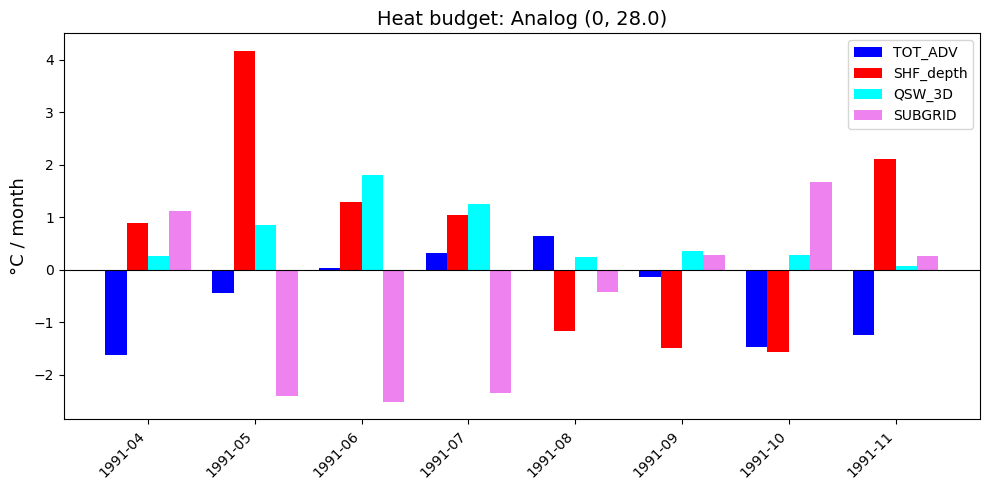

In [30]:
import matplotlib.pyplot as plt
import numpy as np

key = (0, 28.0)
terms = hb_profiles_test[key]['terms']

fig, ax = plt.subplots(figsize=(10, 5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}

x = np.arange(len(terms['TOT_ADV'].time))
width = 0.2

for i, (term, ts) in enumerate(terms.items()):
    ax.bar(x + i*width, ts.values, width, label=term, color=colors[term])

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels([str(t)[:7] for t in terms['TOT_ADV'].time.values], rotation=45, ha='right')
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title(f'Heat budget: Analog {key}', fontsize=14)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [48]:
# ============================================================
# Apply five_phases_shared_peak to the analog's heat budget profile
# ============================================================
key = (0, 28.0)
analog_terms = hb_profiles_test[key]['terms']

analog_hb_phases_5, analog_peak_date = five_phases_shared_peak(analog_terms)

print(f"Analog {key} peak month: {str(analog_peak_date)[:7]}")
for term, phases in analog_hb_phases_5.items():
    print(term, phases)

Analog (0, 28.0) peak month: 1991-09
TOT_ADV {'Pre-MHW': -1.0360346581012294, 'pre-peak': 0.33887262541074187, 'peak': -0.13894141136103647, 'decline': nan, 'Post-MHW': -1.3604887499819442}
SHF_depth {'Pre-MHW': 2.5289101677863552, 'pre-peak': 0.3906978107473713, 'peak': -1.4937943990140097, 'decline': nan, 'Post-MHW': 0.2678804897546345}
QSW_3D {'Pre-MHW': 0.5558222621046087, 'pre-peak': 1.0995881021649268, 'peak': 0.35818563809085174, 'decline': nan, 'Post-MHW': 0.17394675890329458}
SUBGRID {'Pre-MHW': -0.6476013704560415, 'pre-peak': -1.7612023217490949, 'peak': 0.2870416370454556, 'decline': nan, 'Post-MHW': 0.9747943805567744}


In [49]:
# ============================================================
# Temperature tendency for the analog (sum of 4 terms)
# ============================================================
analog_tend_temp_profile = analog_terms['TOT_ADV'] + analog_terms['SHF_depth'] + analog_terms['QSW_3D'] + analog_terms['SUBGRID']

n_total = len(analog_tend_temp_profile.time)
core_start, core_end = 2, n_total - 2
core_tend = analog_tend_temp_profile.isel(time=slice(core_start, core_end))
peak_idx_within_core = int(np.abs(core_tend.values).argmax())
peak_idx_global = core_start + peak_idx_within_core

analog_tend_phases = {
    'Pre-MHW': float(analog_tend_temp_profile.isel(time=slice(0, core_start)).mean()),
    'pre-peak': float(analog_tend_temp_profile.isel(time=slice(core_start, peak_idx_global)).mean()) if peak_idx_global > core_start else np.nan,
    'peak': float(analog_tend_temp_profile.isel(time=peak_idx_global)),
    'decline': float(analog_tend_temp_profile.isel(time=slice(peak_idx_global + 1, core_end)).mean()) if peak_idx_global < core_end - 1 else np.nan,
    'Post-MHW': float(analog_tend_temp_profile.isel(time=slice(-2, None)).mean()),
}
print("Temperature tendency:", analog_tend_phases)

Temperature tendency: {'Pre-MHW': 1.401096401333693, 'pre-peak': 0.06795621657394461, 'peak': -0.9875085352387389, 'decline': nan, 'Post-MHW': 0.056132879232759225}


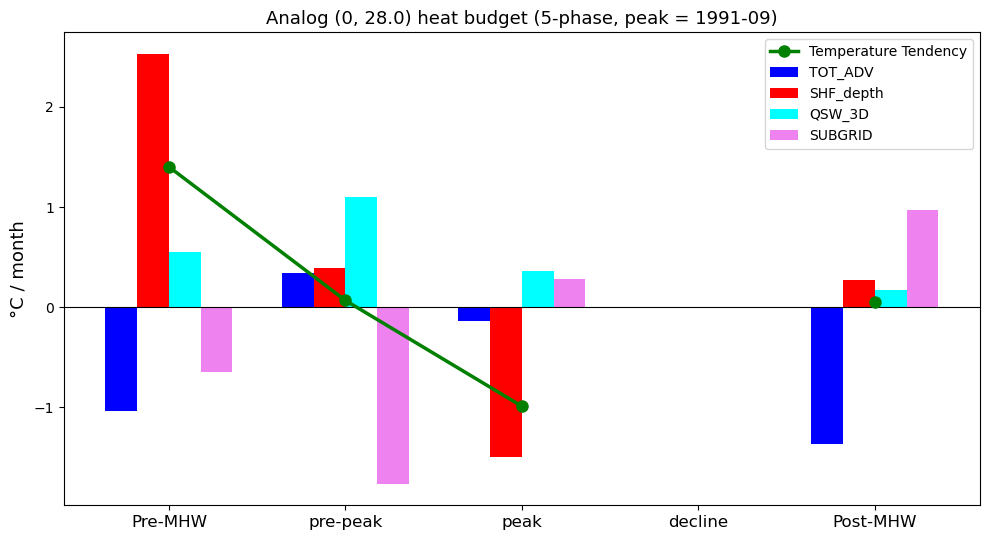

In [51]:
# ============================================================
# Plot: same style as the FOSI Blob figure
# ============================================================
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(10, 5.5))

colors = {'TOT_ADV': 'blue', 'SHF_depth': 'red', 'QSW_3D': 'cyan', 'SUBGRID': 'violet'}
phase_names = ['Pre-MHW', 'pre-peak', 'peak', 'decline', 'Post-MHW']
x = np.arange(len(phase_names))
width = 0.18

for i, (term, phases) in enumerate(analog_hb_phases_5.items()):
    values = [phases[p] for p in phase_names]
    ax.bar(x + i*width, values, width, label=term, color=colors[term])

tend_values = [analog_tend_phases[p] for p in phase_names]
ax.plot(x + 1.5*width, tend_values, color='green', marker='o', markersize=8, linewidth=2.5,
        label='Temperature Tendency', zorder=10)

ax.axhline(0, color='k', linewidth=0.8)
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels(phase_names, fontsize=12)
ax.set_ylabel('°C / month', fontsize=13)
ax.set_title(f'Analog {key} heat budget (5-phase, peak = {str(analog_peak_date)[:7]})', fontsize=13)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
# sdjk

In [ ]:
# ============================================================
# Heat budget for each Blob-analog, using CONTEMPORANEOUS footprint, 155m, 3-phase
# ============================================================
def get_analog_heat_budget(member_id, analog_id, labels_da, heat_terms_dict, cell_area_da):
    member_labels = labels_da.isel(ensemble_member=member_id)
    mask = (member_labels == analog_id)
    times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)
    if len(times_present) == 0:
        return None

    mask_trimmed = mask.sel(time=times_present)
    budget = {}
    for term_name, term_da in heat_terms_dict.items():
        term_masked = term_da.isel(ensemble_member=member_id).sel(time=times_present).where(mask_trimmed)
        budget[term_name] = term_masked.mean(dim=('lat','lon'))  # area-weighted avg per month

    # 3-phase split: Pre-MHW (2mo before), detection, Post-MHW (2mo after)
    # (requires access to full time axis to grab the 2 months before/after)
    return budget, times_present

# heat_terms_dict = {'TEND_TEMP': ..., 'TOT_ADV': ..., 'SHF_depth': ..., 'QSW_3D': ..., 'SUBGRID': ...}
# populate this from your LENS heat-budget files, same variable-name caution as FOSI (TOTADV vs TOT_ADV, etc.)

analog_heat_budgets = {}
for member_id in range(100):
    for analog_id in blob_analog_ids['linear'][member_id]:
        result = get_analog_heat_budget(member_id, analog_id, da_mhwobj_labels_by_method['linear'], heat_terms_dict, cell_area_da)
        if result:
            analog_heat_budgets[(member_id, analog_id)] = result

# Composite across all analogs, per phase, per term
composite_by_phase = {}
for phase in ['Pre-MHW', 'detection', 'Post-MHW']:
    composite_by_phase[phase] = {}
    for term in heat_terms_dict:
        # gather all analogs' phase-mean value for this term, then average across analogs
        pass  # fill in phase-extraction logic once heat_terms_dict is populated

In [ ]:
# ============================================================
# Reuse the seasonal grouping from Section 3.3, extended to all 4 seasons (add fall)
# ============================================================
fall_analogs = {method: [] for method in base_paths}  # NEW - not yet computed this session

for method in base_paths:
    labels_full_m = da_mhwobj_labels_by_method[method]
    for member_id in range(100):
        member_labels = labels_full_m.isel(ensemble_member=member_id)
        for analog_id in blob_analog_ids[method][member_id]:
            first_time = member_labels.time.where((member_labels == analog_id).any(dim=('lat','lon')), drop=True)[0]
            month = first_time.dt.month.item()
            if month in [9,10,11]:
                fall_analogs[method].append((member_id, analog_id, first_time))

print({m: len(fall_analogs[m]) for m in base_paths})

# Using the CORRECTED PDO index (single shared EOF pattern)

In [9]:
# ============================================================
# Imports
# ============================================================

In [11]:
sst_fosi_noseas_NEP = xr.open_dataset('/glade/derecho/scratch/cassiacai/regridded_ssta_noseas_NEP.nc').__xarray_dataarray_variable__

# ============================================================
# Step 1: FOSI EOF (noseas, sign-corrected)
# ============================================================
sst_fosi_noseas_20N = sst_fosi_noseas_NEP.where(sst_fosi_noseas_NEP.lat > 20, drop=True)

solver = Eof(sst_fosi_noseas_20N)
eof1_pattern_noseas = -solver.eofs(neofs=1).isel(mode=0)  # sign-corrected

def project_onto_pdo_pattern(sst_anom, pattern):
    sst_anom, pattern = xr.align(sst_anom, pattern, join='inner')
    numerator = (sst_anom * pattern).sum(dim=('lat', 'lon'))
    denominator = (pattern ** 2).sum(dim=('lat', 'lon'))
    return numerator / denominator

pdo_index_fosi_noseas = project_onto_pdo_pattern(sst_fosi_noseas_20N, eof1_pattern_noseas)
pdo_std_noseas = float(pdo_index_fosi_noseas.std())
pdo_index_fosi_noseas_norm = pdo_index_fosi_noseas / pdo_std_noseas

pdo_during_blob_noseas = pdo_index_fosi_noseas_norm.sel(time=blob_times)
print(f"PDO during FOSI Blob (noseas, sign-corrected): "
      f"mean={float(pdo_during_blob_noseas.mean()):.2f}, max={float(pdo_during_blob_noseas.max()):.2f}")

PDO during FOSI Blob (noseas, sign-corrected): mean=1.48, max=2.22


In [12]:
# ============================================================
# Step 2: Project all CESM2-LENS members onto the SAME sign-corrected pattern
# ============================================================
ssta_lens_noseas = xr.open_mfdataset(
    [f'/glade/work/cmendiola/data_rm_seasonalcycle_mean/ens_{i}_ssta.nc' for i in range(100)],
    combine='nested', concat_dim='ensemble_member'
)['__xarray_dataarray_variable__']

pdo_index_members_noseas = {}
for member_id in range(100):
    sst_member = ssta_lens_noseas.isel(ensemble_member=member_id).sel(time=slice('1979-01','2020-12'))
    sst_member_20N = sst_member.where(sst_member.lat > 20, drop=True)
    pdo_index_members_noseas[member_id] = project_onto_pdo_pattern(sst_member_20N, eof1_pattern_noseas) / pdo_std_noseas

pdo_index_lens_noseas = xr.concat(list(pdo_index_members_noseas.values()), dim='member').assign_coords(member=np.arange(100))

print(f"LENS PDO index range (noseas, sign-corrected): "
      f"{float(pdo_index_lens_noseas.min()):.2f} to {float(pdo_index_lens_noseas.max()):.2f}")

LENS PDO index range (noseas, sign-corrected): -4.82 to 4.57


In [13]:
# ============================================================
# Step 3: Per-analog PDO stats (mean/max during event lifetime)
# ============================================================
analog_pdo_stats_noseas = {}
labels_full = da_mhwobj_labels_by_method['linear']  # analog IDENTIFICATION still uses linear method's Blob-analogs

for member_id in range(100):
    member_labels = labels_full.isel(ensemble_member=member_id)
    member_pdo = pdo_index_lens_noseas.sel(member=member_id)
    for analog_id in blob_analog_ids['linear'][member_id]:
        mask = (member_labels == analog_id)
        times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)
        if len(times_present) == 0:
            continue
        pdo_vals = member_pdo.sel(time=times_present)
        analog_pdo_stats_noseas[(member_id, analog_id)] = {
            'pdo_mean': float(pdo_vals.mean()),
            'pdo_max': float(pdo_vals.max()),
        }

print(f"PDO stats (noseas) computed for {len(analog_pdo_stats_noseas)} analogs")

PDO stats (noseas) computed for 331 analogs


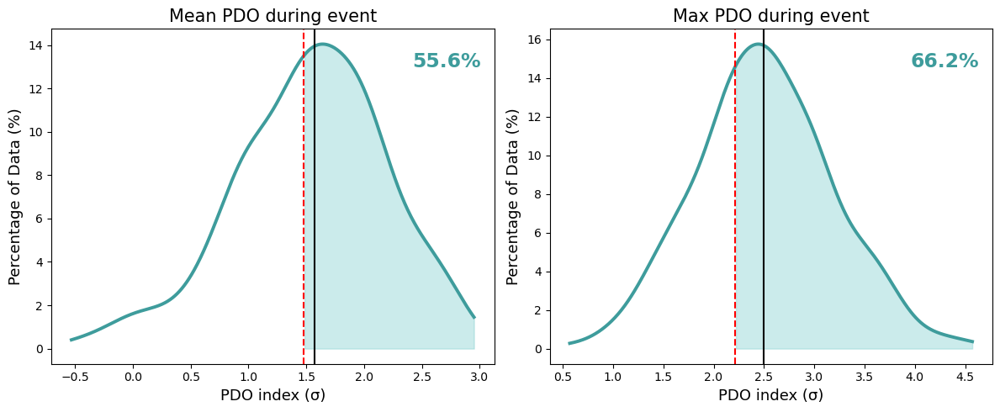

Return period (mean PDO ≥ Blob's): 22.8 years
Return period (max PDO ≥ Blob's): 19.2 years


In [111]:
# ============================================================
# Step 4: KDE comparison + CORRECTED percentage/return-period (matching the shaded region this time)
# ============================================================
pdo_mean_values = np.array([v['pdo_mean'] for v in analog_pdo_stats_noseas.values()])
pdo_max_values = np.array([v['pdo_max'] for v in analog_pdo_stats_noseas.values()])

blob_pdo_mean = float(pdo_during_blob_noseas.mean())
blob_pdo_max = float(pdo_during_blob_noseas.max())

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, values, blob_val, title in zip(
    axes, [pdo_mean_values, pdo_max_values], [blob_pdo_mean, blob_pdo_max],
    ['Mean PDO during event', 'Max PDO during event']
):
    counts, bin_edges = np.histogram(values, bins=15)
    bin_width = bin_edges[1] - bin_edges[0]
    kde = gaussian_kde(values)
    x = np.linspace(values.min(), values.max(), 500)
    y_pct = kde(x) * bin_width * 100

    ax.plot(x, y_pct, color='#3E9C9C', linewidth=2.8)
    mask = x >= blob_val
    ax.fill_between(x[mask], y_pct[mask], color='#7FCFCF', alpha=0.4)

    median_val = np.median(values)
    ax.axvline(blob_val, color='red', linestyle='--', linewidth=1.5)
    ax.axvline(median_val, color='k', linestyle='-', linewidth=1.5)

    pct = 100 * np.mean(values >= blob_val)  # CORRECTED - matches the shaded tail now
    ax.text(0.97, 0.93, f"{pct:.1f}%", transform=ax.transAxes, ha='right', va='top',
            fontsize=17, color='#3E9C9C', fontweight='bold')

    ax.set_title(title, fontsize=15)
    ax.set_xlabel('PDO index (σ)', fontsize=13)
    ax.set_ylabel('Percentage of Data (%)', fontsize=13)

plt.tight_layout()
plt.show()

N_years = 100 * 42
n = len(pdo_max_values)
p_mean = np.mean(pdo_mean_values >= blob_pdo_mean)
p_max = np.mean(pdo_max_values >= blob_pdo_max)
print(f"Return period (mean PDO ≥ Blob's): {N_years/(n*p_mean):.1f} years" if p_mean > 0 else "p=0, return period > record length")
print(f"Return period (max PDO ≥ Blob's): {N_years/(n*p_max):.1f} years" if p_max > 0 else "p=0, return period > record length")

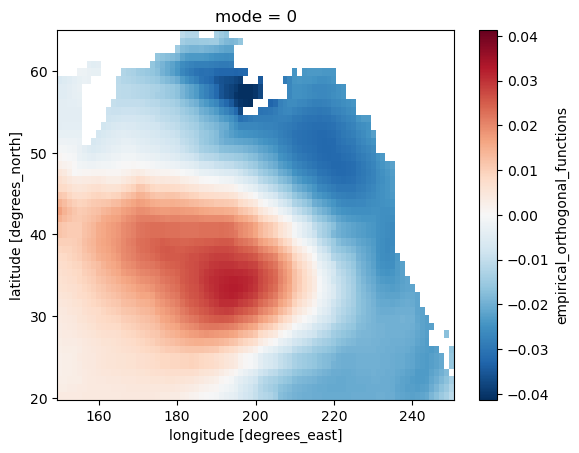

In [100]:
sst_fosi_noseas_NEP = xr.open_dataset('/glade/derecho/scratch/cassiacai/regridded_ssta_noseas_NEP.nc').__xarray_dataarray_variable__

# ============================================================
# Step 2 (once FOSI noseas equivalent is confirmed): Compute EOF, north of 20N
# ============================================================
sst_fosi_noseas_20N = sst_fosi_noseas_NEP.where(sst_fosi_noseas_NEP.lat > 20, drop=True)

solver = Eof(sst_fosi_noseas_20N)
eof1_pattern_noseas = solver.eofs(neofs=1).isel(mode=0)

eof1_pattern_flipped = eof1_pattern_noseas
eof1_pattern_flipped.plot()

In [104]:
eof1_pattern_noseas_fixed = -eof1_pattern_noseas

# Recompute everything downstream with the sign-corrected pattern
pdo_index_fosi_noseas = project_onto_pdo_pattern(sst_fosi_noseas_20N, eof1_pattern_noseas_fixed)
pdo_std_noseas = float(pdo_index_fosi_noseas.std())
pdo_index_fosi_noseas_norm = pdo_index_fosi_noseas / pdo_std_noseas

pdo_during_blob_noseas = pdo_index_fosi_noseas_norm.sel(time=blob_times)
print(f"PDO during FOSI Blob (sign-corrected): mean={float(pdo_during_blob_noseas.mean()):.2f}, "
      f"max={float(pdo_during_blob_noseas.max()):.2f}")

PDO during FOSI Blob (sign-corrected): mean=1.48, max=2.22


In [105]:
# ============================================================
# Step 4: Project all CESM2-LENS members onto the SAME noseas-based pattern
# ============================================================
ssta_lens_noseas = xr.open_mfdataset(
    [f'/glade/work/cmendiola/data_rm_seasonalcycle_mean/ens_{i}_ssta.nc' for i in range(100)],
    combine='nested', concat_dim='ensemble_member'
)['__xarray_dataarray_variable__']

pdo_index_members_noseas = {}
for member_id in range(100):
    sst_member = ssta_lens_noseas.isel(ensemble_member=member_id).sel(time=slice('1979-01','2020-12'))
    sst_member_20N = sst_member.where(sst_member.lat > 20, drop=True)
    pdo_index_members_noseas[member_id] = project_onto_pdo_pattern(sst_member_20N, eof1_pattern_noseas) / pdo_std_noseas

pdo_index_lens_noseas = xr.concat(list(pdo_index_members_noseas.values()), dim='member').assign_coords(member=np.arange(100))

print(f"LENS PDO index range (noseas-based): {float(pdo_index_lens_noseas.min()):.2f} to {float(pdo_index_lens_noseas.max()):.2f}")

LENS PDO index range (noseas-based): -4.57 to 4.82


In [80]:
# ============================================================
# Step 1: Load detrended/deseasonalized SST anomalies, north of 20°N, for FOSI (the reference dataset)
# ============================================================
# regridded_ssta_no_trend_NEP is FOSI's detrended SSTa, already restricted to 5-65N, 150-250E
# Need the broader North Pacific domain, north of 20N specifically, for the PDO EOF calculation

sst_fosi_noseas_NEP.to_netcdf('/glade/derecho/scratch/cassiacai/regridded_ssta_noseas_NEP.nc')

sst_fosi_notrend = xr.open_dataset('/glade/derecho/scratch/cassiacai/regridded_ssta_no_trend_NEP.nc')['__xarray_dataarray_variable__']
sst_fosi_notrend_20N = sst_fosi_notrend.where(sst_fosi_notrend.lat > 20, drop=True)

print(sst_fosi_notrend_20N.dims, sst_fosi_notrend_20N.shape)

('time', 'lat', 'lon') (504, 48, 81)


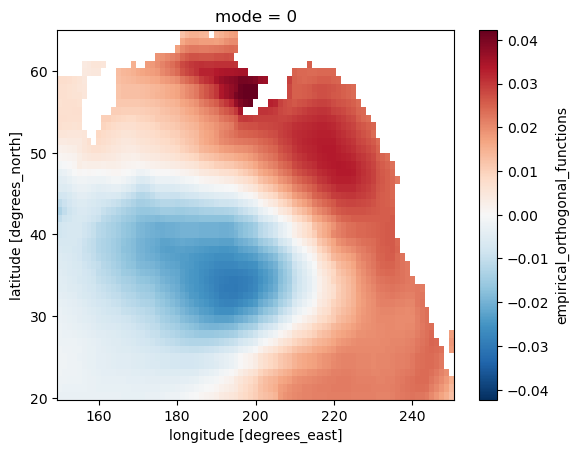

In [81]:
# ============================================================
# Step 2: Compute the EOF solver on FOSI, extract the single leading spatial pattern
# ============================================================
solver = Eof(sst_fosi_notrend_20N)
eof1_pattern = solver.eofs(neofs=1).isel(mode=0)  # fixed (lat, lon) pattern

# Sanity check - should look like a PDO horseshoe pattern
eof1_pattern.plot()

In [82]:
# ============================================================
# Step 3: Projection function - projects any dataset's anomalies onto the fixed EOF pattern
# ============================================================
def project_onto_pdo_pattern(sst_anom, pattern):
    sst_anom, pattern = xr.align(sst_anom, pattern, join='inner')
    numerator = (sst_anom * pattern).sum(dim=('lat', 'lon'))
    denominator = (pattern ** 2).sum(dim=('lat', 'lon'))
    return numerator / denominator

In [83]:
# ============================================================
# Step 4: Project FOSI itself onto its own pattern
# ============================================================
pdo_index_fosi = project_onto_pdo_pattern(sst_fosi_notrend_20N, eof1_pattern)

# Normalize by FOSI's own standard deviation (standard PDO convention)
pdo_std = float(pdo_index_fosi.std())
pdo_index_fosi_norm = pdo_index_fosi / pdo_std

print(f"FOSI PDO index range: {float(pdo_index_fosi_norm.min()):.2f} to {float(pdo_index_fosi_norm.max()):.2f}")

FOSI PDO index range: -2.29 to 2.38


In [85]:
# ============================================================
# Step 5: Project every CESM2-LENS member onto the SAME fixed FOSI-derived pattern
# ============================================================
# Assumes ssta_notrend_by_method['linear'] is loaded (100-member SSTa, north of 20N subset needed)

ssta_lens_linear = xr.open_mfdataset(
    [f'/glade/work/cmendiola/data_conv_lin_trend/ens_{i}_ssta.nc' for i in range(100)],
    combine='nested', concat_dim='ensemble_member'
)['__xarray_dataarray_variable__']

pdo_index_members = {}
for member_id in range(100):
    print(member_id)
    sst_member_notrend = ssta_lens_linear.isel(ensemble_member=member_id).sel(time=slice('1979-01','2020-12'))
    sst_member_notrend_20N = sst_member_notrend.where(sst_member_notrend.lat > 20, drop=True)
    pdo_index_members[member_id] = project_onto_pdo_pattern(sst_member_notrend_20N, eof1_pattern) / pdo_std  # same normalization factor

# Combine into one DataArray with a 'member' dimension
pdo_index_lens = xr.concat(list(pdo_index_members.values()), dim='member')
pdo_index_lens = pdo_index_lens.assign_coords(member=np.arange(100))

print(f"LENS PDO index range (all members): {float(pdo_index_lens.min()):.2f} to {float(pdo_index_lens.max()):.2f}")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
LENS PDO index range (all members): -4.68 to 4.63


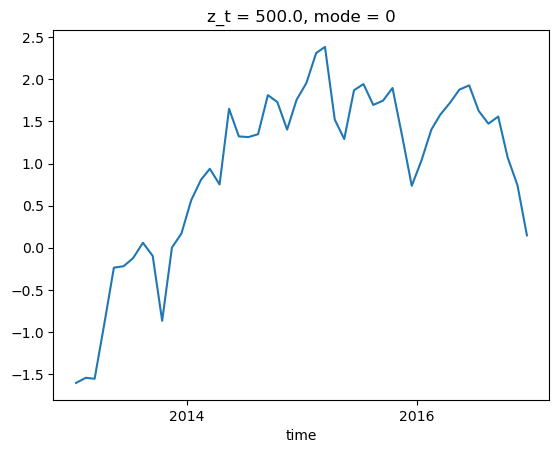

In [106]:
# ============================================================
# Sanity check: does the FOSI PDO index resemble a known real-world PDO pattern/timing?
# (e.g., strongly positive during 2014-2016, consistent with the Blob/El Nino period)
# ============================================================
pdo_index_fosi_norm.sel(time=slice('2013-01','2016-12')).plot()

In [107]:
# Check FOSI's own PDO extremes for comparison
print(f"FOSI PDO range: {float(pdo_index_fosi_norm.min()):.2f} to {float(pdo_index_fosi_norm.max()):.2f}")

# What's FOSI's PDO value during the Blob's own lifetime (May 2014 - Dec 2015)?
pdo_during_blob = pdo_index_fosi_norm.sel(time=blob_times)
print(f"PDO during FOSI Blob: mean={float(pdo_during_blob.mean()):.2f}, max={float(pdo_during_blob.max()):.2f}")

FOSI PDO range: -2.29 to 2.38
PDO during FOSI Blob: mean=1.65, max=2.38


In [88]:
analog_pdo_stats = {}
labels_full = da_mhwobj_labels_by_method['linear']

for member_id in range(100):
    print(member_id)
    member_labels = labels_full.isel(ensemble_member=member_id)
    member_pdo = pdo_index_lens.sel(member=member_id)
    for analog_id in blob_analog_ids['linear'][member_id]:
        mask = (member_labels == analog_id)
        times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)
        if len(times_present) == 0:
            continue
        pdo_vals = member_pdo.sel(time=times_present)
        analog_pdo_stats[(member_id, analog_id)] = {
            'pdo_mean': float(pdo_vals.mean()),
            'pdo_max': float(pdo_vals.max()),
        }

print(f"PDO stats computed for {len(analog_pdo_stats)} analogs")

PDO stats computed for 331 analogs


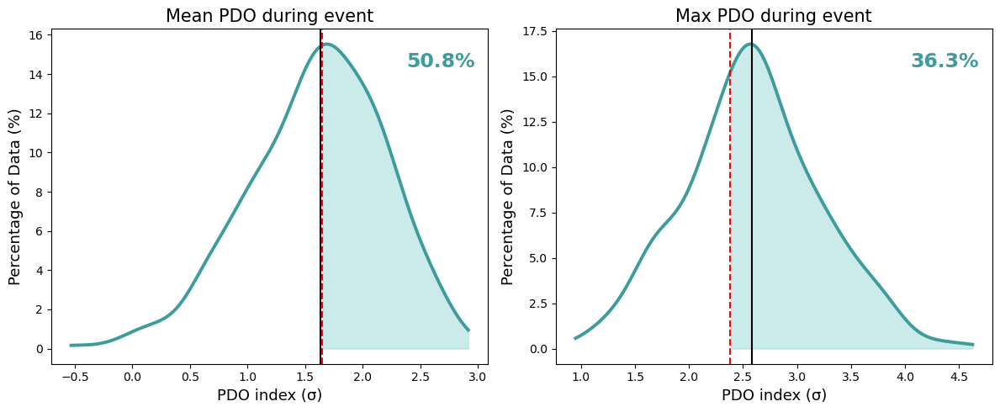

Return period (mean PDO ≥ Blob's): 25.8 years
Return period (max PDO ≥ Blob's): 19.9 years


In [91]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

pdo_mean_values = np.array([v['pdo_mean'] for v in analog_pdo_stats.values()])
pdo_max_values = np.array([v['pdo_max'] for v in analog_pdo_stats.values()])

blob_pdo_mean = 1.65
blob_pdo_max = 2.38

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, values, blob_val, title in zip(
    axes, [pdo_mean_values, pdo_max_values], [blob_pdo_mean, blob_pdo_max],
    ['Mean PDO during event', 'Max PDO during event']
):
    counts, bin_edges = np.histogram(values, bins=15)
    bin_width = bin_edges[1] - bin_edges[0]
    kde = gaussian_kde(values)
    x = np.linspace(values.min(), values.max(), 500)
    y_pct = kde(x) * bin_width * 100

    ax.plot(x, y_pct, color='#3E9C9C', linewidth=2.8)
    mask = x >= blob_val
    ax.fill_between(x[mask], y_pct[mask], color='#7FCFCF', alpha=0.4)

    median_val = np.median(values)
    ax.axvline(blob_val, color='red', linestyle='--', linewidth=1.5)
    ax.axvline(median_val, color='k', linestyle='-', linewidth=1.5)

    pct = 100 * (1 - np.mean(values >= blob_val))
    ax.text(0.97, 0.93, f"{pct:.1f}%", transform=ax.transAxes, ha='right', va='top',
            fontsize=17, color='#3E9C9C', fontweight='bold')

    ax.set_title(title, fontsize=15)
    ax.set_xlabel('PDO index (σ)', fontsize=13)
    ax.set_ylabel('Percentage of Data (%)', fontsize=13)

plt.tight_layout()
plt.show()

# Return period for PDO co-occurrence
N_years = 100 * 42
n = len(pdo_max_values)
p_mean = np.mean(pdo_mean_values >= blob_pdo_mean)
p_max = np.mean(pdo_max_values >= blob_pdo_max)
print(f"Return period (mean PDO ≥ Blob's): {N_years/(n*p_mean):.1f} years" if p_mean > 0 else "No analog exceeds - return period > record length")
print(f"Return period (max PDO ≥ Blob's): {N_years/(n*p_max):.1f} years" if p_max > 0 else "No analog exceeds - return period > record length")

In [ ]:
# ============================================================
# Using the CORRECTED PDO index (single shared EOF pattern) from earlier this session
# ============================================================
nino34_region = dict(lat=slice(-5,5), lon=slice(190,240))  # 120-170W in 0-360

def get_event_climate_context(member_id, analog_id, labels_da, pdo_index_norm, nino34_index):
    member_labels = labels_da.isel(ensemble_member=member_id)
    mask = (member_labels == analog_id)
    times_present = member_labels.time.where(mask.any(dim=('lat','lon')), drop=True)

    pdo_vals = pdo_index_norm.sel(time=times_present)
    nino_vals = nino34_index.sel(time=times_present)

    return {
        'pdo_mean': float(pdo_vals.mean()), 'pdo_max': float(pdo_vals.max()),
        'nino_mean': float(nino_vals.mean()), 'nino_max': float(nino_vals.max()),
    }

analog_climate_context = []
for member_id in range(100):
    for analog_id in blob_analog_ids['linear'][member_id]:
        ctx = get_event_climate_context(member_id, analog_id, da_mhwobj_labels_by_method['linear'],
                                          pdo_index_all_norm[member_id], nino34_members[member_id])
        analog_climate_context.append(ctx)

# Compare FOSI Blob's own PDO/ENSO context against this distribution
blob_fosi_context = get_event_climate_context(None, 94.0, fosi_blobs, pdo_index_fosi_norm, nino34_fosi)